## Capstone Project

>- Name: Vinayak Modgil<br>
>- Student pace: Full time<br>
>- Scheduled Project review date: <br>
>- Instructor Name: Yish Lim<br>
>- Github URL: 

## Predicting Indian Stock Market Prices
<br>
by Vinayak Modgil
<br>


## Project Description and Business Statement

What I am trying to accomplish with the project
1. Build an ML model and NN model that will predict whether a stock price will increase or decrease the next day
2. Prediction based on the closing price exchanged by the end of a certain day.
3. The price of a stock at the end of the day is different than at the beginning of the next day. I want to retreive this difference and figure out if stock price will go up or down based on previous data.
4. If model predicts that stock price will go up, buy at the end of the day and sell right away the next day.
5. Model will not be even close to 100% accuracy as this is an impossible feat. However, an accuracy of over 60% will give a net gain in the long run.

## Analysis and Methodology

> - [Data Collection](#Data-Collection)
> - [Feature Evaluation](#Feature-Evaluation)
> - [Reliance](#RELIANCE)
> - [HDFCBANK](#HDFC-BANK)
> - [Global Function](#Global-function)
> - [ADANIPLORTS](#ADANIPORTS)
> - [POWERGRID](#POWERGRID)
> - [ICICIBANK](#ICICI-BANK)
> - [KOTAKBANK](#KOTAK-BANK)
> - [ASTRAL](#ASTRAL)
> - [SUMCHEM](#SUMCHEM)
> - [BERGEPAINT](#BERGEPAINT)
> - [IGL](#IGL)
> - [KANSAINER](#KANSAINER)
> - [RELAXO](#RELAXO)
> - [CDSL](#CDSL)
> - [HDFCLIFE](#HDFCLIFE)
> - [IEX](#IEX)
> - [SIEMENS](#SIEMENS)
> - [CAMS](#CAMS)
> - [PRINCEPIPE](#PRINCEPIPE)
> - [SBICARD](#SBICARD)
> - [ROUTE](#ROUTE)

## Data Collection

In [43]:
#General packages
import os
import random
import warnings 
warnings.filterwarnings("ignore")
from random import gauss

#Data wrangling packages
import pandas as pd
from pandas.tseries.offsets import DateOffset
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
import seaborn as sns

#Statistical analysis package
import statsmodels.tsa.api as tsa
import statsmodels.api as sm
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARMA
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

#Machine Learning packages
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

#More sklearn packages
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

#Metrics packages
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score

#Deep Learning packages
from keras import models
from keras.models import Sequential
from keras.layers import LSTM, Conv2D, Dense, Flatten
from keras.layers import MaxPooling2D, Dropout, Activation
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16

#Hyperparameter tuning
import talos
from sklearn.model_selection import GridSearchCV

#Dl model understanding
import lime
from lime import lime_image
from lime import lime_base
from skimage.segmentation import mark_boundaries

# Created functions
import time_series_functions as tsf
import fbprophet as Prophet
import stock_prediction_algorithm as spa

In [44]:
#Import the first data
capstone_data = pd.read_csv("stock market/Nifty50_target_data.csv")
capstone_data

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.00,959.00,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.00,885.00,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.00,887.00,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.00,929.00,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.00,980.00,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235187,2021-04-26,ZEEL,EQ,188.00,190.60,191.10,185.10,186.70,186.40,187.35,8542755,1.600451e+14,52374.0,2340188.0,0.2739
235188,2021-04-27,ZEEL,EQ,186.40,188.00,192.95,186.80,188.80,188.15,189.41,14247767,2.698636e+14,73673.0,5425957.0,0.3808
235189,2021-04-28,ZEEL,EQ,188.15,188.80,190.60,187.10,188.95,189.10,188.85,8429439,1.591917e+14,44056.0,2413974.0,0.2864
235190,2021-04-29,ZEEL,EQ,189.10,190.80,191.65,186.00,186.60,186.55,187.44,9483009,1.777471e+14,60932.0,2744472.0,0.2894


In [45]:
def get_data(csv_list, folder1=None):
    '''
    Merges a list of csv files and
    returns a new DataFrame containing
    all the csv files in the folder
    
    get_data -> (Args)
    csv_list: A list of csv files
    folder: Folder containing all the files
    '''
    if folder1 != None:
        #Specify the path to csv files
        stock_list = os.listdir(folder1)
        #Initialize a DataFrame
        csv_merged = pd.DataFrame()
        for stock in stock_list:
           #List of files to be merged
           csv_list.append(pd.read_csv(folder1 +"/" + stock))
        
           for csv_file in csv_list:
            
            #Add the elements of csv_list to csv_merged
               csv_merged = csv_merged.append(csv_file, ignore_index=True)
            
        # Export the data to the folder
               csv_merged.to_csv("NSE.csv", index=False)
        return csv_merged

In [46]:
NSE_data = get_data([], folder1="stock market/NSE")

In [47]:
NSE_data

,Date,Symbol,Open,High,Low,Close,Adj Close,Volume
0,19-09-2011,ASTRAL,22.200005,22.542006,22.200005,22.320005,21.962229,59949.0
1,20-09-2011,ASTRAL,22.080006,23.040005,22.080006,22.428005,22.068493,47616.0
2,21-09-2011,ASTRAL,22.536005,22.536005,21.600004,21.912004,21.560766,55383.0
3,22-09-2011,ASTRAL,22.956005,26.298006,22.956005,26.094006,25.675737,4219573.0
4,23-09-2011,ASTRAL,26.310005,27.408007,23.520004,23.820005,23.438179,1986557.0
...,...,...,...,...,...,...,...,...
160443,13-09-2021,SUMCHEM,594.000000,603.000000,592.000000,603.000000,603.000000,7153400.0
160444,14-09-2021,SUMCHEM,610.000000,615.000000,604.000000,609.000000,609.000000,9194200.0
160445,15-09-2021,SUMCHEM,598.000000,599.000000,594.000000,597.000000,597.000000,7162400.0
160446,16-09-2021,SUMCHEM,599.000000,604.000000,594.000000,604.000000,604.000000,7663700.0


In [48]:
nifty_data = get_data([], folder1="stock market/Nifty50")

In [49]:
nifty_data["Date"] = pd.to_datetime(nifty_data["Date"])
nifty_data.set_index(nifty_data["Date"], inplace=True)
nifty_data.drop("Date",axis=1, inplace=True)
nifty_data

,Symbol,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
2007-11-27,ADANIPORTS,154.000000,207.000000,154.000000,191.800003,177.675140,27262365.0
2007-11-28,ADANIPORTS,194.000000,197.800003,174.929993,177.000000,163.965073,21958915.0
2007-11-29,ADANIPORTS,181.000000,182.800003,168.460007,177.399994,164.335602,25616715.0
2007-11-30,ADANIPORTS,178.000000,191.399994,178.000000,185.800003,172.116974,23047035.0
2007-03-12,ADANIPORTS,187.949997,198.860001,184.399994,196.000000,181.565826,14578850.0
...,...,...,...,...,...,...,...
2021-09-27,RELIANCE,2487.000000,2529.899902,2475.300049,2524.449951,2524.449951,7095022.0
2021-09-28,RELIANCE,2534.000000,2564.899902,2512.800049,2548.050049,2548.050049,8323269.0
2021-09-29,RELIANCE,2570.000000,2570.000000,2520.050049,2527.850098,2527.850098,4485721.0


In [50]:
nifty_data["Close"] = nifty_data["Close"].astype("float")
nifty_data["Open"] = nifty_data["Close"].astype("float")
nifty_data["High"] = nifty_data["Close"].astype("float")
nifty_data["Low"] = nifty_data["Close"].astype("float")
nifty_data["Adj Close"] = nifty_data["Close"].astype("float")
nifty_data["Volume"] = nifty_data["Close"].astype("float")

In [51]:
NSE_data["Close"].fillna(method="bfill", inplace=True)
NSE_data["Open"].fillna(method="bfill", inplace=True)
NSE_data["High"].fillna(method="bfill", inplace=True)
NSE_data["Low"].fillna(method="bfill", inplace=True)
NSE_data["Adj Close"].fillna(method="bfill", inplace=True)
NSE_data["Volume"].fillna(method="bfill", inplace=True)

In [178]:
faang = get_data([], folder1="stock market/FAANG")

Date         3
Symbol       3
Open         3
High         3
Low          3
Close        3
Adj Close    3
Volume       3
dtype: int64

In [181]:
faang["Date"] = pd.to_datetime(faang["Date"])
faang.set_index(faang["Date"], inplace=True)
faang.drop("Date", axis=1, inplace=True)

KeyError: 'Date'

In [177]:
faang.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96570 entries, 1980-12-12 to 2021-01-10
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Symbol     96567 non-null  object 
 1   Open       96567 non-null  float64
 2   High       96567 non-null  float64
 3   Low        96567 non-null  float64
 4   Close      96567 non-null  float64
 5   Adj Close  96567 non-null  float64
 6   Volume     96567 non-null  float64
dtypes: float64(6), object(1)
memory usage: 5.9+ MB


In [52]:
NSE_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160448 entries, 0 to 160447
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date       160448 non-null  object 
 1   Symbol     160448 non-null  object 
 2   Open       160448 non-null  float64
 3   High       160448 non-null  float64
 4   Low        160448 non-null  float64
 5   Close      160448 non-null  float64
 6   Adj Close  160448 non-null  float64
 7   Volume     160448 non-null  float64
dtypes: float64(6), object(2)
memory usage: 9.8+ MB


In [53]:
#Display the info of capstone data
capstone_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235192 entries, 0 to 235191
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Date                235192 non-null  object 
 1   Symbol              235192 non-null  object 
 2   Series              235192 non-null  object 
 3   Prev Close          235192 non-null  float64
 4   Open                235192 non-null  float64
 5   High                235192 non-null  float64
 6   Low                 235192 non-null  float64
 7   Last                235192 non-null  float64
 8   Close               235192 non-null  float64
 9   VWAP                235192 non-null  float64
 10  Volume              235192 non-null  int64  
 11  Turnover            235192 non-null  float64
 12  Trades              120344 non-null  float64
 13  Deliverable Volume  219115 non-null  float64
 14  %Deliverble         219115 non-null  float64
dtypes: float64(11), int64(1), object(3

In [54]:
# Descriptive stats of capstone data
capstone_data.describe()

,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
count,235192.000000,235192.000000,235192.000000,235192.000000,235192.000000,235192.000000,235192.00000,2.351920e+05,2.351920e+05,1.203440e+05,2.191150e+05,219115.000000
mean,1266.196349,1267.759708,1286.581440,1247.488465,1266.388302,1266.554351,1267.13230,3.045903e+06,1.610138e+14,6.196427e+04,1.315098e+06,0.502997
std,2581.370320,2585.259609,2619.649216,2546.621396,2581.392543,2582.140942,2582.69998,7.333981e+06,3.298085e+14,6.866457e+04,2.831670e+06,0.190019
min,0.000000,8.500000,9.750000,8.500000,9.100000,9.150000,9.21000,3.000000e+00,1.047000e+07,1.100000e+01,5.000000e+00,0.023600
25%,274.300000,275.000000,279.500000,269.600000,274.400000,274.350000,274.69750,2.190095e+05,1.612816e+13,2.183400e+04,1.253830e+05,0.364700
50%,566.500000,567.025000,576.900000,556.500000,567.000000,566.700000,566.94000,1.010938e+06,6.832603e+13,4.406800e+04,5.017560e+05,0.511000
75%,1242.200000,1243.312500,1263.000000,1221.650000,1242.900000,1242.400000,1242.66250,3.019851e+06,1.863835e+14,7.893550e+04,1.452233e+06,0.638400
max,32861.950000,33399.950000,33480.000000,32468.100000,32849.000000,32861.950000,32975.24000,4.810589e+08,3.564334e+16,1.643015e+06,2.325307e+08,1.000000


In [55]:
NSE_data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,160448.000000,160448.000000,160448.000000,160448.000000,160448.000000,1.604480e+05
mean,405.327532,412.343226,398.322259,404.991766,398.856839,1.145329e+06
std,428.626164,436.954550,420.901671,428.296479,426.656009,3.513849e+06
min,12.000000,12.002500,11.502500,11.770000,11.558869,0.000000e+00
25%,144.699997,147.750031,142.300003,144.928574,140.118225,8.793300e+04
50%,269.910065,274.500000,265.200012,269.437500,264.074509,3.063680e+05
75%,518.000000,526.000000,509.649994,517.250000,510.938041,1.127008e+06
max,3975.000000,4067.399902,3888.850098,3960.449951,3960.449951,2.358938e+08


In [196]:
faang.fillna(method="bfill", inplace=True)

Symbol       0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

### Data Schema (capstone_data)
> - **Prev Close:** closing price of the previous trading day.
> - **Open:** first price at which a stock trades during regular market hours.
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Last:** final quoted trading price.
> - **Close:** closing price of the current trading day
> - **VWAP:** or volume-weighted average price. the average price a stock has traded at throughout the day, based on both volume and price.
> - **Volume:** the total number of shares that are actually traded.
> - **Turnover:** calculated by dividing the total number of shares traded during some period by the average number of shares outstanding for the same period.
> - **Trades:**  buying and selling shares in the secondary market on the same day.
> - **Deliverable Volume:** quantity of shares which actually move from one set of people (who had those shares in their demat account before today and are selling today)  to another set of people
> - **%Deliverable:**  Deliverable percentage is (Deliverable quantity / Traded quantity)

### Data Schema (NSE_data)
> - **Open:** first price at which a stock trades during regular market 
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Close:** closing price of the current trading day
> - **Adj Close:** adjusted closing price amends a stock's closing price to reflect that stock's value after accounting.
> - **Volume:** the total number of shares that are actually traded.

### Data Schema (nifty_data)
> - **Open:** first price at which a stock trades during regular market 
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Close:** closing price of the current trading day
> - **Adj Close:** adjusted closing price amends a stock's closing price to reflect that stock's value after accounting.
> - **Volume:** the total number of shares that are actually traded.

### Data Schema (faang)
> - **Open:** first price at which a stock trades during regular market 
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Close:** closing price of the current trading day
> - **Adj Close:** adjusted closing price amends a stock's closing price to reflect that stock's value after accounting.
> - **Volume:** the total number of shares that are actually traded.

In [56]:
capstone_data["Symbol"].value_counts()

IOC           5306
CIPLA         5306
M&M           5306
ICICIBANK     5306
ONGC          5306
              ... 
MUNDRAPORT    1023
TELCO          999
KOTAKMAH       502
SSLT           388
JSWSTL         123
Name: Symbol, Length: 65, dtype: int64

In [57]:
def extract_data(df, no_of_symbols=0):
    '''
    Extracts the exact amount of stocks
    symbols required for EDA later.
    
    extract_data -> (Args)
    df - A DataFrame
    no_of_symbols - An int
    '''
    if no_of_symbols != 0:
        
        #Initialize an empty symbol_list
        symbol_list = []
        for symbol in df["Symbol"]:
            
            #Use break when the length of
            # symbol_list is equal to 
            # no_of_symbols
            if len(symbol_list) == no_of_symbols:
                break
                
            if  symbol not in symbol_list:
                #Append the symbol to the
                #symbol_list
                symbol_list.append(symbol)
    return symbol_list

In [58]:
#Extract rows needed for exploration
symbol_list = extract_data(capstone_data, no_of_symbols=50)
symbol_list = [i for i in symbol_list if i == "RELIANCE" or i =="POWERGRID" or i=="HDFCBANK" or i =="ICICIBANK" or i == "KOTAKBANK" or i == "ADANIPORTS"]

In [59]:
#Change the index to "Symbol" to extract relevant dataset
capstone_data = capstone_data.set_index("Symbol").loc[symbol_list]

In [60]:
#Set the date to datetime
capstone_data["Date"] = pd.to_datetime(capstone_data["Date"])

#Reset the index of the dataset
capstone_data.reset_index(inplace=True)

#Set the index to date for time series analysis
capstone_data.set_index("Date", inplace=True)

In [61]:
capstone_data["Symbol"].value_counts()

HDFCBANK      5306
ICICIBANK     5306
RELIANCE      5306
KOTAKBANK     4483
POWERGRID     3359
ADANIPORTS    2299
Name: Symbol, dtype: int64

In [62]:
NSE_data["Date"] = pd.to_datetime(NSE_data["Date"])
NSE_data.set_index("Date", inplace=True)

In [63]:
NSE_data

,Symbol,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
2011-09-19,ASTRAL,22.200005,22.542006,22.200005,22.320005,21.962229,59949.0
2011-09-20,ASTRAL,22.080006,23.040005,22.080006,22.428005,22.068493,47616.0
2011-09-21,ASTRAL,22.536005,22.536005,21.600004,21.912004,21.560766,55383.0
2011-09-22,ASTRAL,22.956005,26.298006,22.956005,26.094006,25.675737,4219573.0
2011-09-23,ASTRAL,26.310005,27.408007,23.520004,23.820005,23.438179,1986557.0
...,...,...,...,...,...,...,...
2021-09-13,SUMCHEM,594.000000,603.000000,592.000000,603.000000,603.000000,7153400.0
2021-09-14,SUMCHEM,610.000000,615.000000,604.000000,609.000000,609.000000,9194200.0
2021-09-15,SUMCHEM,598.000000,599.000000,594.000000,597.000000,597.000000,7162400.0


In [64]:
NSE_data["Symbol"].value_counts()

ASTRAL        34538
BERGEPAINT    32071
IGL           19736
KANSAINER     17269
RELAXO        12335
CDSL          11451
HDFCLIFE       9450
IEX            8676
SIEMENS        4934
CAMS           2844
PRINCEPIPE     2568
SUMCHEM        2467
SBICARD        1125
ROUTE           984
Name: Symbol, dtype: int64

In [65]:
capstone_data.isnull().sum()

Symbol                    0
Series                    0
Prev Close                0
Open                      0
High                      0
Low                       0
Last                      0
Close                     0
VWAP                      0
Volume                    0
Turnover                  0
Trades                11480
Deliverable Volume     1541
%Deliverble            1541
dtype: int64

In [66]:
cols_to_impute = ["Trades", "Deliverable Volume", "%Deliverble"]
impute_const_int = SimpleImputer(strategy="constant", missing_values=np.nan, fill_value=0)
capstone_data[cols_to_impute] = impute_const_int.fit_transform(capstone_data[cols_to_impute])


In [67]:
capstone_data.isnull().sum()

Symbol                0
Series                0
Prev Close            0
Open                  0
High                  0
Low                   0
Last                  0
Close                 0
VWAP                  0
Volume                0
Turnover              0
Trades                0
Deliverable Volume    0
%Deliverble           0
dtype: int64

## Stock Evaluation

(-0.0674054897951593, 1.031922043084844)

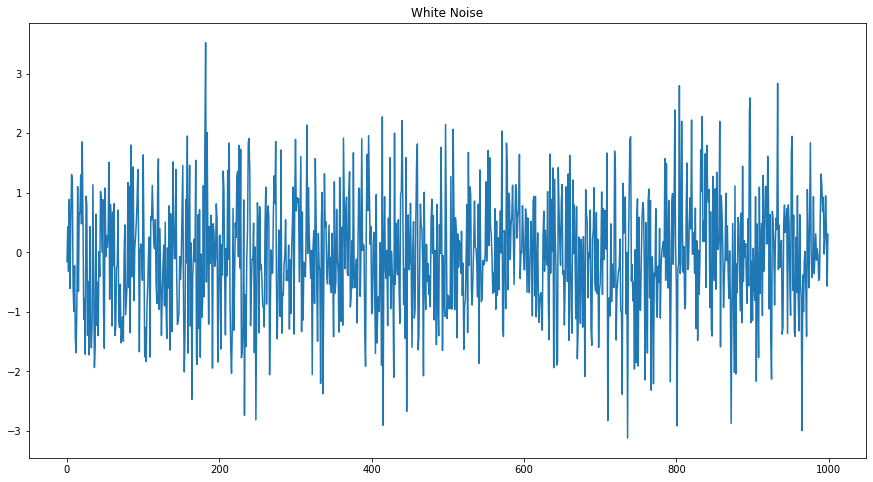

In [68]:
#White noise has mean=0, std=1
mean= 0
std = 1

#Make a white noise time series
noise = pd.Series([gauss(mean, std) for x in range(1000)])
noise.plot(title="White Noise", figsize=(15, 8))

## Check out mean and variance
noise.mean(), noise.var()

In [69]:
NSE_data["Symbol"].value_counts()

ASTRAL        34538
BERGEPAINT    32071
IGL           19736
KANSAINER     17269
RELAXO        12335
CDSL          11451
HDFCLIFE       9450
IEX            8676
SIEMENS        4934
CAMS           2844
PRINCEPIPE     2568
SUMCHEM        2467
SBICARD        1125
ROUTE           984
Name: Symbol, dtype: int64

In [70]:
nifty_data["Symbol"].value_counts()

HDFCBANK      32450
ADANIPORTS    20508
ICICIBANK     19180
KOTAKBANK     15165
POWERGRID      6908
RELIANCE       6490
Name: Symbol, dtype: int64

### RELIANCE

In [71]:
rel = nifty_data.loc[nifty_data["Symbol"] == "RELIANCE"]

In [72]:
rel["Close"].fillna(method="bfill", inplace=True)
rel["Open"].fillna(method="bfill", inplace=True)
rel["High"].fillna(method="bfill", inplace=True)
rel["Low"].fillna(method="bfill", inplace=True)
rel["Adj Close"].fillna(method="bfill", inplace=True)
rel["Volume"].fillna(method="bfill", inplace=True)

<AxesSubplot:>

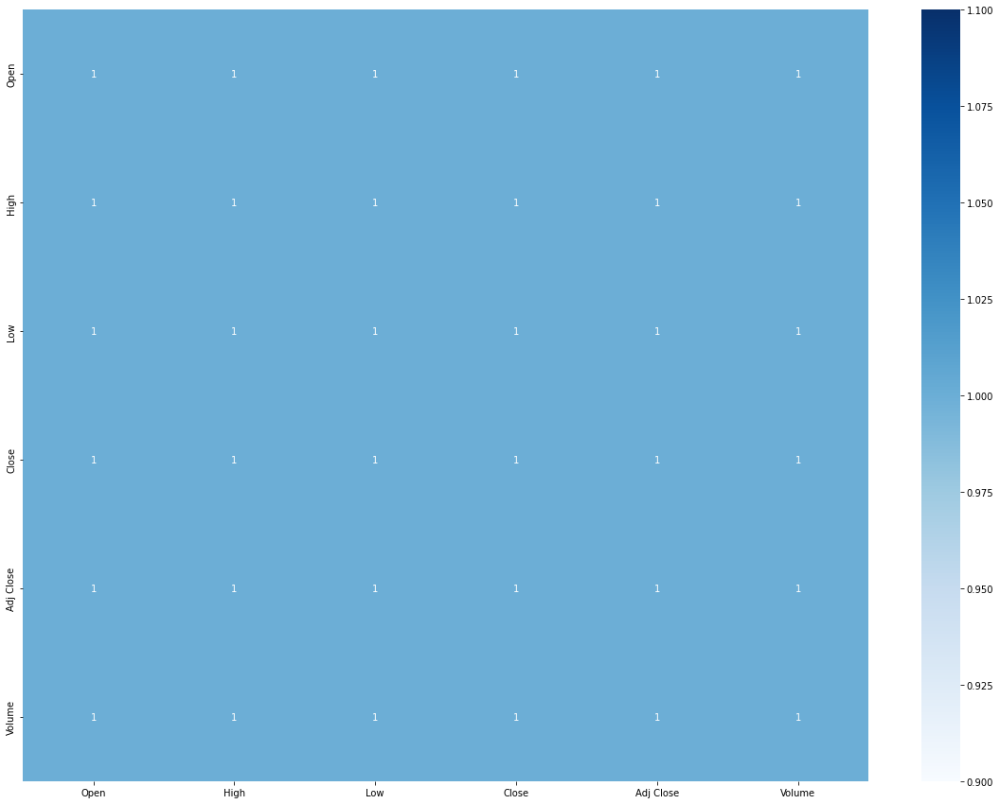

In [73]:
#Plot the heatmap of the dataset
plt.figure(figsize=(20, 15))
sns.heatmap(rel.corr(), annot=True, cmap="Blues")

#### Target Variable Evaluation

<AxesSubplot:xlabel='Date'>

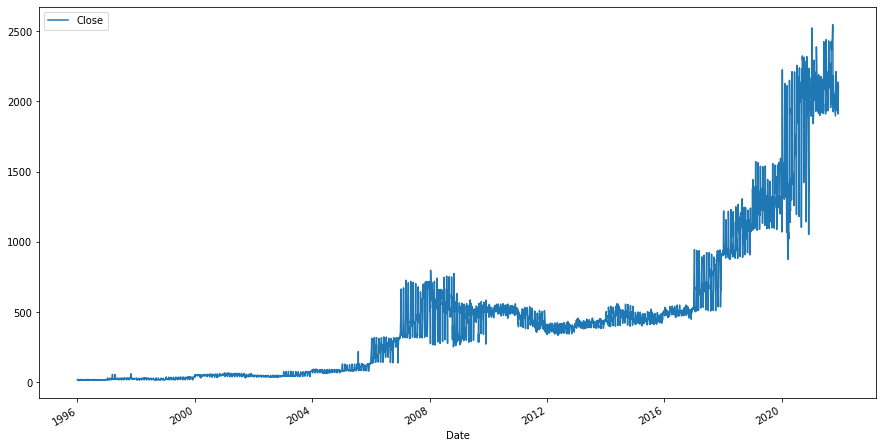

In [74]:
rel_close = rel[["Close"]]
rel_close.plot(figsize=(15, 8))

In [75]:
rel_monthly_mean = rel_close.resample("M").mean()

<AxesSubplot:xlabel='Date'>

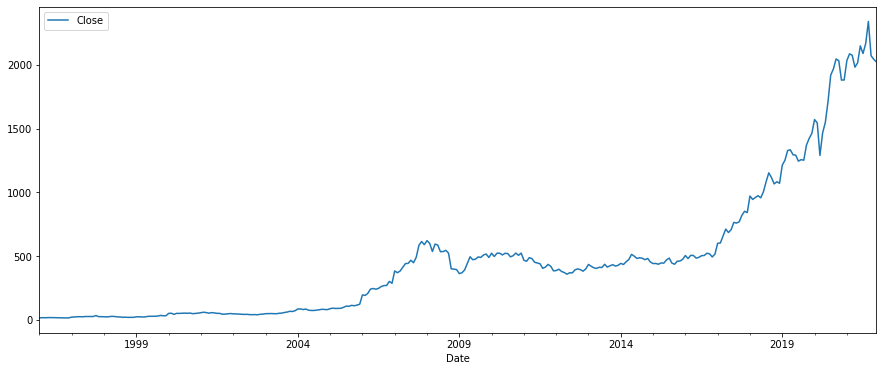

In [76]:
rel_monthly_mean.plot(figsize=(15, 6))

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.906554,0.998538,15,296,False,False


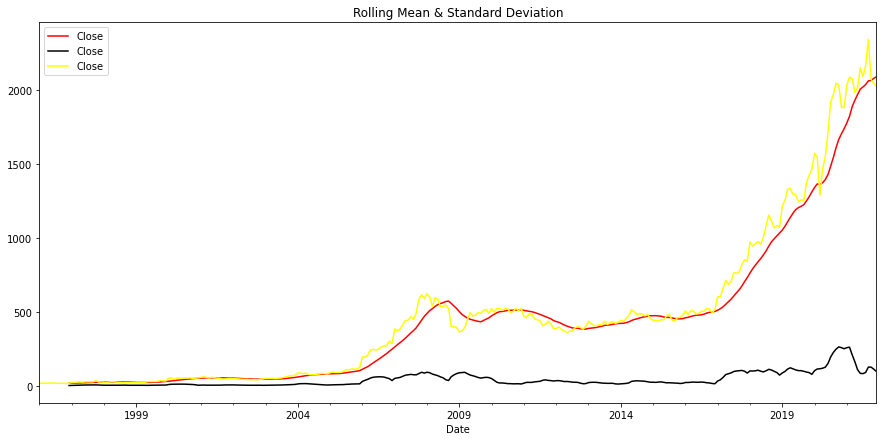

In [77]:
tsf.stationarity_check(rel_monthly_mean)

In [78]:
## Before 26-11-2009, split the stock price by 1/4
## Before 07-09-2017, split the stock price by 1/2
# rel_close[:"2009-11-27"] = rel_close[:"2009-11-27"] / 4
# rel_close["2009-11-27":"2017-09-08"] = rel_close["2009-11-27":"2017-09-08"] / 2

<Figure size 1080x504 with 0 Axes>

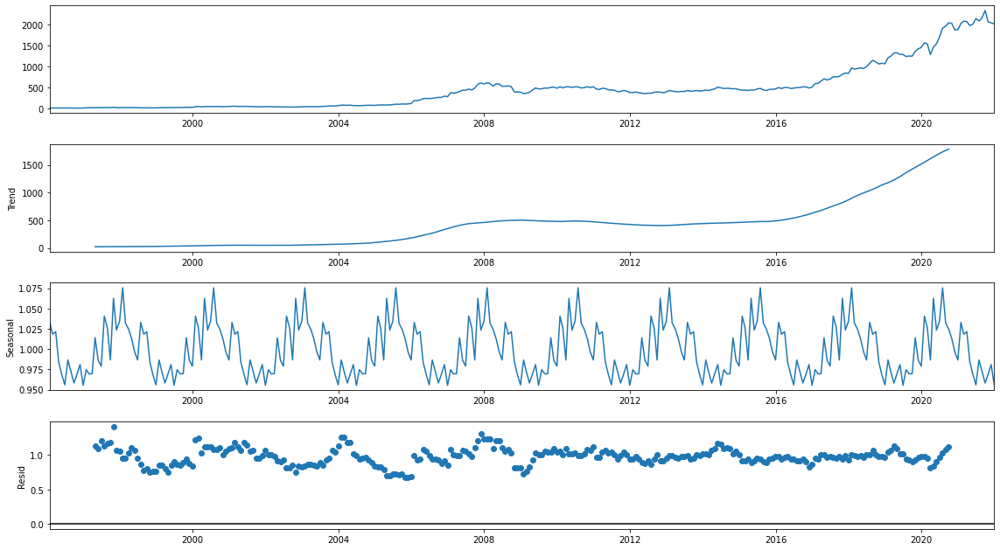

In [79]:
rel_close_decomp = seasonal_decompose(rel_monthly_mean, model="multiplicative", freq=30)
fig = plt.figure()
fig = rel_close_decomp.plot()
fig.set_size_inches(16, 9)

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


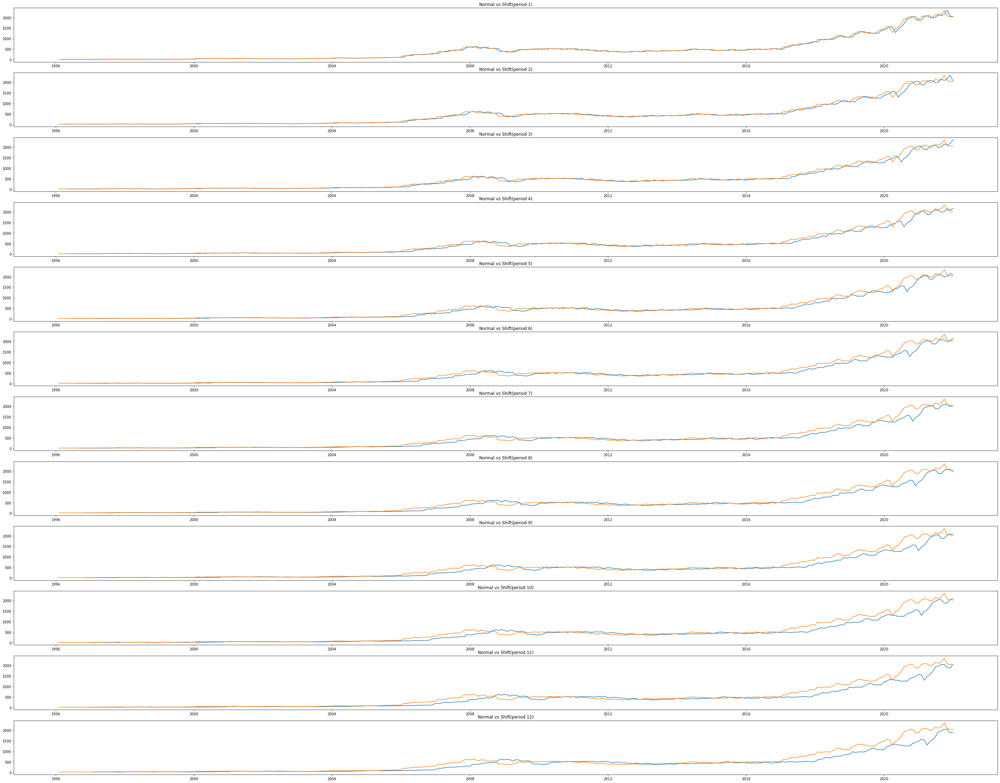

<Figure size 1080x504 with 0 Axes>

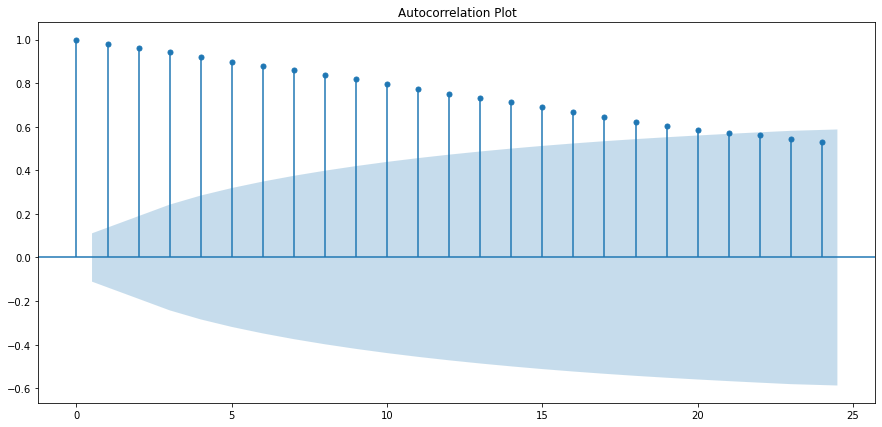

<Figure size 1080x504 with 0 Axes>

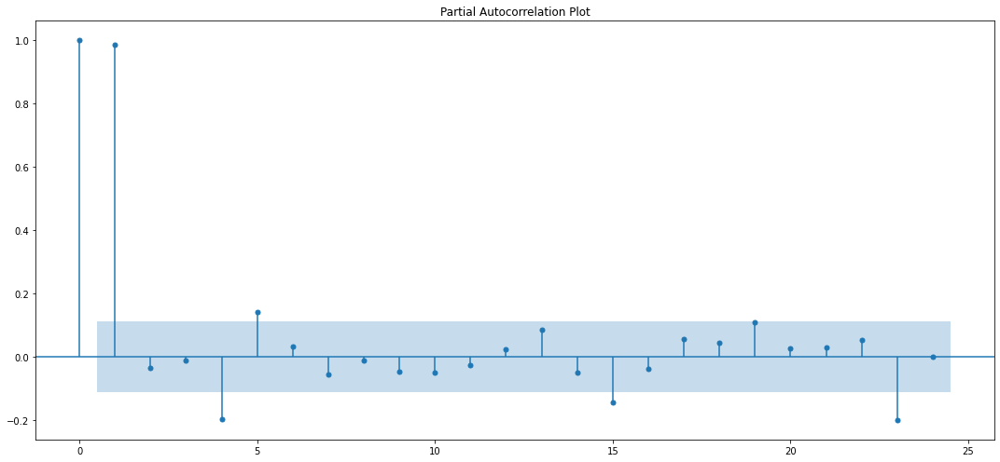

In [80]:
tsf.plot_autocorrelation(rel_monthly_mean, verbose=1)

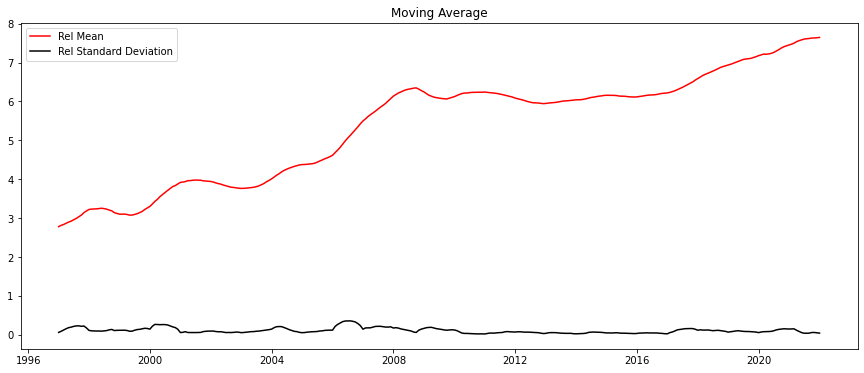

In [81]:
rcParams["figure.figsize"] = 15, 6
rel_close_log = np.log(rel_monthly_mean)
moving_avg_rel = rel_close_log.rolling(12).mean()
std_rel = rel_close_log.rolling(12).std()
plt.plot(moving_avg_rel, color="red", label="Rel Mean")
plt.plot(std_rel, color="black", label="Rel Standard Deviation")
plt.title("Moving Average")
plt.legend(loc="best")
plt.show()

#### Reliance Model

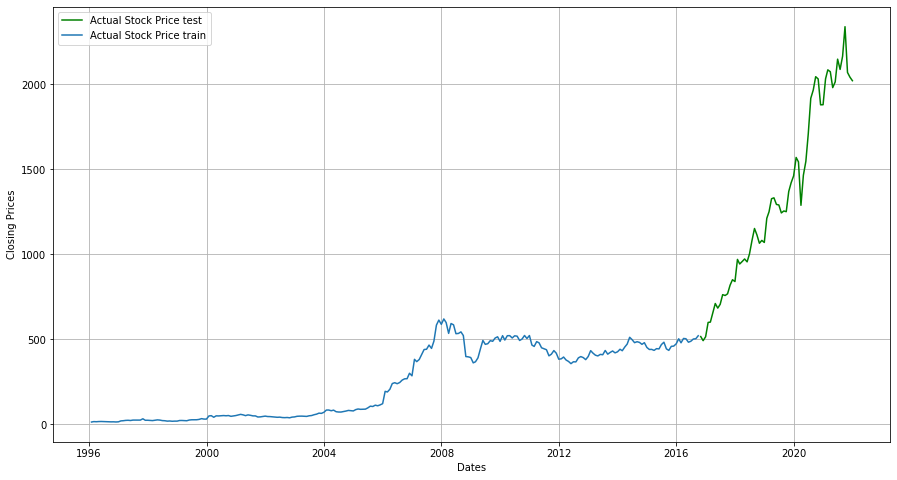

In [82]:
rel_train = rel_close_log[:int(len(rel_close_log) *0.8)]
rel_test = rel_close_log[int(len(rel_close_log) *0.8):]
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(np.exp(rel_test), color="green", label="Actual Stock Price test")
ax.plot(np.exp(rel_train), label="Actual Stock Price train")
ax.set_xlabel("Dates")
ax.set_ylabel("Closing Prices")
plt.legend(loc="best")
ax.grid(True)
plt.show()

In [83]:
rel_model, rel_fit_sarimax, rel_order, rel_seasonal_order = tsf.model_eval(rel_monthly_mean, arima=None)

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4967.903005120372
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 4484.982000087431
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 3950.32748374665
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 3747.6676700805137
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 3776.358331088832
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 3766.728400810721
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 3720.5523152986034
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 3667.6110653491796
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 4548.111234072162
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 4090.9036683333557
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 3617.1933090654366
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 3456.8415639616746
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 3516.670520995144
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 3494.2518572351078
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 3466.32

#### ARMA model

In [84]:
#rel_arma_model, rel_arma_fitted = tsf.model_eval(rel_monthly_mean, arima=1, order=rel_order)

In [85]:
#fc, se, conf = rel_arma_fitted.forecast(len(rel_test), alpha=0.05)

In [86]:
# fc_series = pd.Series(fc, index=rel_test.index)
# lower_series = pd.Series(conf[:, 0], index=rel_test.index)
# upper_series = pd.Series(conf[:, 1], index=rel_test.index)
# plt.plot(rel_monthly_mean, label="Actual Stock Price")
# # plt.plot(rel_test, color="green", label="Actual Stock Price")
# plt.plot(fc_series, color="orange", label="Predicted Stock Price")
# plt.fill_between(lower_series.index, lower_series, upper_series, color="k", alpha=0.2)
# plt.xlabel("Date")
# plt.ylabel("Stock Price")
# plt.title("Reliance Stock Prediction using ARMA")
# plt.grid(True)
# plt.show()

In [87]:
## Before 26-11-2009, split the stock price by 1/4
## Before 07-09-2017, split the stock price by 1/2

#### SARIMAX model

In [88]:
sarimax_rel_model_final = SARIMAX(rel_monthly_mean, order=rel_order, seasonal_order=rel_seasonal_order)
final_rel_result = sarimax_rel_model_final.fit()

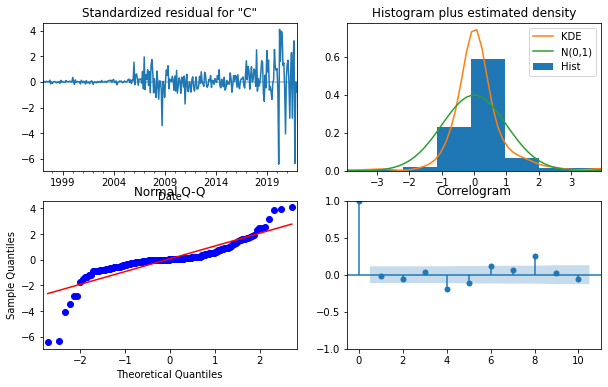

In [89]:
final_rel_result.plot_diagnostics(figsize=(10, 6))
plt.show()

##### Prediction

In [90]:
# final_fc = final_rel_result.forecast(steps=len(rel_test))
# fc_df = pd.DataFrame(final_fc)
# fc_df.reset_index(inplace=True)
# fc_df.drop("index", axis=1, inplace=True)
# fc_df.set_index(rel_test.index, inplace=True)
# fc_df

In [91]:
pred = final_rel_result.get_prediction(start=pd.to_datetime("2019-10-31"), dynamic=False)
pred_ci = pred.conf_int(alpha=0.05)
pred_df = pd.DataFrame(pred.predicted_mean)
pred_df

,predicted_mean
Date,
2019-10-31,1261.685943
2019-11-30,1374.474326
2019-12-31,1423.336886
2020-01-31,1526.016430
2020-02-29,1573.577911
2020-03-31,1565.989695
2020-04-30,1289.261488
2020-05-31,1478.292968
2020-06-30,1539.796613


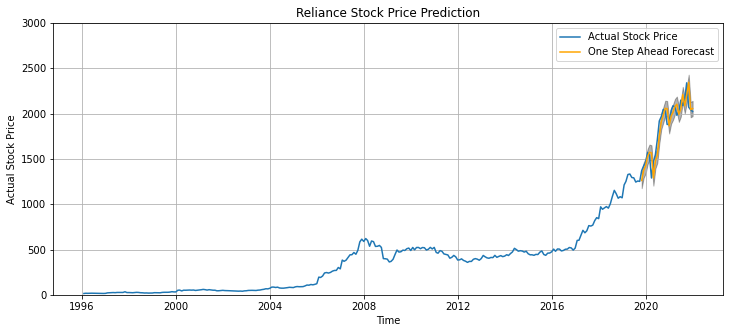

In [92]:
plt.figure(figsize=(12, 5))
plt.grid(True)
plt.plot(rel_monthly_mean, label="Actual Stock Price")
plt.plot(pred_df["predicted_mean"], color="orange",label="One Step Ahead Forecast")
plt.fill_between(pred_ci.index,pred_ci["lower Close"], pred_ci["upper Close"], color="k", alpha=0.3)
plt.title("Reliance Stock Price Prediction")
plt.ylim(0, 3000)
plt.xlabel("Time")
plt.ylabel("Actual Stock Price")
plt.legend(loc="best")
plt.show()

In [93]:
y_pred = pred.predicted_mean
y_true = rel_monthly_mean["Close"]
mse = ((y_pred - y_true) **2).mean()
print(f"The Mean Squared Error is {round(mse, 2)}")
print(f"The root Mean Squared Error is {round(np.sqrt(mse), 2)}")

The Mean Squared Error is 13966.3
The root Mean Squared Error is 118.18


##### One Step Ahead Forecast

In [94]:
forecast = final_rel_result.get_forecast(steps=1000)
forecast_ci = forecast.conf_int()
# ax = rel_test.plot(label="Observed")
# forecast.predicted_mean.plot(ax=ax, label="Forecast")
# ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 0], color="k", alpha=0.25)
# ax.set_xlabel("Date")
# ax.set_ylabel("Stock Price")
# plt.legend()
# plt.show()
dates= pd.date_range(start="2021-10-04",periods=1000, freq="B")
forecast_series = pd.Series(forecast.predicted_mean)
forecast_df = pd.DataFrame(forecast_series)
forecast_df["Dates"] = dates
forecast_df.reset_index(inplace=True)
forecast_df.drop("index", axis=1, inplace=True)
forecast_df.set_index(forecast_df["Dates"], inplace=True)
forecast_df.drop("Dates", axis=1, inplace=True)

forecast_ci["Dates"] = dates
forecast_ci.set_index("Dates", inplace=True)
forecast_df["2023"]

,predicted_mean
Dates,
2023-01-02,7439.254764
2023-01-03,7413.055955
2023-01-04,7434.046465
2023-01-05,7442.571810
2023-01-06,7501.917912
...,...
2023-12-25,11586.408129
2023-12-26,11645.754230
2023-12-27,11673.402862


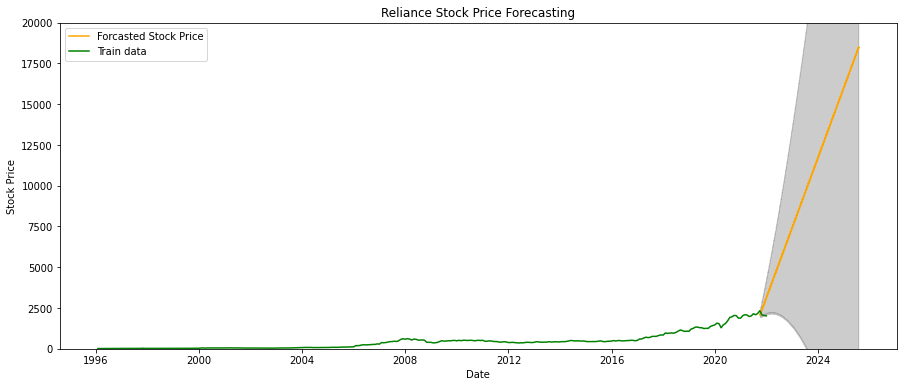

In [95]:
# list_1000_2500 = [i for i in range(1000, 2500, 250)]
req_dates = pd.date_range(start="04/01/2018", end="04/30/2022", freq="B").date
# b = "2021-07-01"
# a = "2021-05-01" 
plt.plot(forecast_df, color="orange", label="Forcasted Stock Price")
plt.plot(rel_monthly_mean, color="green", label="Train data")
# plt.axvspan(a, b, color="grey", alpha=0.2)
plt.fill_between(forecast_ci.index,forecast_ci["lower Close"], forecast_ci["upper Close"], color="k", alpha=0.2)
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.ylim(0, 20000)
plt.title("Reliance Stock Price Forecasting")
plt.legend(loc="best")
plt.show()



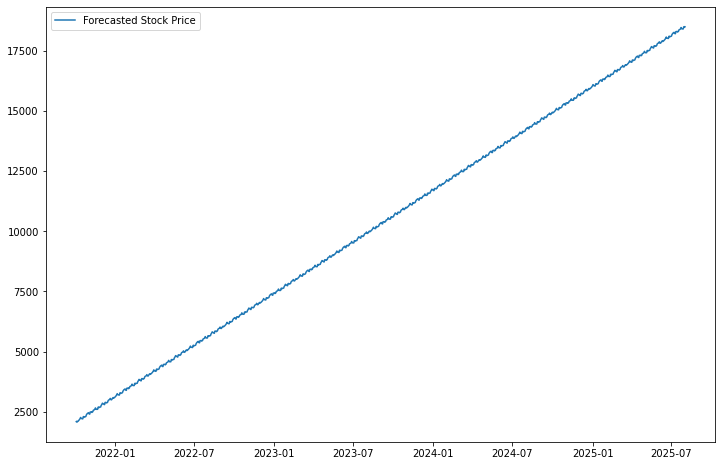

In [96]:
plt.figure(figsize=(12, 8))
plt.plot(forecast_df, label="Forecasted Stock Price")
plt.legend(loc="best")
plt.show()

#### LSTM prediction

In [97]:
rel_training_set = rel_monthly_mean[:int(len(rel_monthly_mean)*0.9)]
rel_test_set = rel_monthly_mean[int(len(rel_monthly_mean)*0.9):]

In [98]:
sc= MinMaxScaler(feature_range=(0,1))
rel_training_set_scaled = sc.fit_transform(rel_training_set)

In [99]:
X_train = []
y_train = []

for i in range(60, len(rel_training_set)):
    X_train.append(rel_training_set_scaled[i-60:i, 0])
    y_train.append(rel_training_set_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

X_train.shape

(220, 60, 1)

In [100]:
model_lstm_rel = tsf.model_stock(X_train, y_train)

Epoch 1/50
7/7 [==============================] - 14s 121ms/step - loss: 0.0612
Epoch 2/50
7/7 [==============================] - 1s 116ms/step - loss: 0.0221
Epoch 3/50
7/7 [==============================] - 1s 114ms/step - loss: 0.0205
Epoch 4/50
7/7 [==============================] - 1s 125ms/step - loss: 0.0134
Epoch 5/50
7/7 [==============================] - 1s 121ms/step - loss: 0.0108
Epoch 6/50
7/7 [==============================] - 1s 130ms/step - loss: 0.0097
Epoch 7/50
7/7 [==============================] - 1s 134ms/step - loss: 0.0087
Epoch 8/50
7/7 [==============================] - 1s 145ms/step - loss: 0.0070
Epoch 9/50
7/7 [==============================] - 1s 137ms/step - loss: 0.0064
Epoch 10/50
7/7 [==============================] - 1s 134ms/step - loss: 0.0053
Epoch 11/50
7/7 [==============================] - 1s 136ms/step - loss: 0.0055
Epoch 12/50
7/7 [==============================] - 1s 138ms/step - loss: 0.0044
Epoch 13/50
7/7 [==============================]

In [101]:
model_lstm_rel.save_weights("LSTM_stocks_weights/")

In [102]:
model_lstm_rel.save("complete_LSTM_stocks_model/")

INFO:tensorflow:Assets written to: complete_LSTM_stocks_model/assets


INFO:tensorflow:Assets written to: complete_LSTM_stocks_model/assets


In [103]:
rel_LSTM_model = models.load_model("complete_LSTM_stocks_model/")

In [104]:
rel_dataset_total = pd.concat([rel_training_set, rel_test_set], axis=0)

inputs = rel_dataset_total[len(rel_dataset_total) - len(rel_test_set) - 60:].values

inputs = inputs.reshape(-1, 1)
inputs = sc.transform(inputs)

X_test = []
for i in range(60, len(inputs)):
    X_test.append(inputs[i-60:i, 0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

print(X_test.shape)

(32, 60, 1)


In [105]:
predicted_stock_price_test = model_lstm_rel.predict(X_test)
predicted_stock_price_test = sc.inverse_transform(predicted_stock_price_test)

In [106]:
predicted_stock_price_train = model_lstm_rel.predict(X_train)
predicted_stock_price_train = sc.inverse_transform(predicted_stock_price_train)

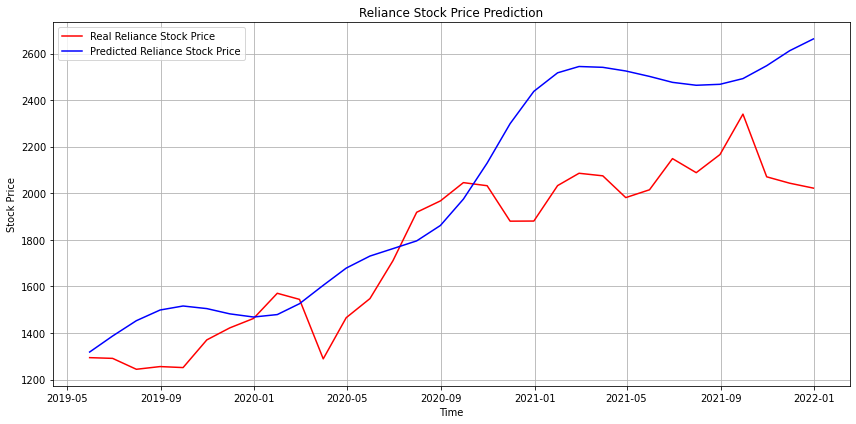

In [107]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(rel_test_set.index,rel_test_set.values, color="red", label="Real Reliance Stock Price")
ax.plot(rel_test_set.index,predicted_stock_price_test, color="blue", label="Predicted Reliance Stock Price")
ax.set_xlabel("Time")
ax.set_ylabel("Stock Price")
ax.set_title("Reliance Stock Price Prediction")
ax.legend(loc="best")
plt.tight_layout()
plt.grid()
plt.show()


In [108]:
rel_pred = pd.DataFrame(predicted_stock_price_test, index=rel_test_set.index)
rel_pred.columns = ["Predicted Closing Price"]

In [109]:
rel_pred_v_actual = pd.concat([rel_test_set, rel_pred], axis=1)
rel_pred_v_actual

,Close,Predicted Closing Price
Date,,
2019-05-31,1294.378407,1318.479004
2019-06-30,1291.222998,1387.239502
2019-07-31,1244.406674,1453.021362
2019-08-31,1256.018008,1498.878052
2019-09-30,1251.727380,1516.077393
2019-10-31,1370.600574,1504.920166
2019-11-30,1422.162789,1482.348389
2019-12-31,1462.609606,1468.757690
2020-01-31,1570.706326,1479.263916


### HDFC BANK

In [110]:
hdfc_bank = nifty_data.loc[nifty_data["Symbol"] == "HDFCBANK"]

<AxesSubplot:>

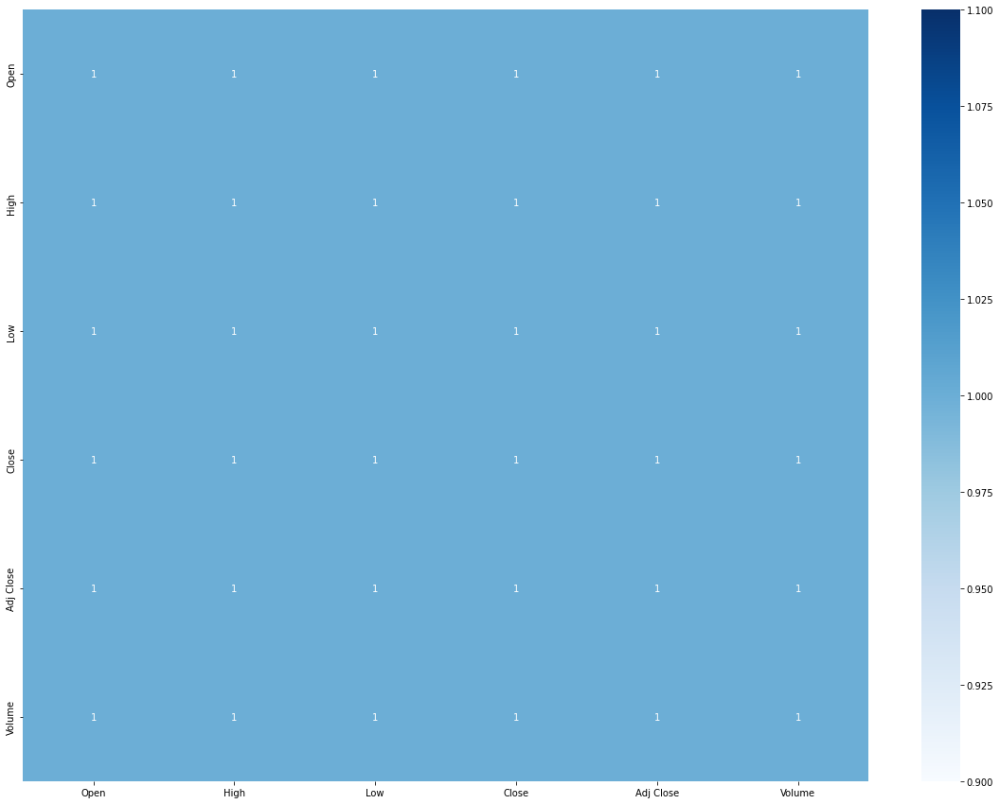

In [111]:
plt.figure(figsize=(20, 15))
sns.heatmap(hdfc_bank.corr(), annot=True, cmap="Blues")

In [112]:
hdfc_bank_close = hdfc_bank[["Close"]]
hdfc_monthly_mean = hdfc_bank_close.resample("M").mean()
hdfc_monthly_mean
# hdfc_monthly_mean = hdfc_bank_close.resample("M").mean()
# hdfc_bank_close["2011-07-10": "2012-07-20"]
# hdfc_bank_close["2019-06": "2019-12"].value_counts().index.min()

,Close
Date,
1996-01-31,2.912273
1996-02-29,3.460682
1996-03-31,3.235952
1996-04-30,3.582143
1996-05-31,3.433400
...,...
2021-08-31,1529.581581
2021-09-30,1556.661906
2021-10-31,1509.210010


In [113]:
## Split 1 (14-07-2011) - 5:1 - Before the date split the price to 1/10
## Split 2 (19-11-2019) - 2:1
# hdfc_bank_close[:"2011-07-15"] = hdfc_bank_close[:"2011-07-15"] / 10
# hdfc_bank_close["2011-07-14":"2019-09-20"] = hdfc_bank_close["2011-07-14":"2019-09-20"] / 2

#### Target Variable Evaluation

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,4.450276,1.0,11,300,False,False


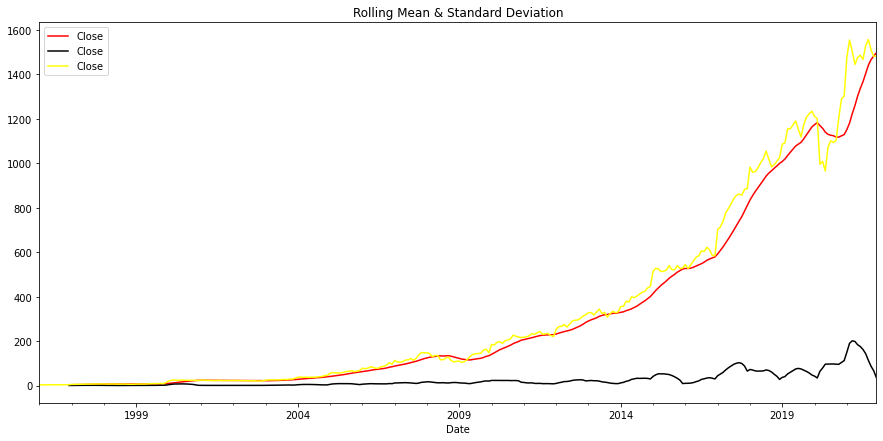

In [114]:
tsf.stationarity_check(hdfc_monthly_mean)

<Figure size 1080x504 with 0 Axes>

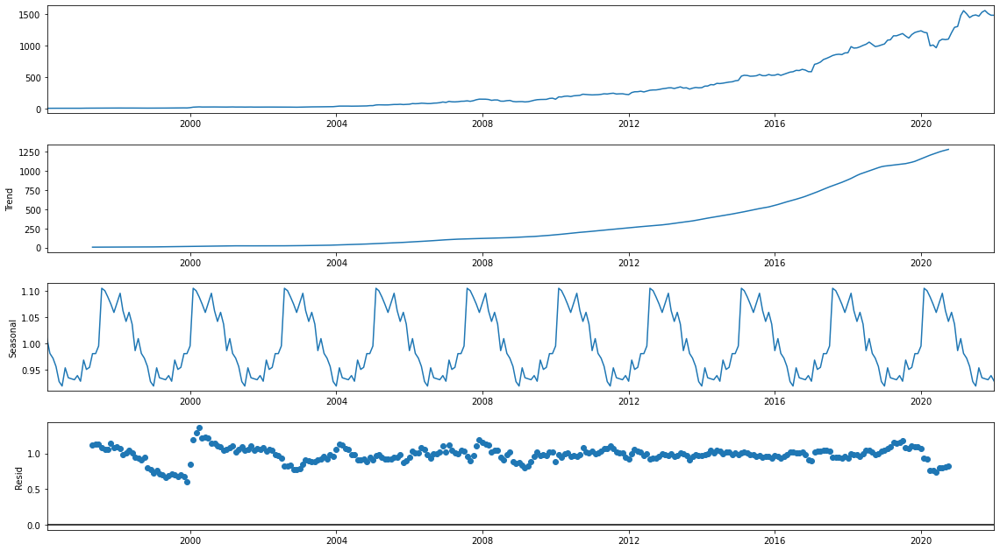

In [115]:
hdfc_seasonal_decomp = seasonal_decompose(hdfc_monthly_mean, model="multiplicative", freq=30)
fig = plt.figure()
fig = hdfc_seasonal_decomp.plot()
fig.set_size_inches(16, 9)

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


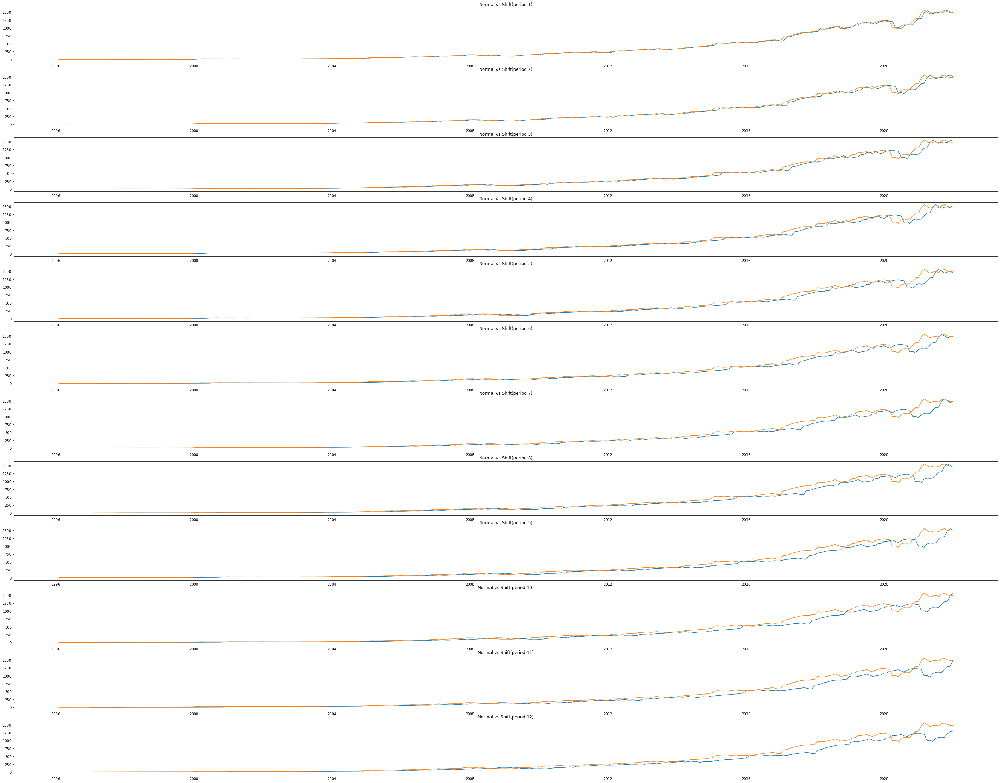

<Figure size 1080x504 with 0 Axes>

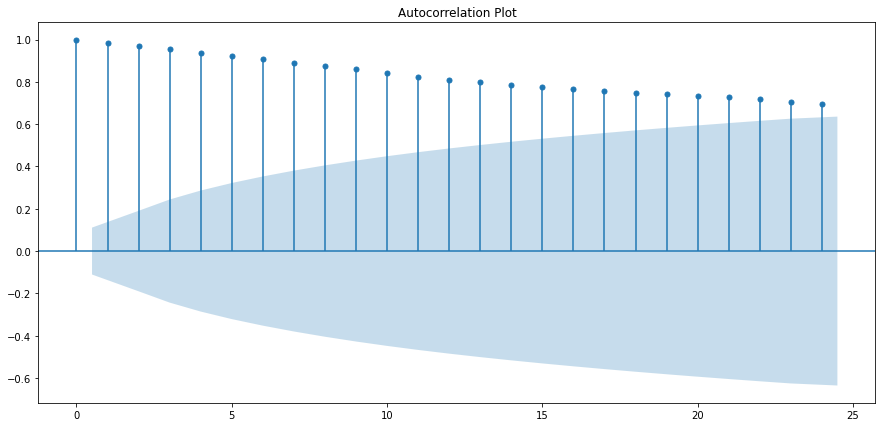

<Figure size 1080x504 with 0 Axes>

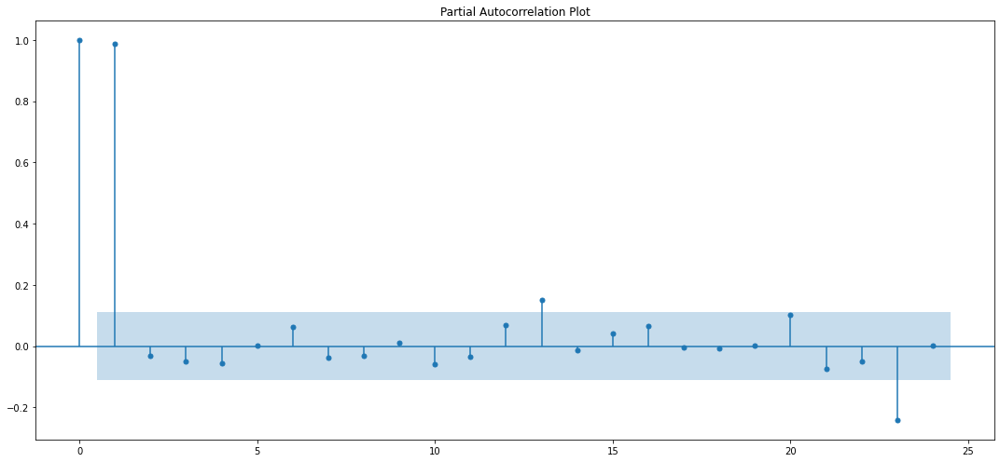

In [116]:
tsf.plot_autocorrelation(hdfc_monthly_mean, verbose=1)

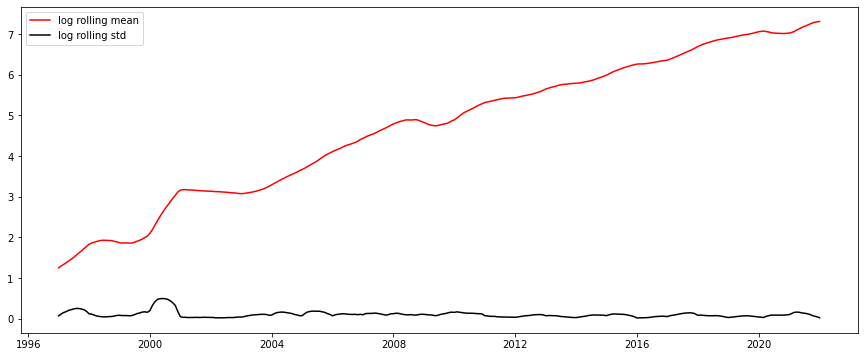

In [117]:
rcParams["figure.figsize"] = 15, 6
hdfc_close_log = np.log(hdfc_monthly_mean)
hdfc_close_log_mean = hdfc_close_log.rolling(window=12).mean()
hdfc_close_log_std = hdfc_close_log.rolling(window=12).std()
plt.plot(hdfc_close_log_mean, color="red", label="log rolling mean")
plt.plot(hdfc_close_log_std, color="black", label="log rolling std")
plt.legend(loc="best")
plt.show()


#### HDFC model

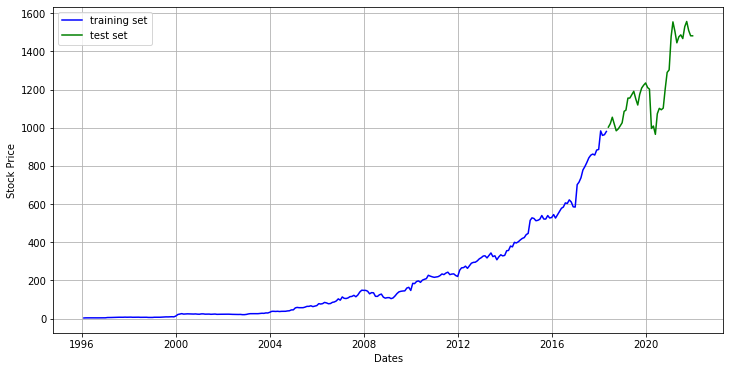

In [118]:
hdfc_training_set = hdfc_close_log[:int(len(hdfc_close_log)*0.86)]
hdfc_test_set = hdfc_close_log[int(len(hdfc_close_log)*0.86):]
fig, ax = plt.subplots(figsize=(12, 6))
ax.grid(True)
ax.plot(hdfc_training_set.index, np.exp(hdfc_training_set), color="blue", label="training set")
ax.plot(hdfc_test_set.index, np.exp(hdfc_test_set), color="green", label="test set")
ax.set_xlabel("Dates")
ax.set_ylabel("Stock Price")
ax.legend(loc="best")
plt.show()

In [119]:
hdfc_model, hdfc_fit_sarimax, hdfc_order, hdfc_seasonal_order = tsf.model_eval(hdfc_monthly_mean, arima=None)

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4802.389966444998
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 4340.903902443468
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 3682.9180388690042
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 3534.7120695047533
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 3473.356489417456
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 3371.340626831514
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 3526.302494197228
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 3370.5557204910983
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 4386.872685450089
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 3947.99471398726
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 3373.7149730086785
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 3248.277819034389
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 3235.3238827183395
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 3112.065948999456
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 3265.9682

#### ARMA model

In [120]:
# arma_hdfc_model, arma_hdfc_fit = tsf.model_eval(hdfc_training_set, arima=1, order=hdfc_order)

In [121]:
# fc, se, conf = arma_hdfc_fit.forecast(steps=len(hdfc_test_set), alpha=0.05)

In [122]:
# fc_series = pd.Series(fc, index=hdfc_test_set.index)
# # upper_series = pd.Series(conf[:, 1], index=hdfc_test_set.index)
# lower_series = pd.Series(conf[:, 0], index=hdfc_test_set.index)
# plt.figure(figsize=(12, 8))
# # plt.plot(np.exp(hdfc_training_set), label="Train data")
# plt.plot(hdfc_monthly_mean,color="green", label="Actual Stock Price")
# plt.plot(fc_series, color="orange", label="Predicted Stock Price")
# plt.fill_between(lower_series.index, lower_series, np.exp(upper_series), alpha=0.2, color="k")
# plt.xlabel("Date")
# plt.ylabel("Stock Price")
# plt.title("HDFC Bank Stock Price prediction")
# plt.legend(loc="best")
# plt.show()

#### SARIMAX model

In [123]:
final_hdfc_model = SARIMAX(hdfc_monthly_mean, order=hdfc_order, seasonal_order=hdfc_seasonal_order)
final_hdfc_fit = final_hdfc_model.fit()

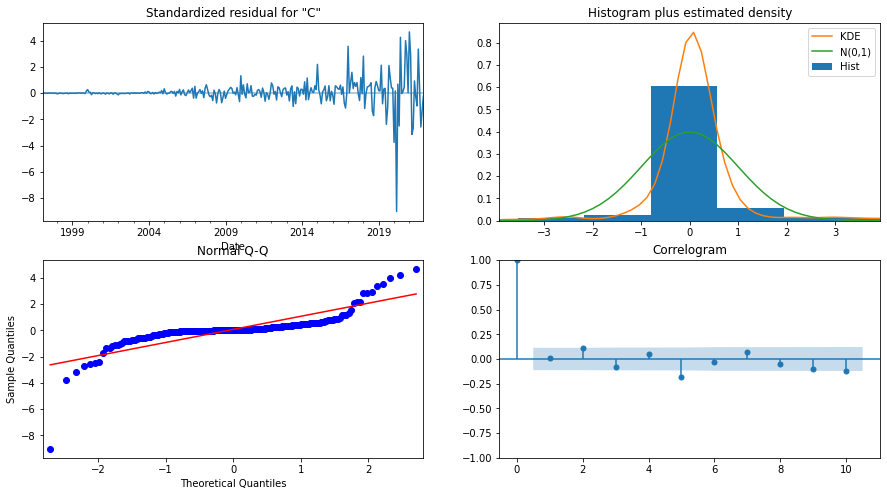

In [124]:
final_hdfc_fit.plot_diagnostics(figsize=(15, 8))
plt.show()

##### Prediction

In [153]:
hdfc_pred = final_hdfc_fit.get_prediction(start = pd.to_datetime("2019-10-31"), dynamic=False)
pred_ci = hdfc_pred.conf_int()
pred_ci
hdfc_pred_series=pd.Series(hdfc_pred.predicted_mean)


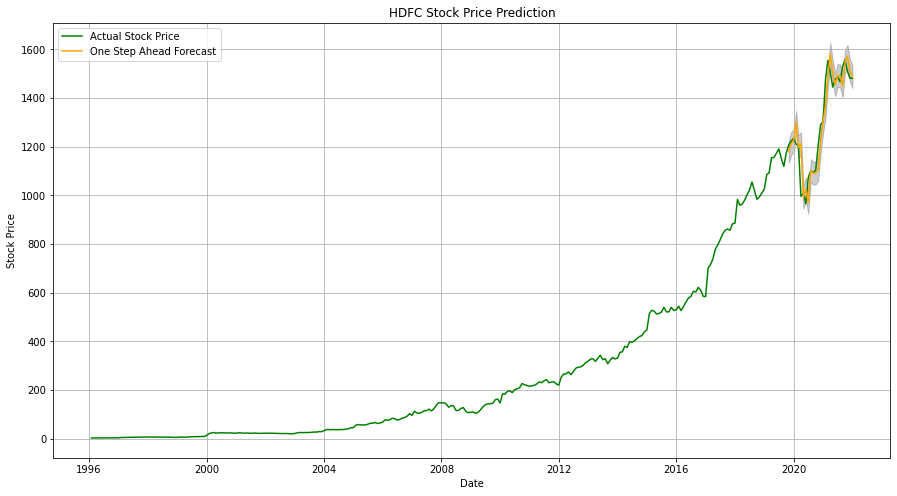

In [154]:
plt.figure(figsize=(15, 8))
plt.grid(True)
# plt.plot(np.exp(hdfc_training_set), color="blue", label="Training Set")
plt.plot(hdfc_monthly_mean, color="green", label="Actual Stock Price")
plt.plot(hdfc_pred_series, color="orange", label="One Step Ahead Forecast")
plt.fill_between(pred_ci.index, pred_ci["lower Close"], pred_ci["upper Close"], alpha=0.2, color="k")
# plt.yticks([x for x in range(0, 2500, 250)])
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.title("HDFC Stock Price Prediction")
plt.legend(loc="best")
plt.show()

##### One Step Ahead Forecast

In [127]:
hdfc_forecast = final_hdfc_fit.get_forecast(steps=1000)
hdfc_forecast_ci = hdfc_forecast.conf_int()

dates= pd.date_range(start="2019-10-04", periods=1000, freq="B")
hdfc_forecast_series = pd.Series(hdfc_forecast.predicted_mean)
hdfc_forecast_series
hdfc_forecast_df = pd.DataFrame(hdfc_forecast_series)
hdfc_forecast_df.reset_index(inplace=True)
hdfc_forecast_df["Dates"] = dates
hdfc_forecast_df.set_index("Dates", inplace=True)
# hdfc_forecast_df.drop("Dates",axis=1, inplace=True)
# hdfc_forecast_df
hdfc_forecast_df.drop("index", axis=1, inplace=True)

hdfc_forecast_ci["Dates"] = dates
hdfc_forecast_ci.set_index("Dates", inplace=True)

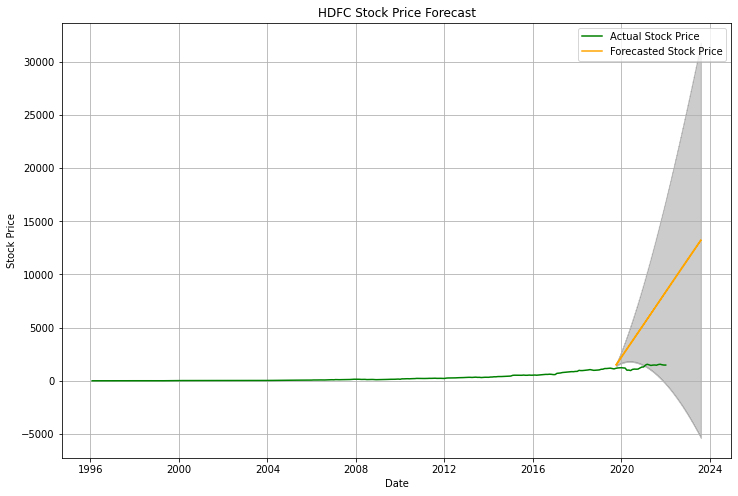

In [128]:
plt.figure(figsize=(12, 8))
a = "2021-05-01"
b = "2021-07-01"
plt.grid(True)
plt.plot(hdfc_monthly_mean, color="green", label="Actual Stock Price")
plt.plot(hdfc_forecast_df, color="orange", label="Forecasted Stock Price")
# plt.axvspan(a, b, color="grey", alpha=0.2)
plt.fill_between(hdfc_forecast_ci.index, hdfc_forecast_ci["lower Close"], hdfc_forecast_ci["upper Close"], alpha=0.2, color="k")
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.title("HDFC Stock Price Forecast")
plt.legend(loc="best")
plt.show()

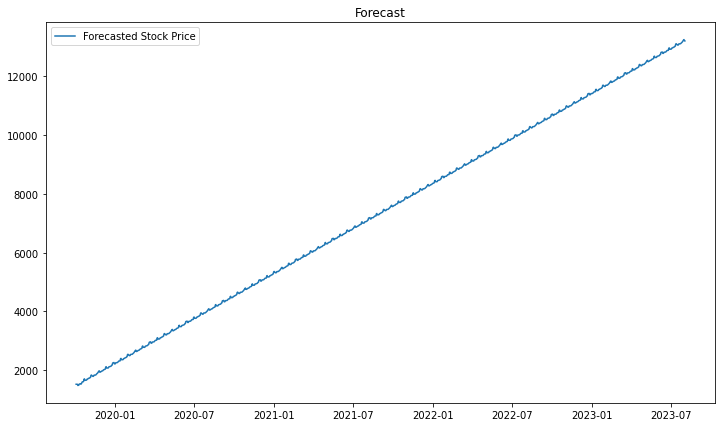

In [129]:
plt.figure(figsize=(12, 7))
plt.plot(hdfc_forecast_df, label="Forecasted Stock Price")
plt.title("Forecast")
plt.legend()
plt.show()

#### LSTM prediction

In [130]:
hdfc_train = hdfc_monthly_mean[:int(len(hdfc_monthly_mean)*0.9)]
hdfc_test = hdfc_monthly_mean[int(len(hdfc_monthly_mean)*0.9):]
sc = MinMaxScaler(feature_range=(0, 1))
hdfc_train_scaled = sc.fit_transform(hdfc_train)

In [131]:
X_train = []
y_train = []
for i in range(60, len(hdfc_train_scaled)):
    X_train.append(hdfc_train_scaled[i-60:i, 0])
    y_train.append(hdfc_train_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

X_train.shape

(220, 60, 1)

In [132]:
hdfc_model = tsf.model_stock(X_train, y_train)

Epoch 1/50
7/7 [==============================] - 14s 135ms/step - loss: 0.0520
Epoch 2/50
7/7 [==============================] - 1s 144ms/step - loss: 0.0129
Epoch 3/50
7/7 [==============================] - 1s 143ms/step - loss: 0.0056
Epoch 4/50
7/7 [==============================] - 1s 150ms/step - loss: 0.0048
Epoch 5/50
7/7 [==============================] - 1s 146ms/step - loss: 0.0021
Epoch 6/50
7/7 [==============================] - 1s 132ms/step - loss: 0.0015
Epoch 7/50
7/7 [==============================] - 1s 141ms/step - loss: 8.3808e-04
Epoch 8/50
7/7 [==============================] - 1s 155ms/step - loss: 0.0012
Epoch 9/50
7/7 [==============================] - 1s 141ms/step - loss: 0.0011
Epoch 10/50
7/7 [==============================] - 1s 163ms/step - loss: 0.0011
Epoch 11/50
7/7 [==============================] - 1s 157ms/step - loss: 0.0010
Epoch 12/50
7/7 [==============================] - 1s 144ms/step - loss: 0.0010
Epoch 13/50
7/7 [===========================

In [133]:
hdfc_dataset_total = pd.concat([hdfc_train, hdfc_test], axis=0)

inputs = hdfc_dataset_total[len(hdfc_dataset_total) - len(hdfc_test) - 60:].values

inputs = inputs.reshape(-1, 1)
inputs = sc.transform(inputs)

X_test = []
for i in range(60, len(inputs)):
    X_test.append(inputs[i-60:i, 0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

print(X_test.shape)

(32, 60, 1)


In [134]:
hdfc_pred = hdfc_model.predict(X_test)
hdfc_pred = sc.inverse_transform(hdfc_pred)


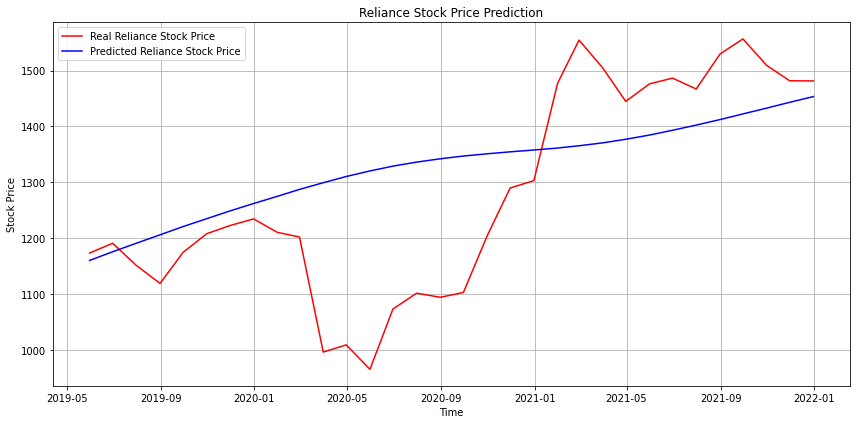

In [135]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(hdfc_test.index,hdfc_test.values, color="red", label="Real Reliance Stock Price")
ax.plot(hdfc_test.index,hdfc_pred, color="blue", label="Predicted Reliance Stock Price")
ax.set_xlabel("Time")
ax.set_ylabel("Stock Price")
ax.set_title("Reliance Stock Price Prediction")
ax.legend(loc="best")
plt.tight_layout()
plt.grid()
plt.show()

## Global function

In [161]:
def stock_market_prediction(df, symbol, heatmap=None,stationarity=None, decompose=None, ac=None, log_plot=None, best_params=None, arma_model=None, sarimax=None, lstm=None, test=None, date=True):
    stock_df= df.loc[df["Symbol"] == symbol]
#     stock_df["Date"] = pd.to_datetime(stock_df["Date"])
#     stock_df.set_index(stock_df["Date"], inplace=True)
#     stock_df.drop("Date", axis=1, inplace=True)

    #Plot the heatmap of the dataset
    if heatmap != None:
        plt.figure(figsize=(20, 15))
        sns.heatmap(stock_df.corr(), annot=True, cmap="Blues")
        plt.show()


    ts = stock_df[["Close"]]
    ts_monthly_mean = ts.resample("M").mean()
    ts_monthly_mean.fillna(method="bfill", inplace=True)
    
    if stationarity != None:
        tsf.stationarity_check(ts_monthly_mean)

    if decompose != None:
        if len(ts_monthly_mean) >= 60:
            ts_decomp = seasonal_decompose(ts_monthly_mean, model="multiplicative", freq=30)
            fig = plt.figure()
            fig = ts_decomp.plot()
            fig.set_size_inches(16, 9)
        else:
            ts_weekly_mean = ts.resample("W").mean()
            ts_weekly_mean.fillna(method="bfill", inplace=True)
            ts_decomp = seasonal_decompose(ts_weekly_mean, model="multiplicative", freq=30)
            fig = plt.figure()
            fig = ts_decomp.plot()
            fig.set_size_inches(16, 9)
            
        

    if ac != None:
        if len(ts_monthly_mean) >=60:
            tsf.plot_autocorrelation(ts_monthly_mean, verbose=1)
        else:
            tsf.plot_autocorrelation(ts_weekly_mean, verbose=1)
    
    if log_plot != None:
        plt.figure(figsize=(15, 7))
        ts_log = np.log(ts_monthly_mean)
        moving_avg = ts_log.rolling(12).mean()
        std= ts_log.rolling(12).std()
        plt.plot(moving_avg, color="red", label="Mean")
        plt.plot(std, color="black", label="Standard Deviation")
        plt.title("Moving Average")
        plt.legend(loc="best")
        plt.show()


# ####  Model



    ts_train = ts_log[:int(len(ts_log) *0.8)]
    ts_test = ts_log[int(len(ts_log) *0.8):]
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.plot(ts_test, color="green", label="Actual Stock Price")
    ax.plot(ts_train, label="train data")
    ax.set_xlabel("Dates")
    ax.set_ylabel("Closing Prices")
    plt.legend(loc="best")
    ax.grid(True)
    plt.show()

    if best_params != None:
        ts_model, ts_fit_sarimax, order, seasonal_order= tsf.model_eval(ts_monthly_mean, arima=None)
        
#     if arma_model != None:
#         ts_arma_model, ts_arma_fitted = tsf.model_eval(ts_monthly_mean, arima=1, order= (1,1))
#         fc, se, conf = ts_arma_fitted.forecast(len(ts_test), alpha=0.05)


#     fc_series = pd.Series(fc, index=ts_monthly_mean.index)
#     lower_series = pd.Series(conf[:, 0], index=ts_monthly_mean.index)
#     upper_series = pd.Series(conf[:, 1], index=ts_monthly_mean.index)
#     plt.plot(ts_monthly_mean, label="train data")
# #     plt.plot(np.exp(ts_test), color="green", label="Actual Stock Price")
#     plt.plot(fc_series, color="orange", label="Predicted Stock Price")
#     plt.fill_between(lower_series.index, lower_series, upper_series, color="k", alpha=0.2)
#     plt.xlabel("Date")
#     plt.ylabel("Stock Price")
#     plt.title("Stock Prediction using ARMA")
#     plt.show()


# #### SARIMAX model

    if sarimax != None:
        
        sarimax_model_final = SARIMAX(ts_monthly_mean, order=order, seasonal_order=seasonal_order)
        final_result = sarimax_model_final.fit()
        

    final_result.plot_diagnostics(figsize=(10, 6))
    plt.show()


# ##### Prediction


# final_fc = final_rel_result.forecast(steps=len(rel_test))
# fc_df = pd.DataFrame(final_fc)
# fc_df.reset_index(inplace=True)
# fc_df.drop("index", axis=1, inplace=True)
# fc_df.set_index(rel_test.index, inplace=True)
# fc_df

    if date:
        pred = final_result.get_prediction(start=pd.to_datetime("2019-10-31"), dynamic=False)
        pred_ci = pred.conf_int(alpha=0.05)
    else:
        pred = final_result.get_prediction(start=pd.to_datetime("2020-04-01"), dynamic=False)
        pred_ci = pred.conf_int(alpha=0.05)



    plt.figure(figsize=(12, 5))
    plt.grid(True)
    plt.plot(ts_monthly_mean, label="Actual Stock Price")
#     plt.plot(np.exp(ts_test), color="green", label="Test Data")
    plt.plot(pred.predicted_mean, label="Predicted Stock Price")
    plt.fill_between(pred_ci.index, pred_ci["lower Close"], pred_ci["upper Close"], color="k", alpha=0.3)
    plt.title(f"{symbol} Stock Price Prediction")
    plt.xlabel("Time")
    plt.ylabel("Actual Stock Price")
    plt.legend(loc="best")
    plt.show()




    y_pred = pred.predicted_mean
    y_true = ts_monthly_mean["Close"]
    mse = ((y_pred - y_true) **2).mean()
    print(f"The Mean Squared Error is {round(mse, 2)}")
    print(f"The root Mean Squared Error is {round(np.sqrt(mse), 2)}")


# ##### One Step Ahead Forecast



    forecast = final_result.get_forecast(steps=1000)
    pred_ci = forecast.conf_int()
# ax = rel_test.plot(label="Observed")
# forecast.predicted_mean.plot(ax=ax, label="Forecast")
# ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 0], color="k", alpha=0.25)
# ax.set_xlabel("Date")
# ax.set_ylabel("Stock Price")
# plt.legend()
# plt.show()
    dates= pd.date_range(start="2019-10-31", periods= 1000, freq="B")
    forecast_series = pd.Series(forecast.predicted_mean)
    forecast_df = pd.DataFrame(forecast_series)
    forecast_df["Dates"] = dates
    forecast_df.reset_index(inplace=True)
    forecast_df.drop("index", axis=1, inplace=True)
    forecast_df.set_index(forecast_df["Dates"], inplace=True)
    forecast_df.drop("Dates",axis=1, inplace=True)

    pred_ci["Dates"] = dates
    pred_ci.set_index("Dates", inplace=True)


# list_1000_2500 = [i for i in range(1000, 2500, 250)]
    req_dates = pd.date_range(start="04/01/2018", end="04/30/2022", freq="B").date
# b = "2021-07-01"
# a = "2021-05-01" 
    plt.plot(forecast_df, color="orange", label="Forcasted Stock Price")
    plt.plot(ts_monthly_mean, color="green", label="Actual Stock Price")
#     plt.plot(np.exp(ts_test), color="blue", label="Actual Stock Price")
    # plt.axvspan(a, b, color="grey", alpha=0.2)
    plt.fill_between(pred_ci.index,pred_ci["lower Close"], pred_ci["upper Close"], alpha=0.2, color="k")
# plt.yticks(list_1000_2500)
    plt.grid(True)
    plt.xlabel("Date")
    plt.ylabel("Stock Price")
    plt.legend(loc="best")
    plt.title(f"{symbol} Forecast")
    plt.show()




    plt.figure(figsize=(12, 8))
    plt.plot(forecast_df, label="Forecasted Stock Price")
    plt.legend(loc="best")
    plt.show()


# #### LSTM prediction

    if lstm != None:
        if len(ts_monthly_mean) >= 60:
            ts_training_set = ts_monthly_mean[:int(len(ts_monthly_mean)*0.9)]
            ts_test_set = ts_monthly_mean[int(len(ts_monthly_mean)*0.9):]
        else:
            ts_training_set = ts_monthly_mean[:int(len(ts_monthly_mean)*0.9)]
            ts_test_set = ts_monthly_mean[int(len(ts_monthly_mean)*0.9):]


        sc= MinMaxScaler(feature_range=(0,1))
        ts_training_set_scaled = sc.fit_transform(ts_training_set)


        X_train = []
        y_train = []
        for i in range(60, len(ts_training_set_scaled)):
            X_train.append(ts_training_set_scaled[i-60:i, 0])
            y_train.append(ts_training_set_scaled[i, 0])
            
        X_train, y_train = np.array(X_train), np.array(y_train)
        X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
        print(X_train.shape)



        model_lstm_ts = tsf.model_stock(X_train, y_train)

        if test != None:
            X_test = []
            ts_dataset_total = pd.concat([ts_training_set, ts_test_set], axis=0)

            inputs = ts_dataset_total[len(ts_dataset_total) - len(ts_test_set) - 60:].values

            inputs = inputs.reshape(-1, 1)
            inputs = sc.transform(inputs)

            X_test = []
            for i in range(60, len(inputs)):
                X_test.append(inputs[i-60:i, 0])
            X_test = np.array(X_test)
            X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

                            
    


            predicted_stock_price_test = model_lstm_ts.predict(X_test)
            predicted_stock_price_test = sc.inverse_transform(predicted_stock_price_test)




    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(ts_test_set.index,ts_test_set, color="red", label=f"Real {symbol} Stock Price")
    ax.plot(ts_test_set.index,predicted_stock_price_test, color="blue", label=f"Predicted {symbol} Stock Price")
    ax.set_xlabel("Time")
    ax.set_ylabel("Stock Price")
    ax.set_title(f"{symbol} Stock Price Prediction")
    ax.legend(loc="best")
    plt.tight_layout()
    plt.show()
    
    return

### Indian Stocks

#### ADANIPORTS

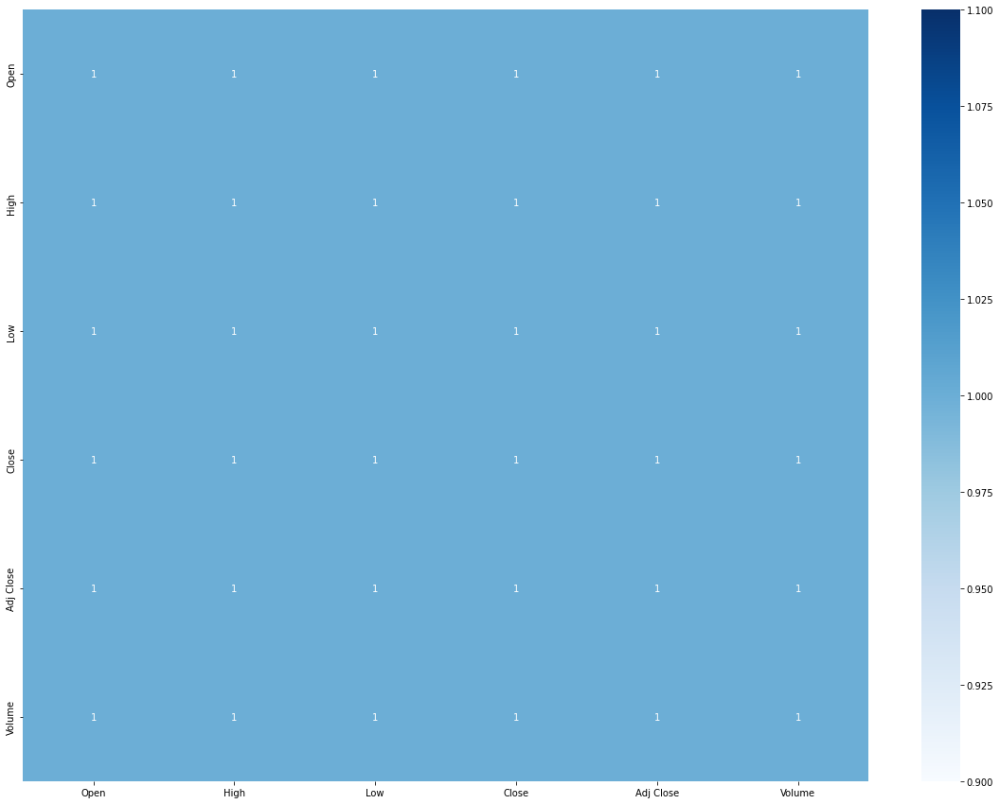

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,0.165612,0.970266,1,176,False,False


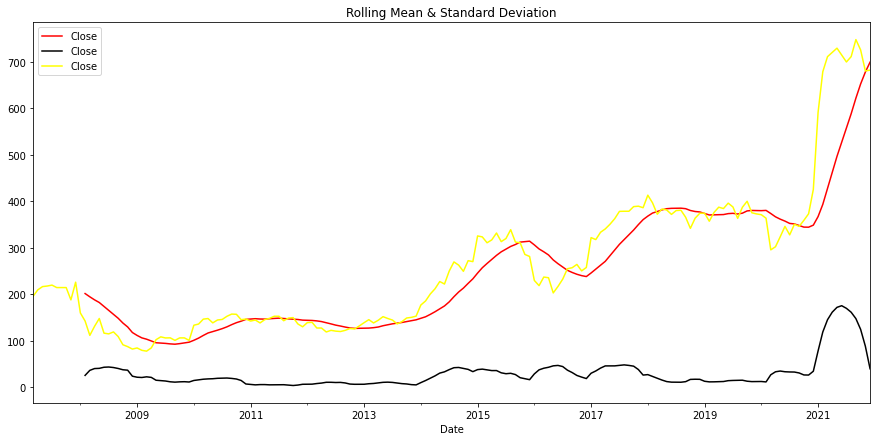

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

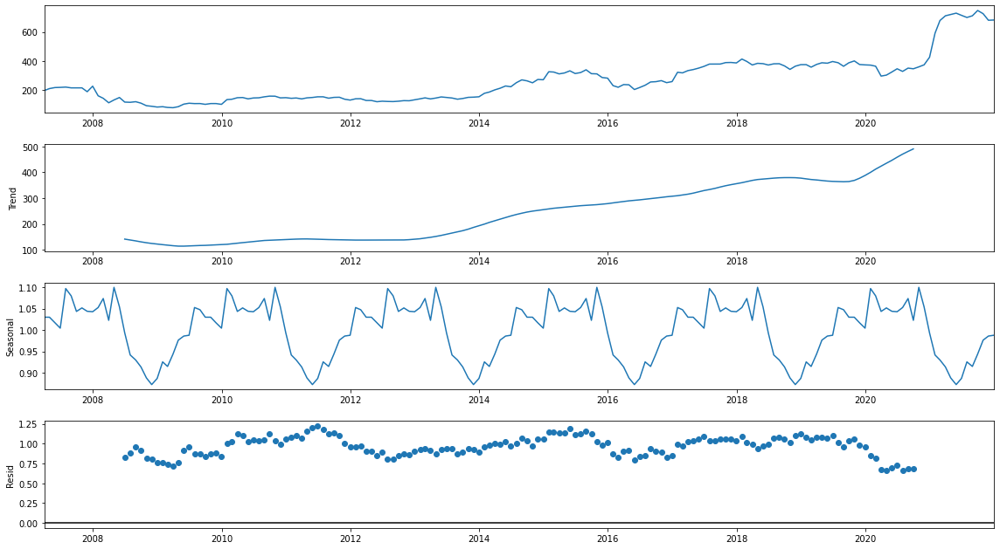

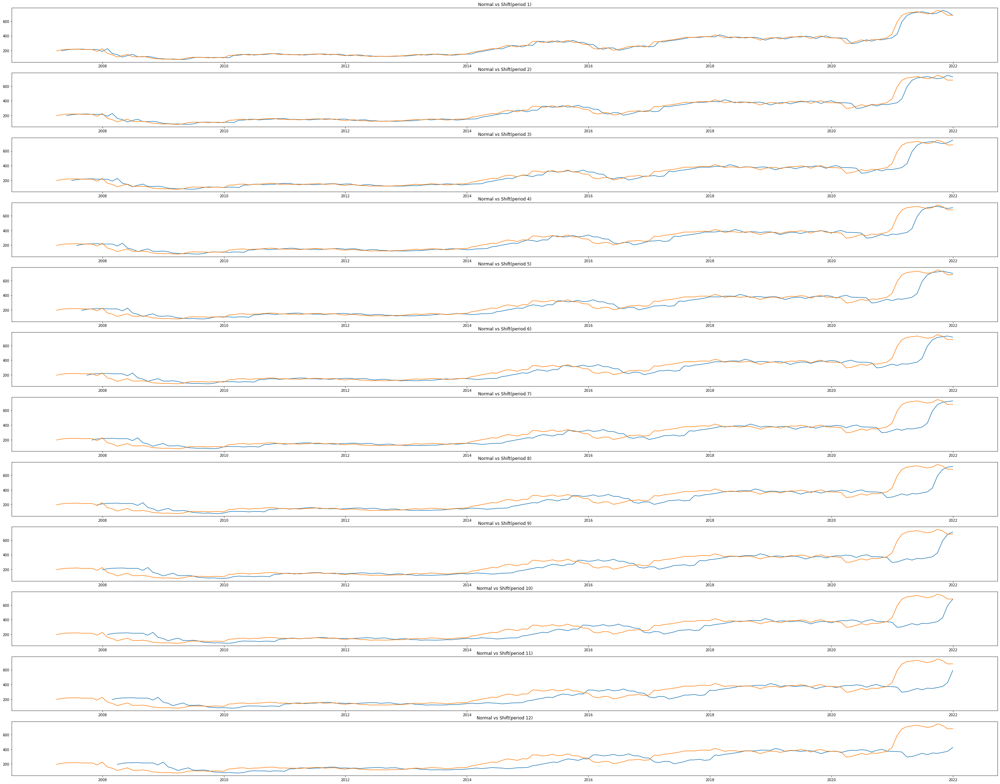

<Figure size 1080x504 with 0 Axes>

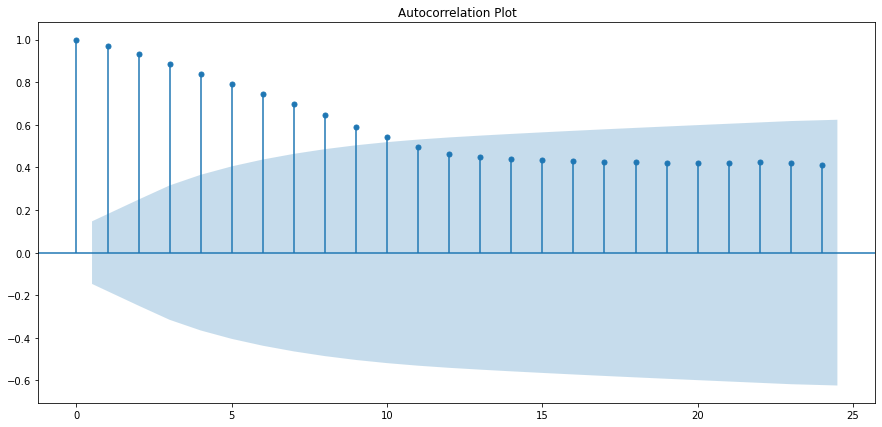

<Figure size 1080x504 with 0 Axes>

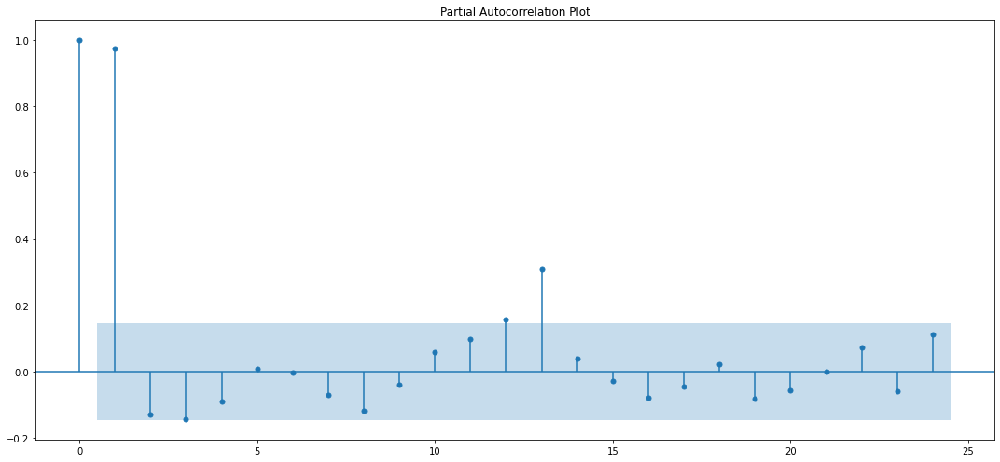

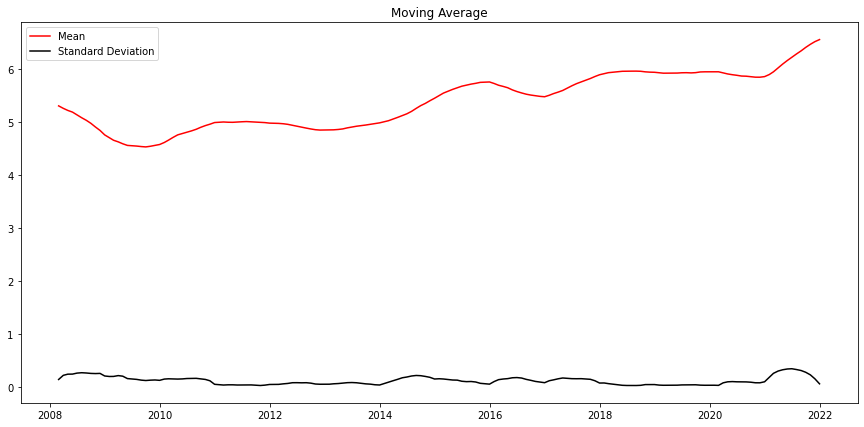

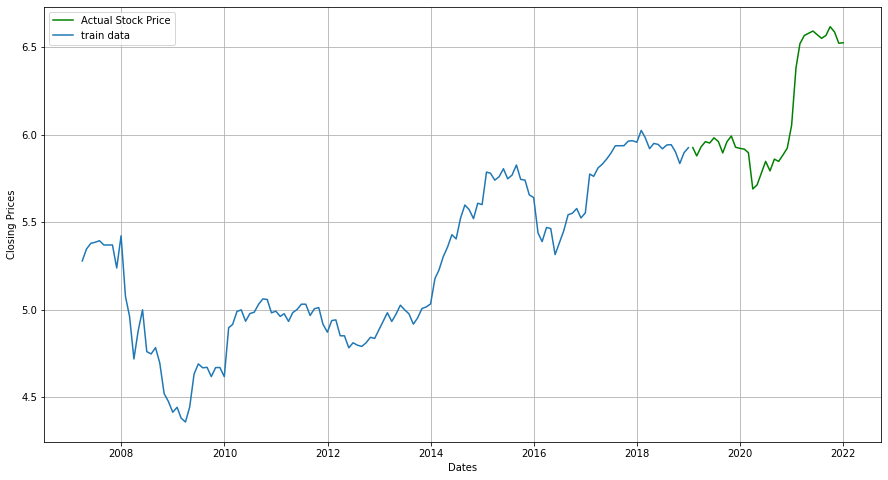

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2530.4937177964566
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 2370.553430821997
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 2037.5060044489267
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1888.617955193747
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2032.6437205242166
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1942.6860843295028
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1898.7541608890338
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1888.4891948258069
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 2286.4219407879978
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 2146.1967358747756
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1847.5220167178545
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1703.0781284329041
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1862.5394785205538
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1759.4486235108443
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1

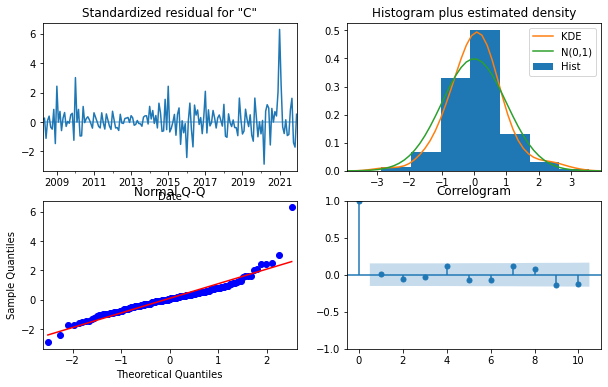

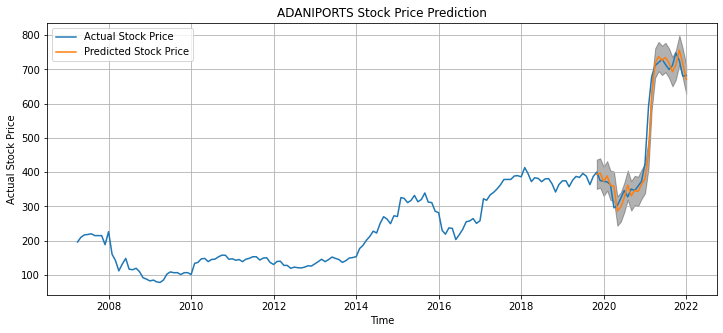

The Mean Squared Error is 1381.25
The root Mean Squared Error is 37.17


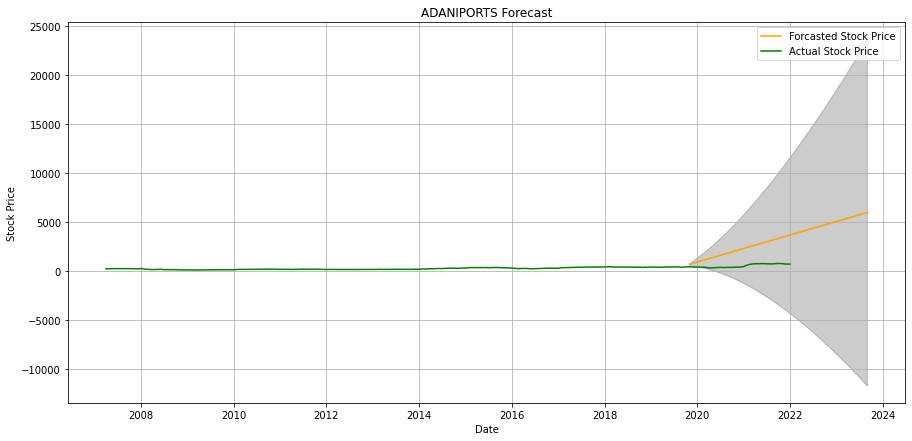

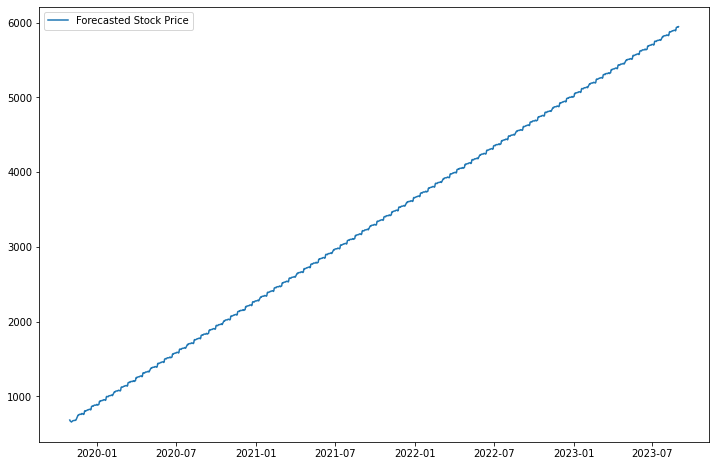

Epoch 1/50
4/4 [==============================] - 12s 125ms/step - loss: 0.2876
Epoch 2/50
4/4 [==============================] - 1s 124ms/step - loss: 0.0683
Epoch 3/50
4/4 [==============================] - 1s 128ms/step - loss: 0.0361
Epoch 4/50
4/4 [==============================] - 1s 125ms/step - loss: 0.0499
Epoch 5/50
4/4 [==============================] - 0s 123ms/step - loss: 0.0332
Epoch 6/50
4/4 [==============================] - 0s 117ms/step - loss: 0.0292
Epoch 7/50
4/4 [==============================] - 0s 120ms/step - loss: 0.0306
Epoch 8/50
4/4 [==============================] - 0s 112ms/step - loss: 0.0278
Epoch 9/50
4/4 [==============================] - 0s 107ms/step - loss: 0.0280
Epoch 10/50
4/4 [==============================] - 0s 100ms/step - loss: 0.0259
Epoch 11/50
4/4 [==============================] - 0s 117ms/step - loss: 0.0267
Epoch 12/50
4/4 [==============================] - 0s 112ms/step - loss: 0.0261
Epoch 13/50
4/4 [==============================]

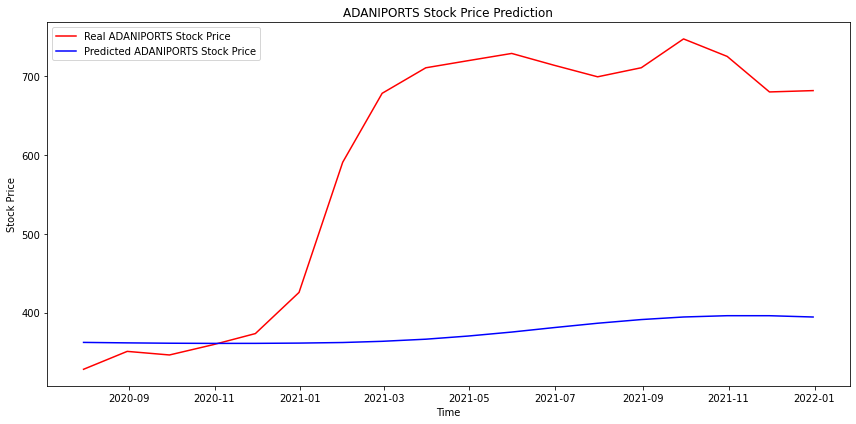

In [137]:
stock_market_prediction(nifty_data,symbol="ADANIPORTS",heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1,sarimax=1, lstm=1, test=1)

#### POWERGRID

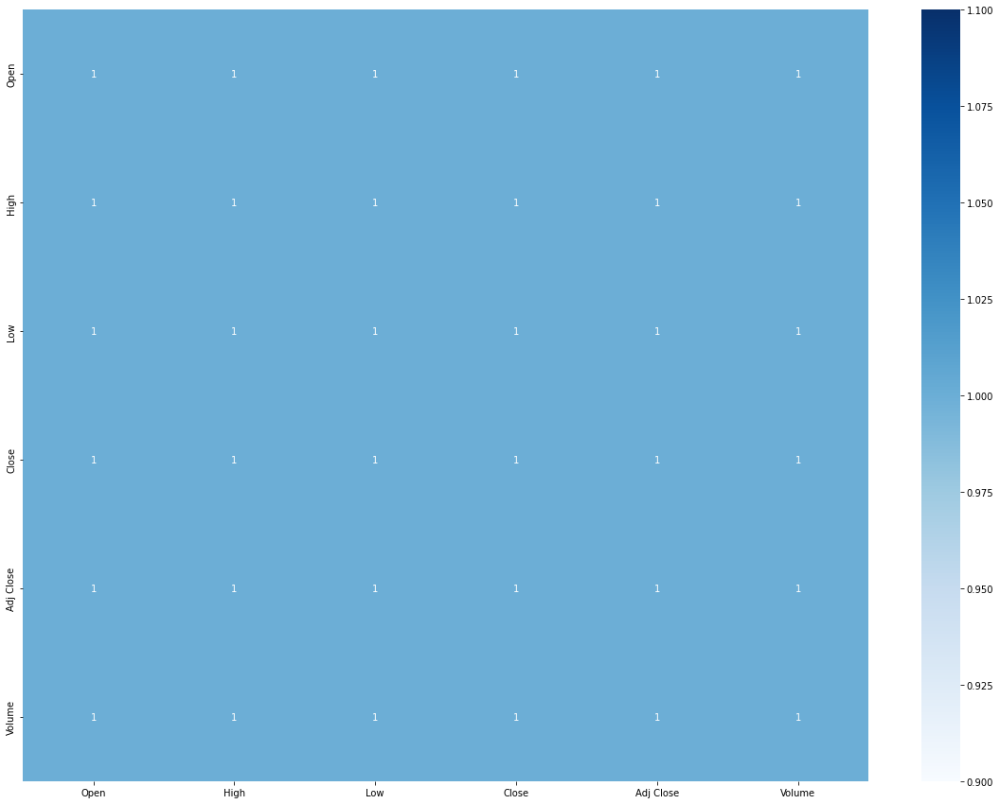

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.075836,0.951793,14,165,False,False


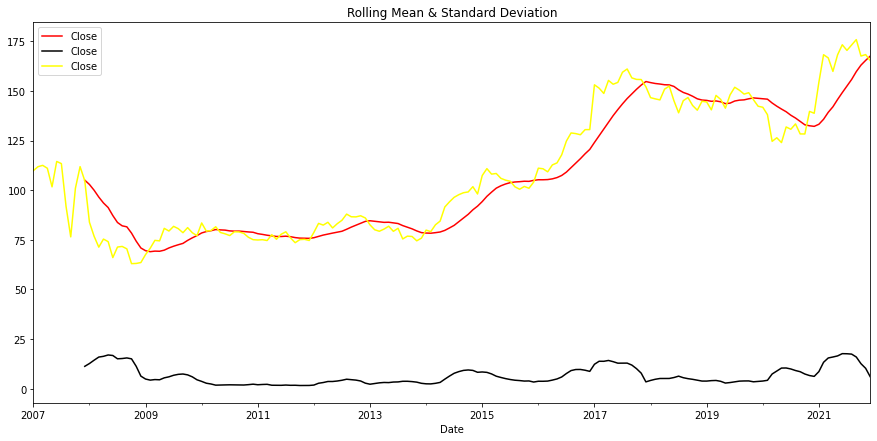

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

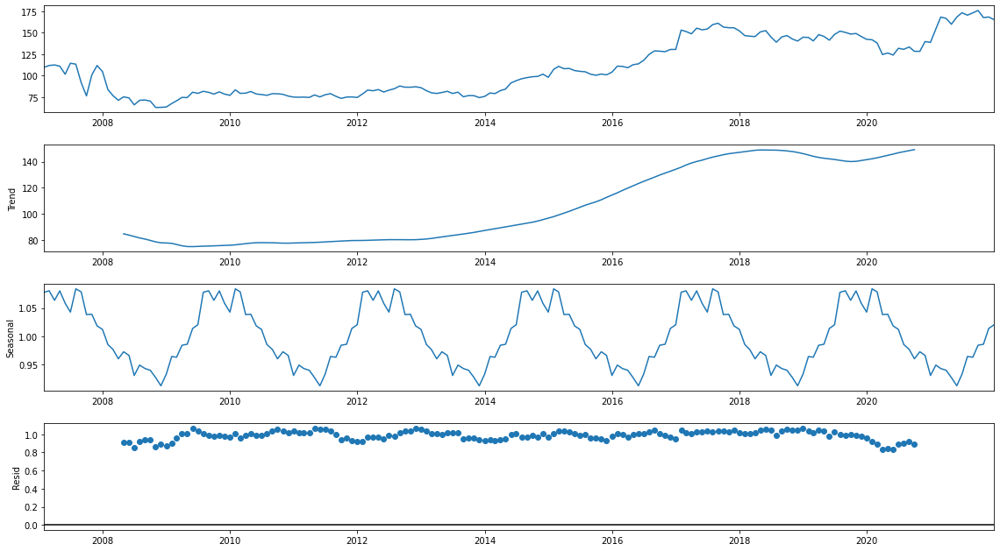

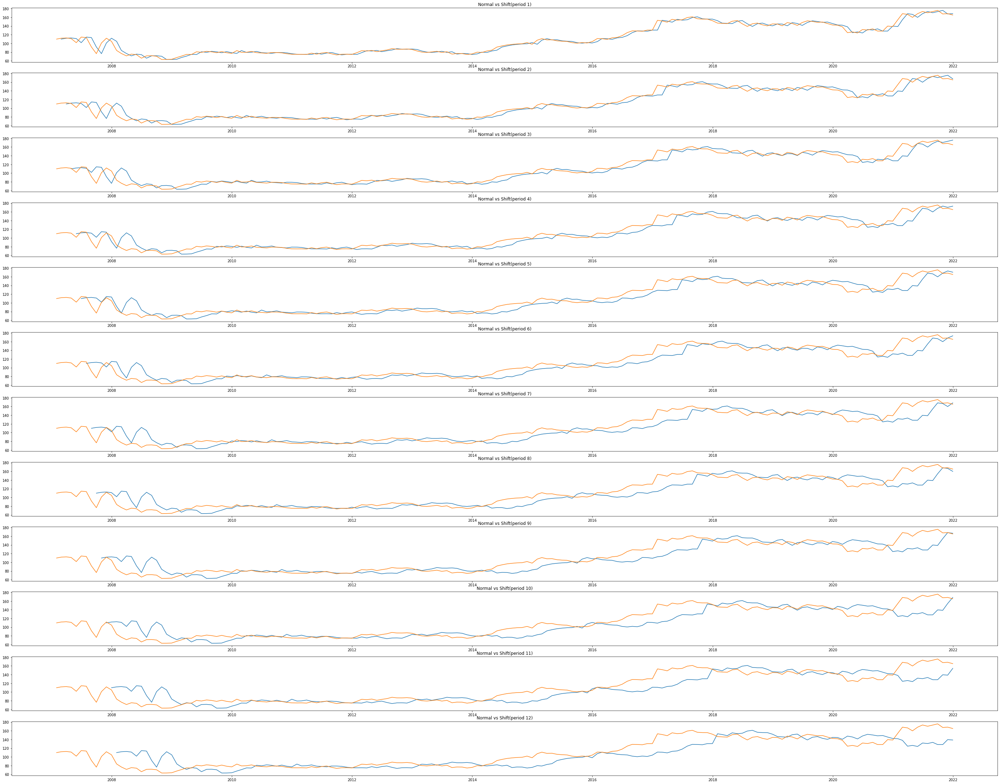

<Figure size 1080x504 with 0 Axes>

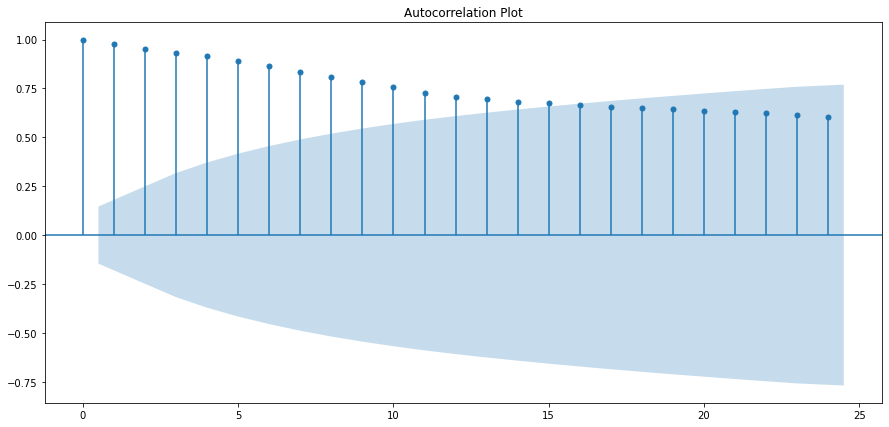

<Figure size 1080x504 with 0 Axes>

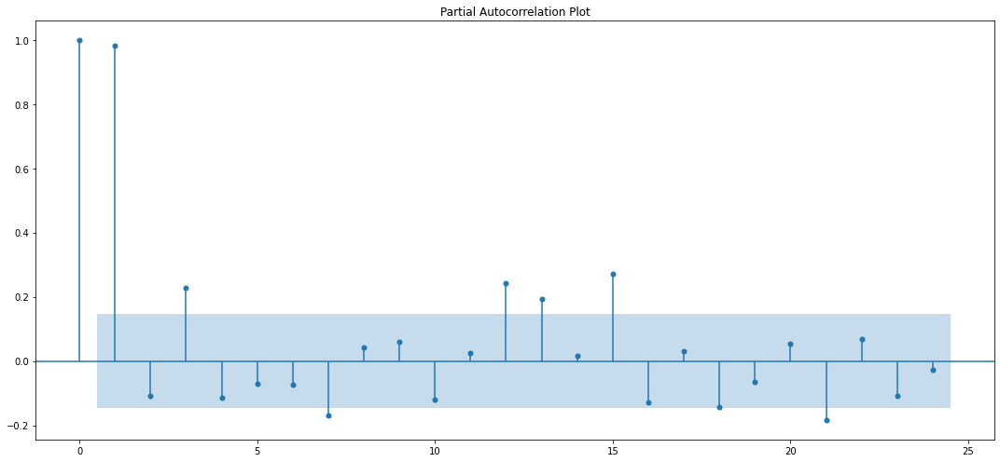

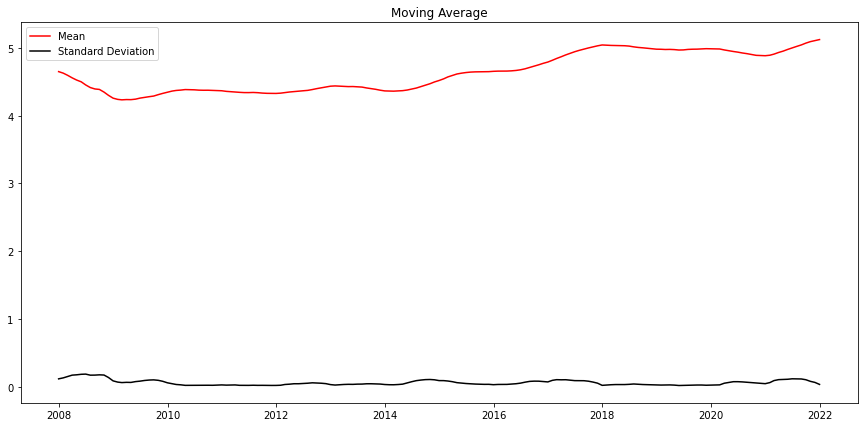

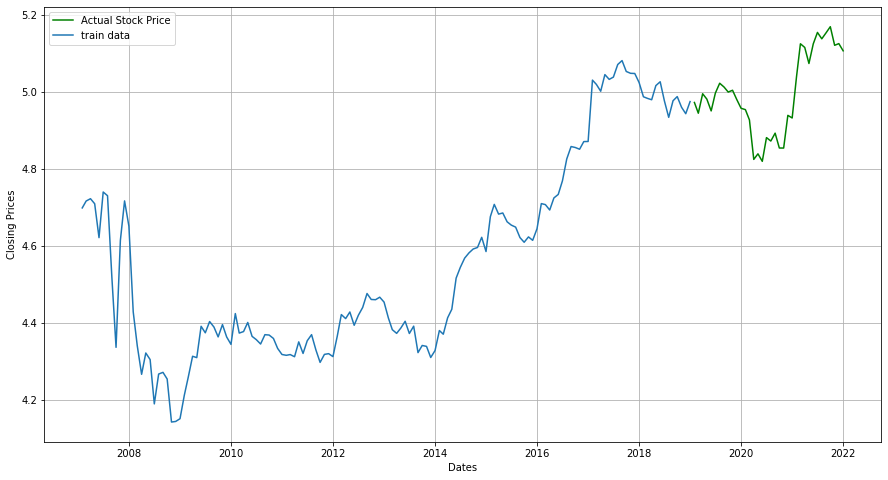

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2204.4610334553818
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1894.1999531967767
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1474.0740845610105
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1336.206198681692
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1479.515052819413
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1456.3364526136063
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1343.156179805193
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1335.220432817952
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1956.4867540862786
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1668.5376897811502
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1303.0052267428882
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1174.1005432652082
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1321.181475887254
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1280.8107325159203
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1184

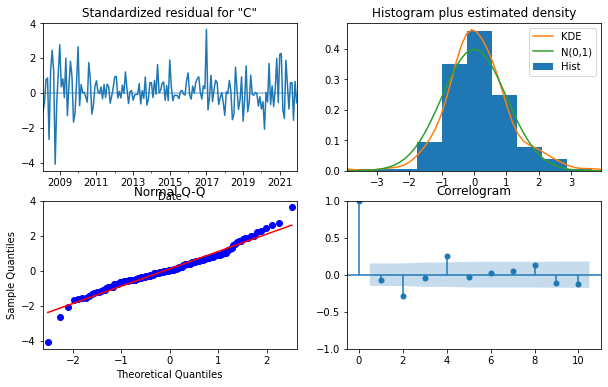

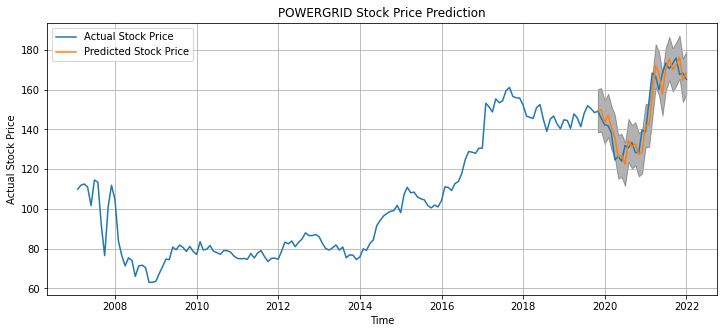

The Mean Squared Error is 41.68
The root Mean Squared Error is 6.46


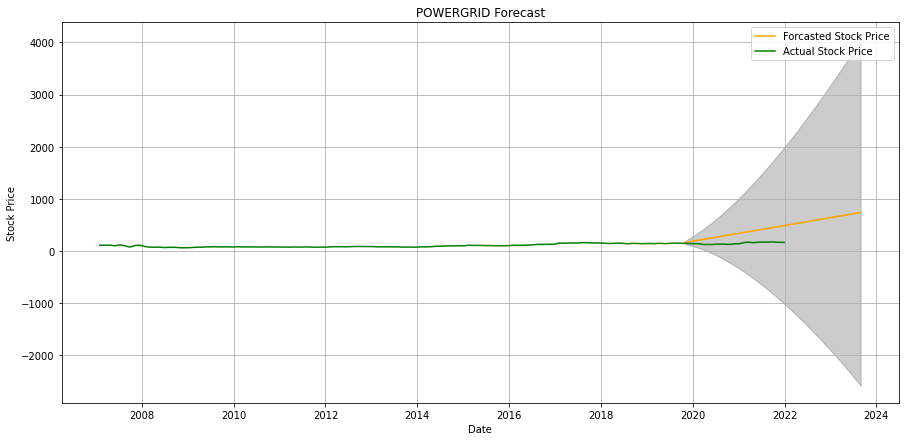

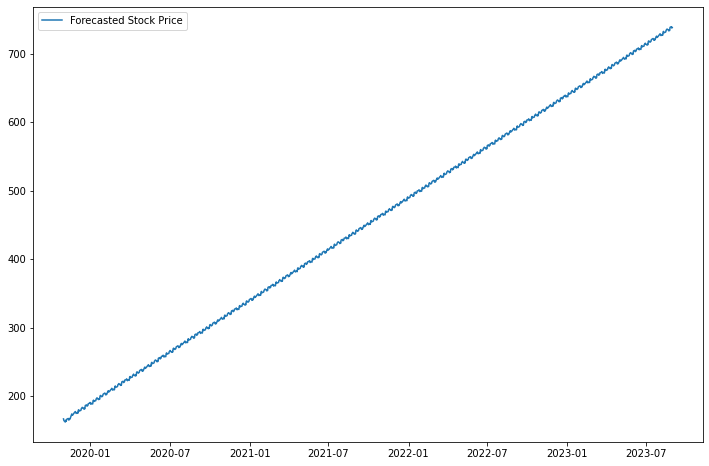

Epoch 1/50
4/4 [==============================] - 12s 117ms/step - loss: 0.3231
Epoch 2/50
4/4 [==============================] - 0s 114ms/step - loss: 0.0824
Epoch 3/50
4/4 [==============================] - 0s 110ms/step - loss: 0.0537
Epoch 4/50
4/4 [==============================] - 0s 107ms/step - loss: 0.0288
Epoch 5/50
4/4 [==============================] - 1s 127ms/step - loss: 0.0330
Epoch 6/50
4/4 [==============================] - 0s 123ms/step - loss: 0.0212
Epoch 7/50
4/4 [==============================] - 0s 117ms/step - loss: 0.0231
Epoch 8/50
4/4 [==============================] - 0s 107ms/step - loss: 0.0211
Epoch 9/50
4/4 [==============================] - 0s 117ms/step - loss: 0.0211
Epoch 10/50
4/4 [==============================] - 0s 124ms/step - loss: 0.0192
Epoch 11/50
4/4 [==============================] - 1s 126ms/step - loss: 0.0174
Epoch 12/50
4/4 [==============================] - 1s 132ms/step - loss: 0.0179
Epoch 13/50
4/4 [==============================]

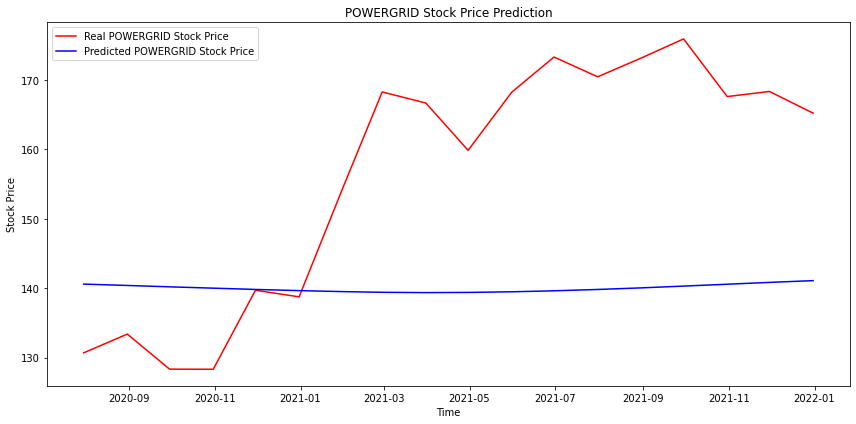

In [138]:
stock_market_prediction(nifty_data, symbol="POWERGRID", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### ICICI BANK

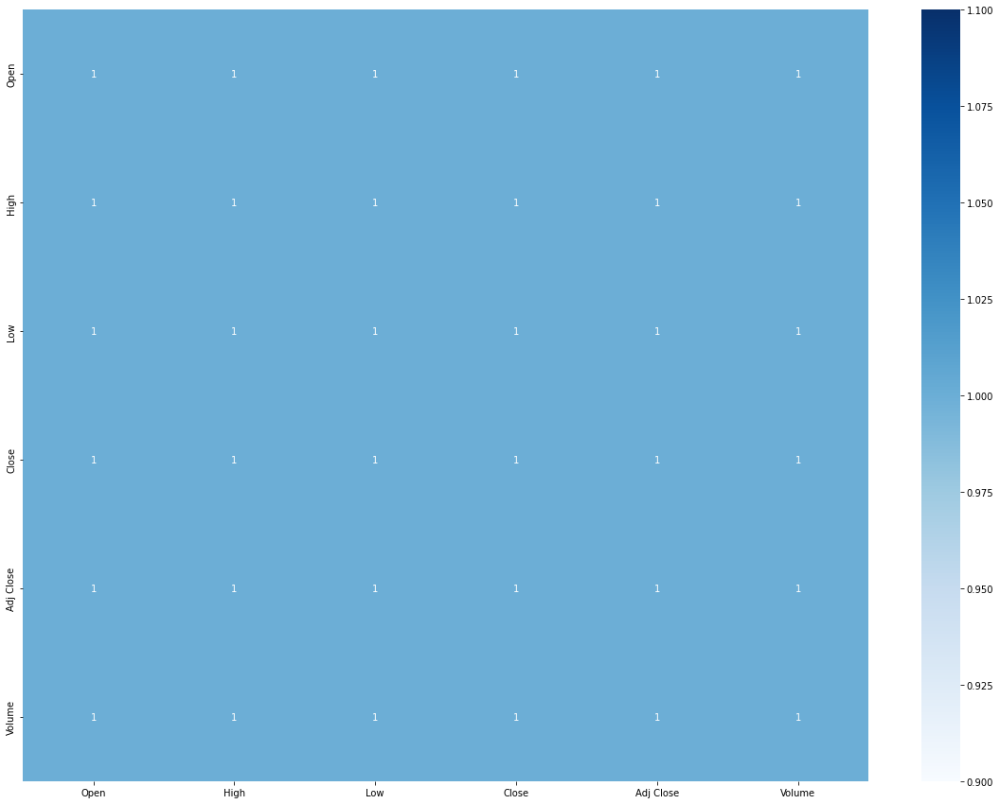

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,0.723996,0.990305,0,239,False,False


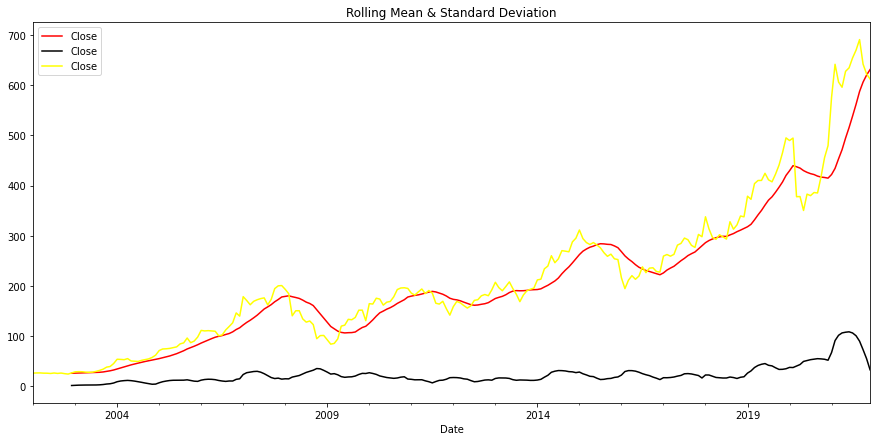

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

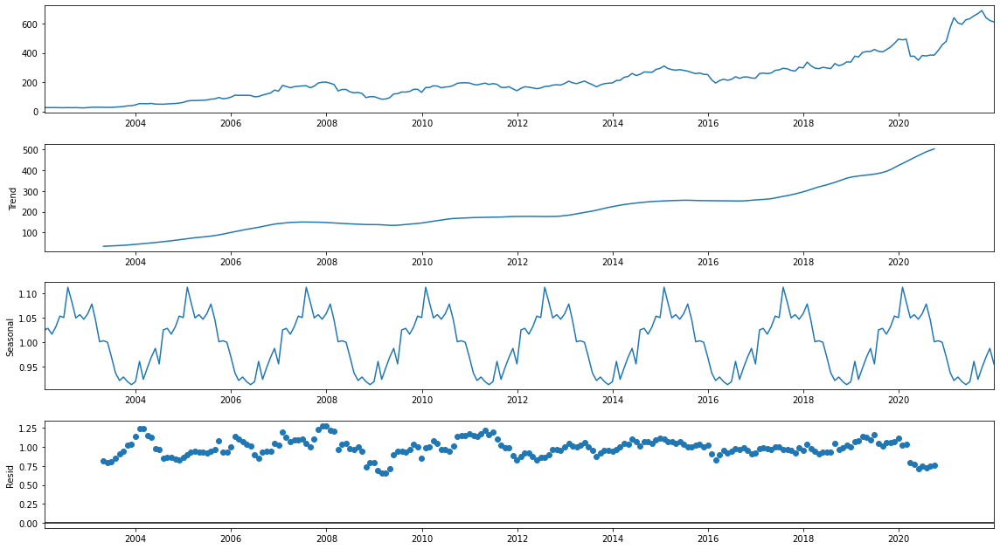

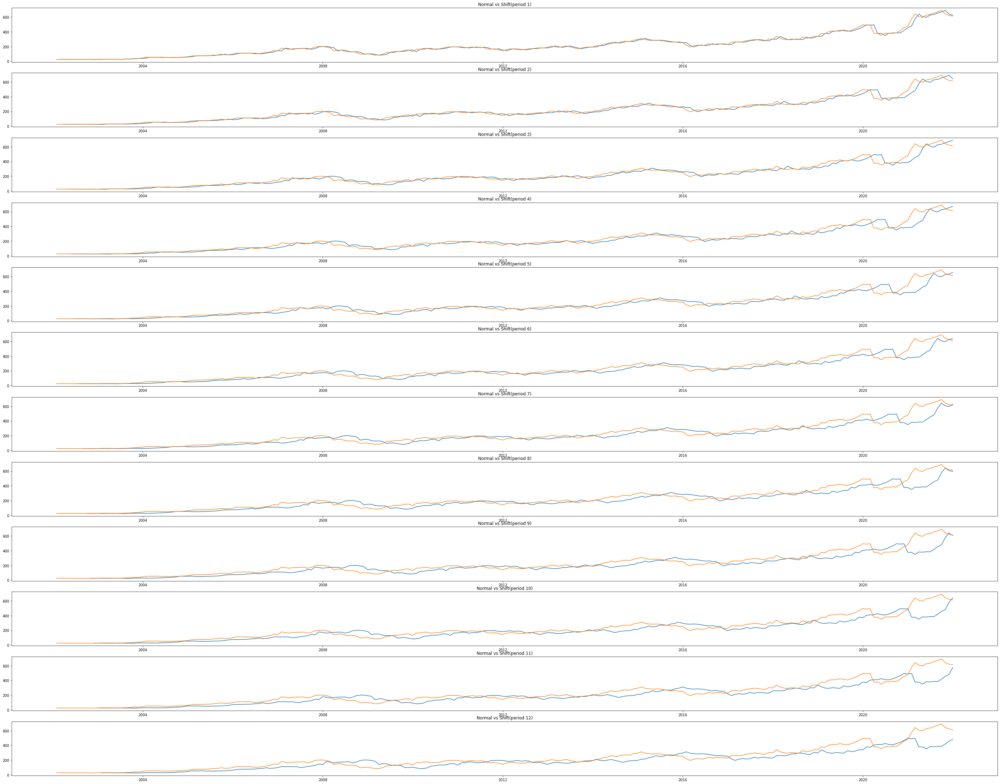

<Figure size 1080x504 with 0 Axes>

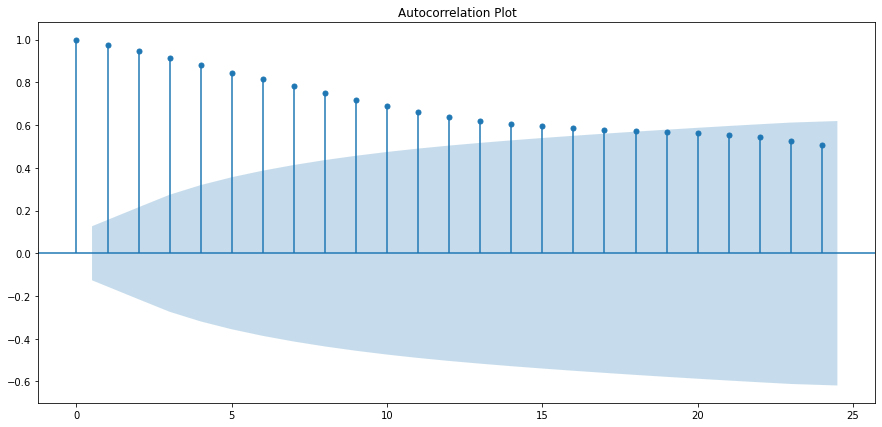

<Figure size 1080x504 with 0 Axes>

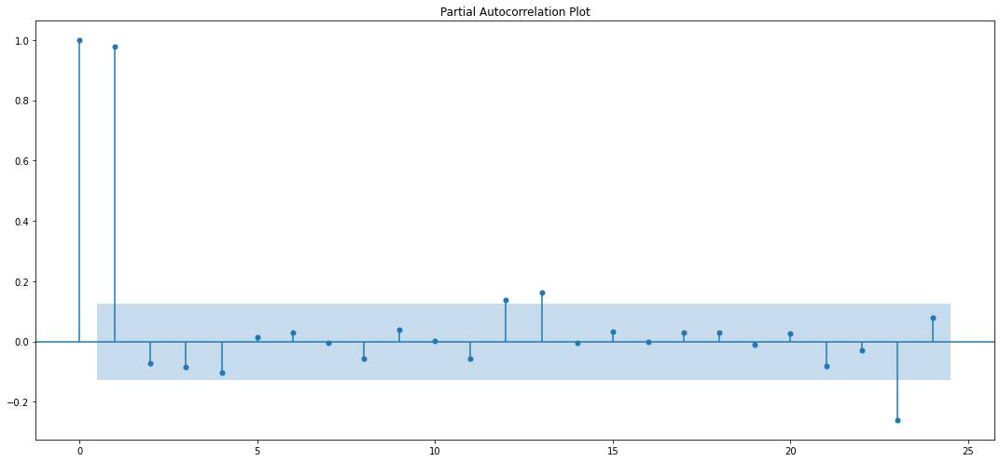

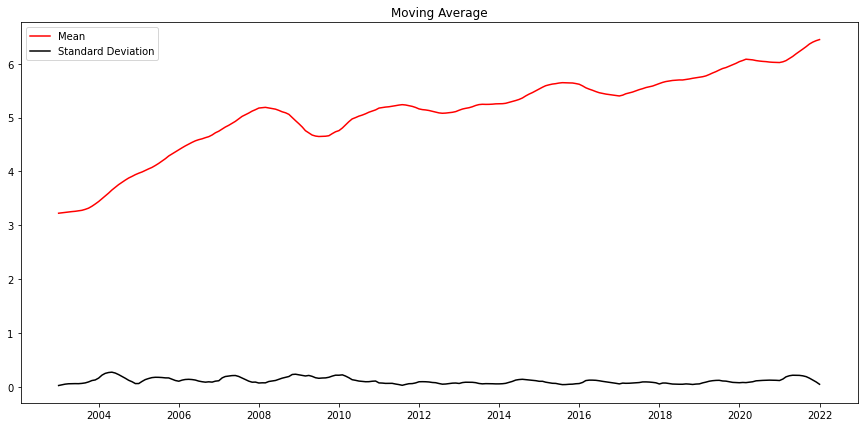

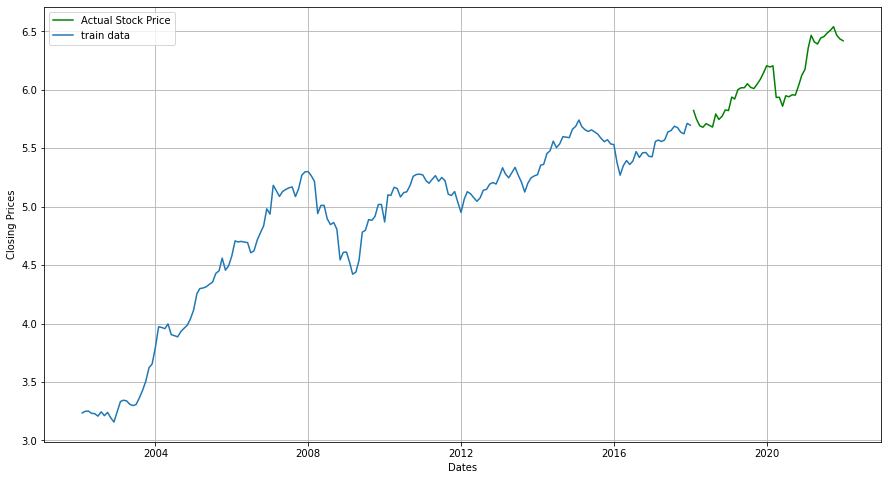

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 3336.993015180141
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 3000.665342703258
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 2594.445443086718
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 2469.5759257872223
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2545.954901241257
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 2475.14350400362
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 2478.8665152704734
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 2462.767987382749
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 3022.3261464252964
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 2710.6323204579203
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 2370.2620349256454
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2252.3277361205533
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2351.139691464127
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2259.149655291757
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 2268.765

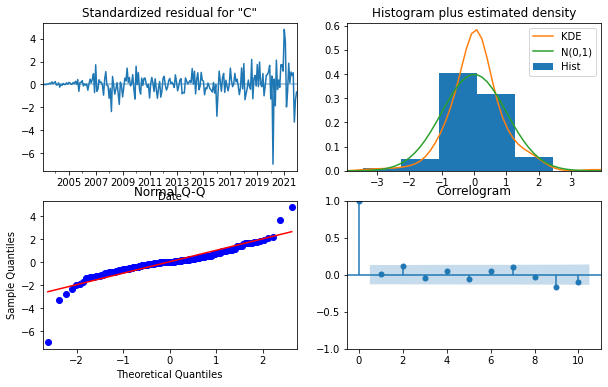

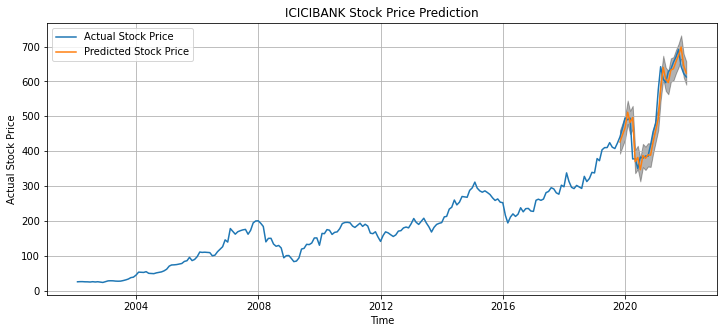

The Mean Squared Error is 1421.38
The root Mean Squared Error is 37.7


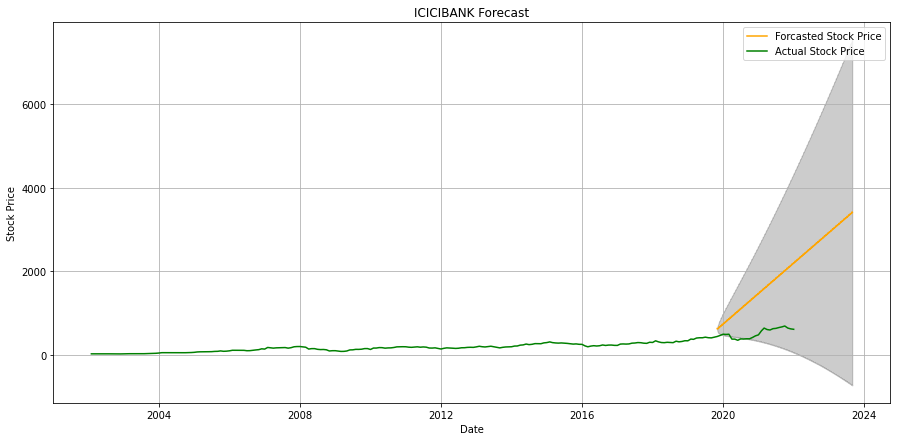

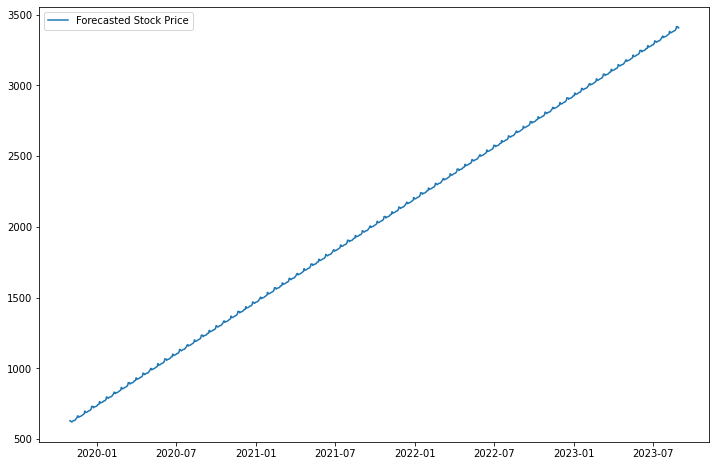

Epoch 1/50
5/5 [==============================] - 14s 221ms/step - loss: 0.1378
Epoch 2/50
5/5 [==============================] - 1s 200ms/step - loss: 0.0291
Epoch 3/50
5/5 [==============================] - 1s 200ms/step - loss: 0.0196
Epoch 4/50
5/5 [==============================] - 1s 200ms/step - loss: 0.0193
Epoch 5/50
5/5 [==============================] - 1s 213ms/step - loss: 0.0146
Epoch 6/50
5/5 [==============================] - 1s 209ms/step - loss: 0.0138
Epoch 7/50
5/5 [==============================] - 1s 205ms/step - loss: 0.0130
Epoch 8/50
5/5 [==============================] - 1s 212ms/step - loss: 0.0117
Epoch 9/50
5/5 [==============================] - 1s 197ms/step - loss: 0.0107
Epoch 10/50
5/5 [==============================] - 1s 200ms/step - loss: 0.0098
Epoch 11/50
5/5 [==============================] - 1s 211ms/step - loss: 0.0099
Epoch 12/50
5/5 [==============================] - 1s 203ms/step - loss: 0.0092
Epoch 13/50
5/5 [==============================]

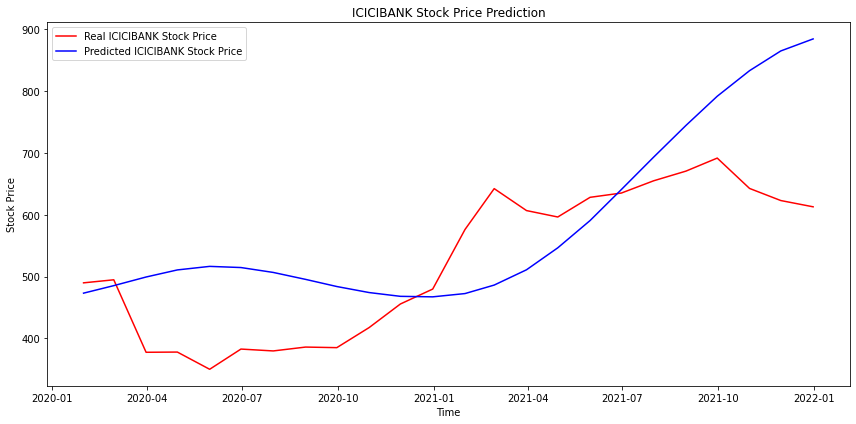

In [139]:
stock_market_prediction(nifty_data, symbol="ICICIBANK", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### KOTAK BANK

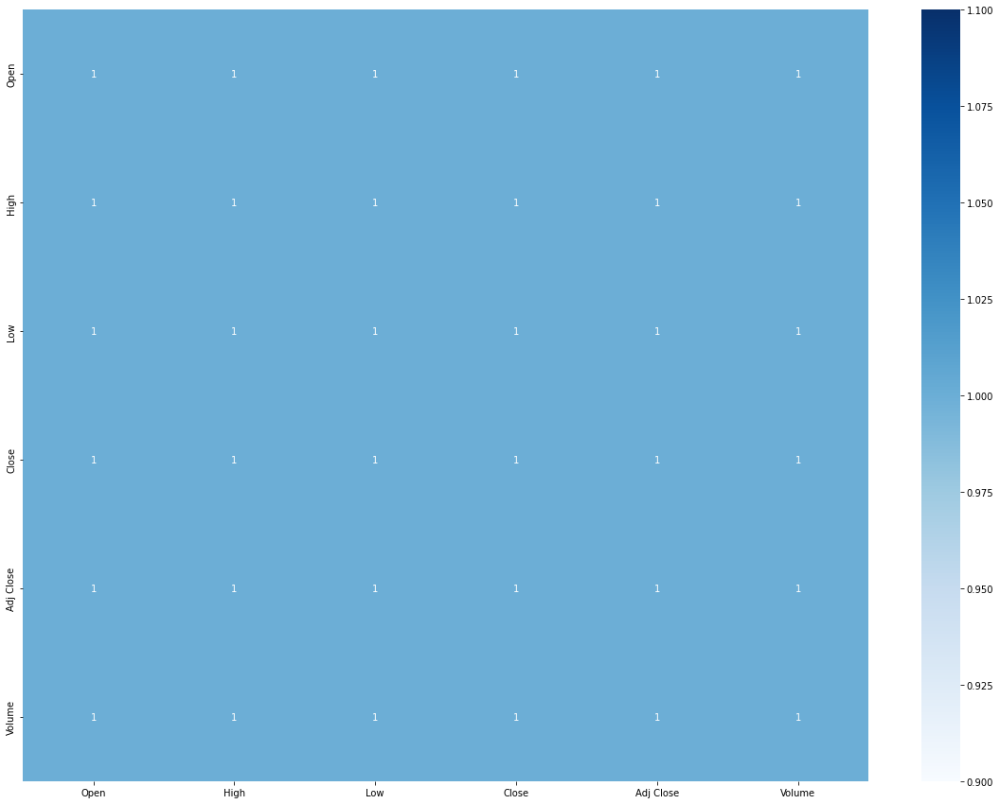

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,3.338074,1.0,8,243,False,False


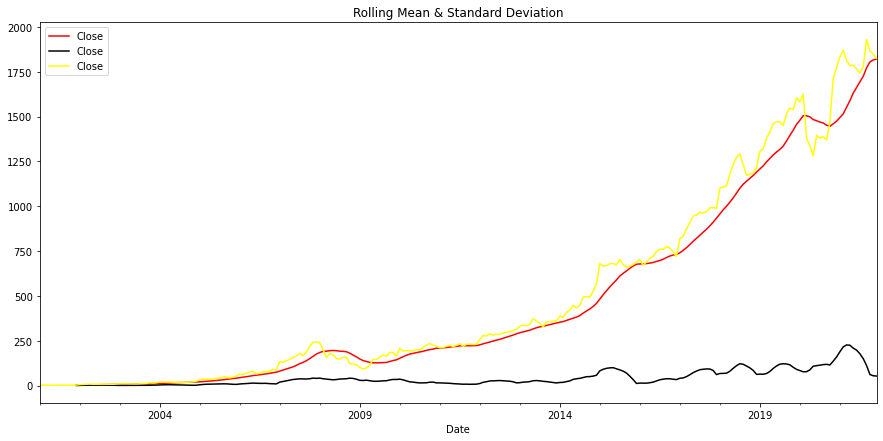

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

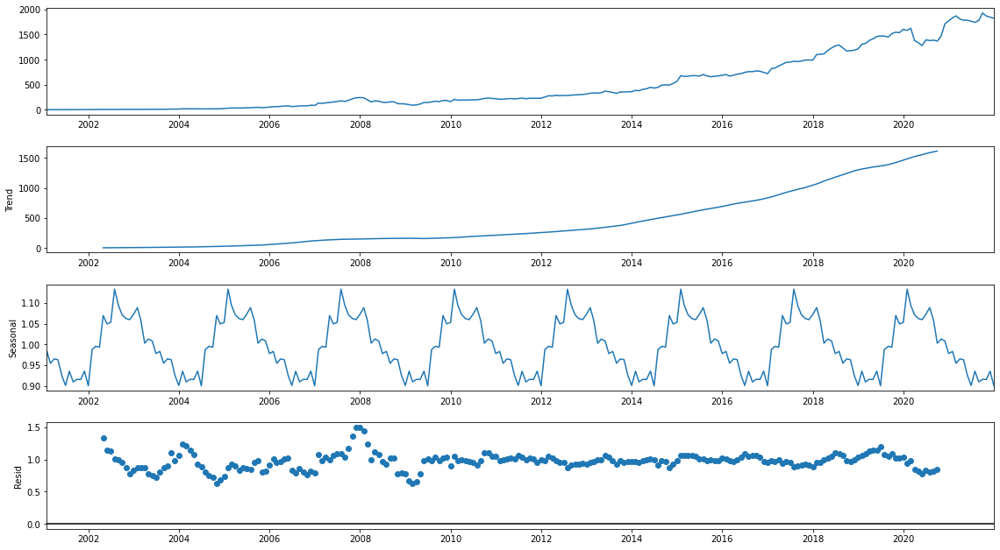

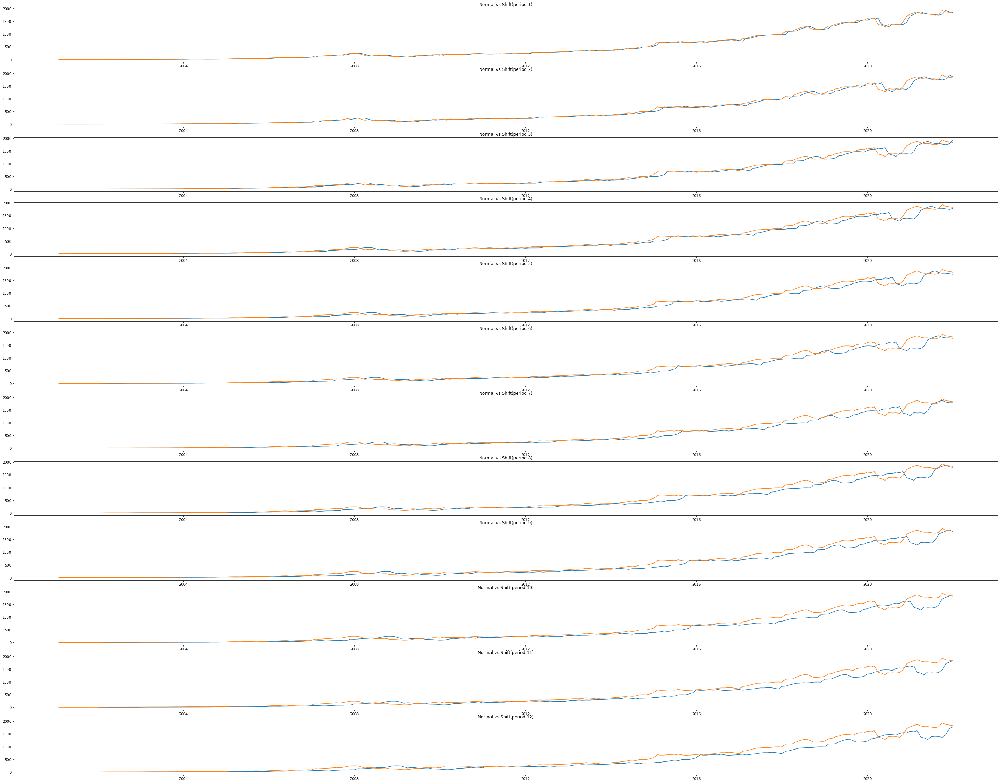

<Figure size 1080x504 with 0 Axes>

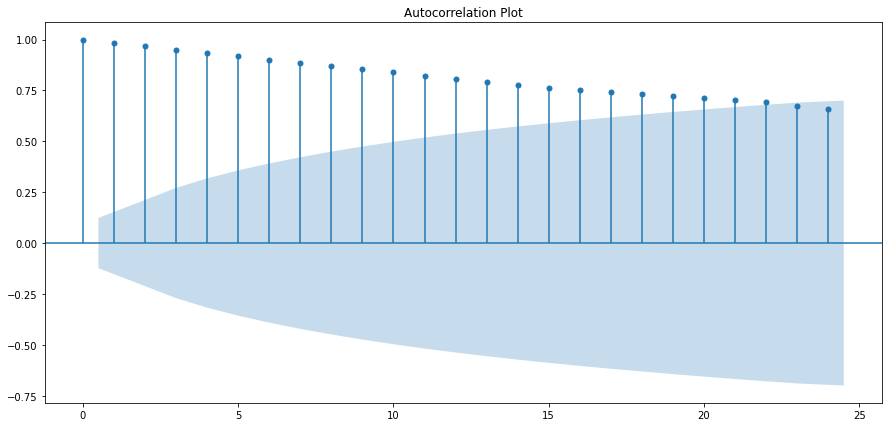

<Figure size 1080x504 with 0 Axes>

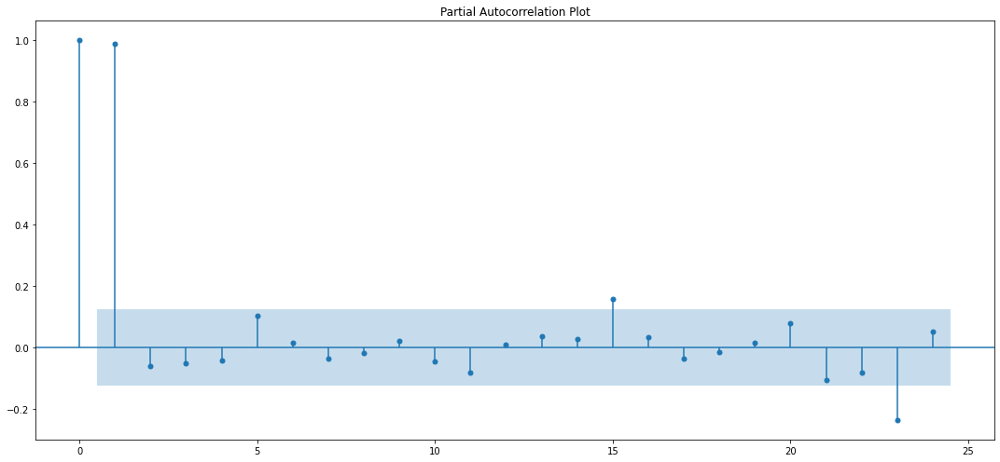

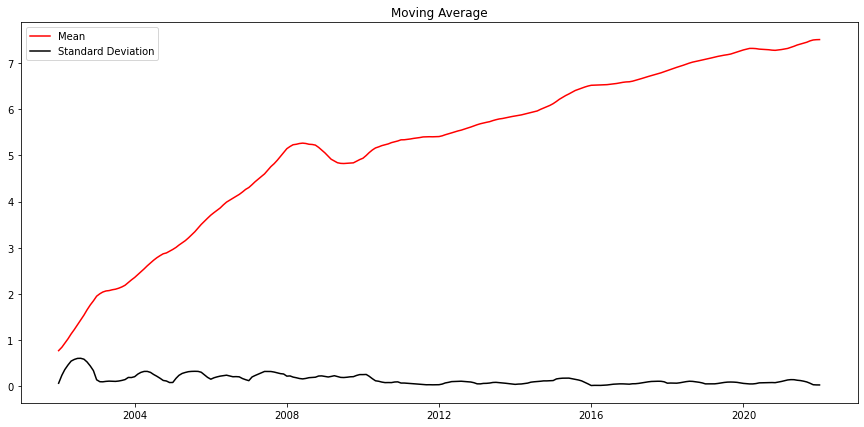

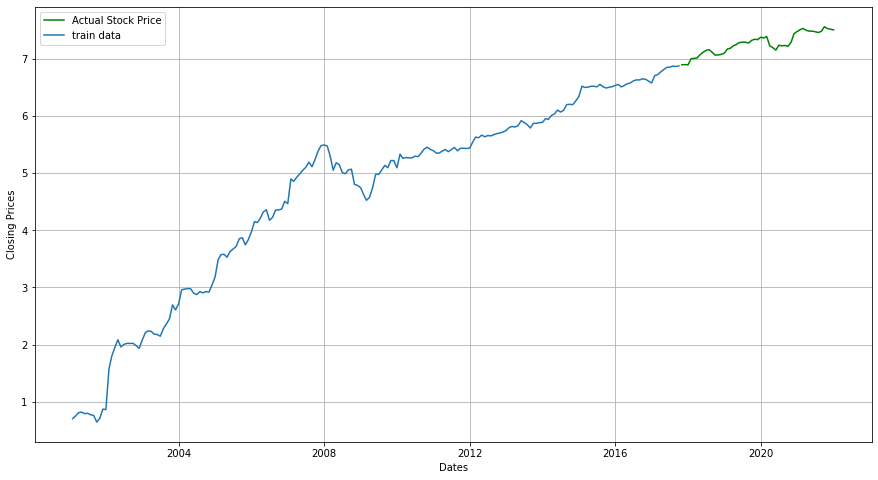

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4032.348721160328
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 3619.375881891007
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 3080.247826236411
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 2919.031701114656
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2905.8990154223593
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 2857.199400764439
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 2907.24898885735
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 2787.9169584217616
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 3693.7827615804085
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 3311.01616476479
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 2841.146571339985
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2706.3709739202213
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2732.334904742327
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2661.6379830469423
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 2721.71232

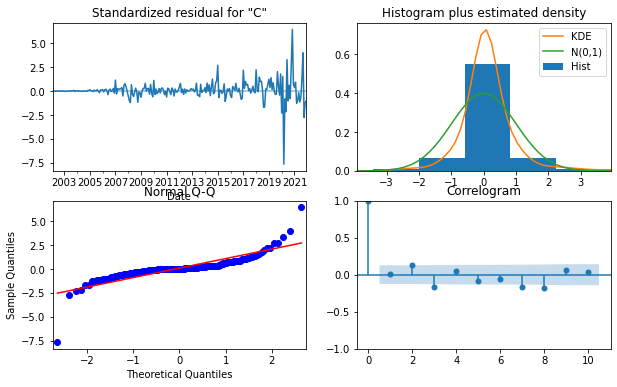

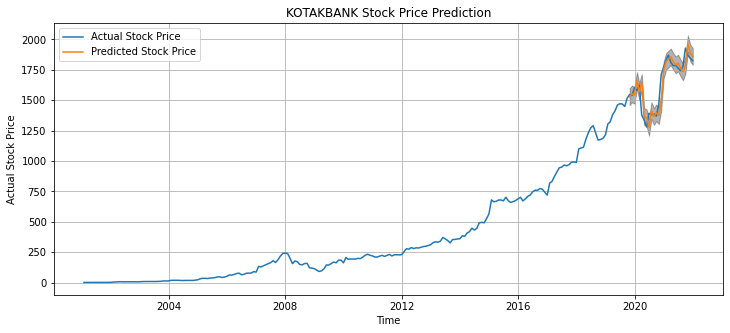

The Mean Squared Error is 7831.11
The root Mean Squared Error is 88.49


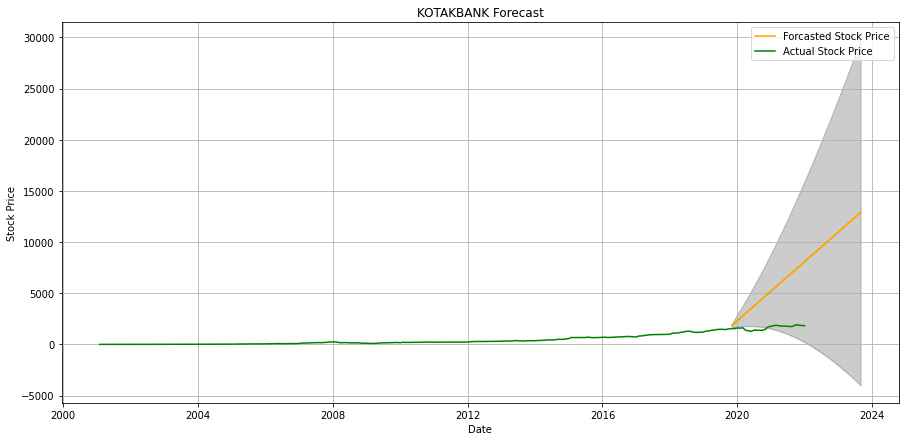

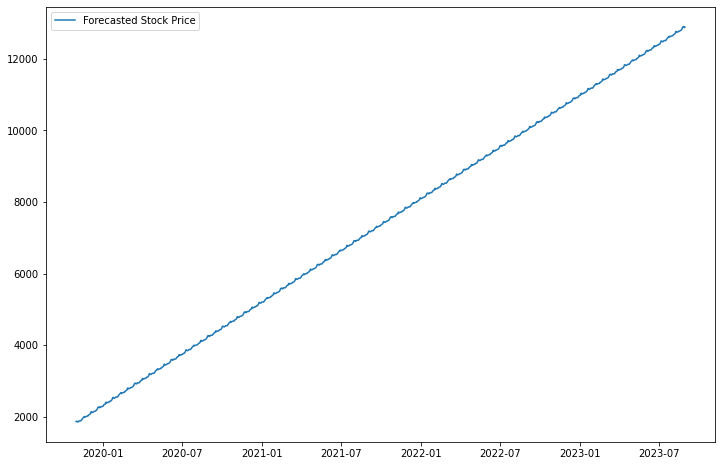

Epoch 1/50
6/6 [==============================] - 14s 275ms/step - loss: 0.1179
Epoch 2/50
6/6 [==============================] - 1s 244ms/step - loss: 0.0310
Epoch 3/50
6/6 [==============================] - 2s 262ms/step - loss: 0.0170
Epoch 4/50
6/6 [==============================] - 2s 261ms/step - loss: 0.0049
Epoch 5/50
6/6 [==============================] - 2s 257ms/step - loss: 0.0029
Epoch 6/50
6/6 [==============================] - 1s 220ms/step - loss: 0.0023
Epoch 7/50
6/6 [==============================] - 1s 250ms/step - loss: 0.0020
Epoch 8/50
6/6 [==============================] - 2s 250ms/step - loss: 0.0021
Epoch 9/50
6/6 [==============================] - 2s 262ms/step - loss: 0.0019
Epoch 10/50
6/6 [==============================] - 1s 209ms/step - loss: 0.0018
Epoch 11/50
6/6 [==============================] - 1s 214ms/step - loss: 0.0018
Epoch 12/50
6/6 [==============================] - 1s 197ms/step - loss: 0.0018
Epoch 13/50
6/6 [==============================]

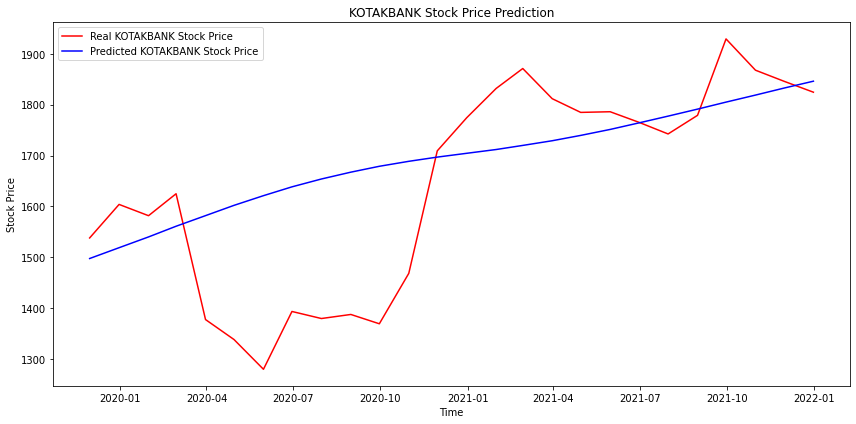

In [140]:
stock_market_prediction(nifty_data, symbol="KOTAKBANK", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### ASTRAL

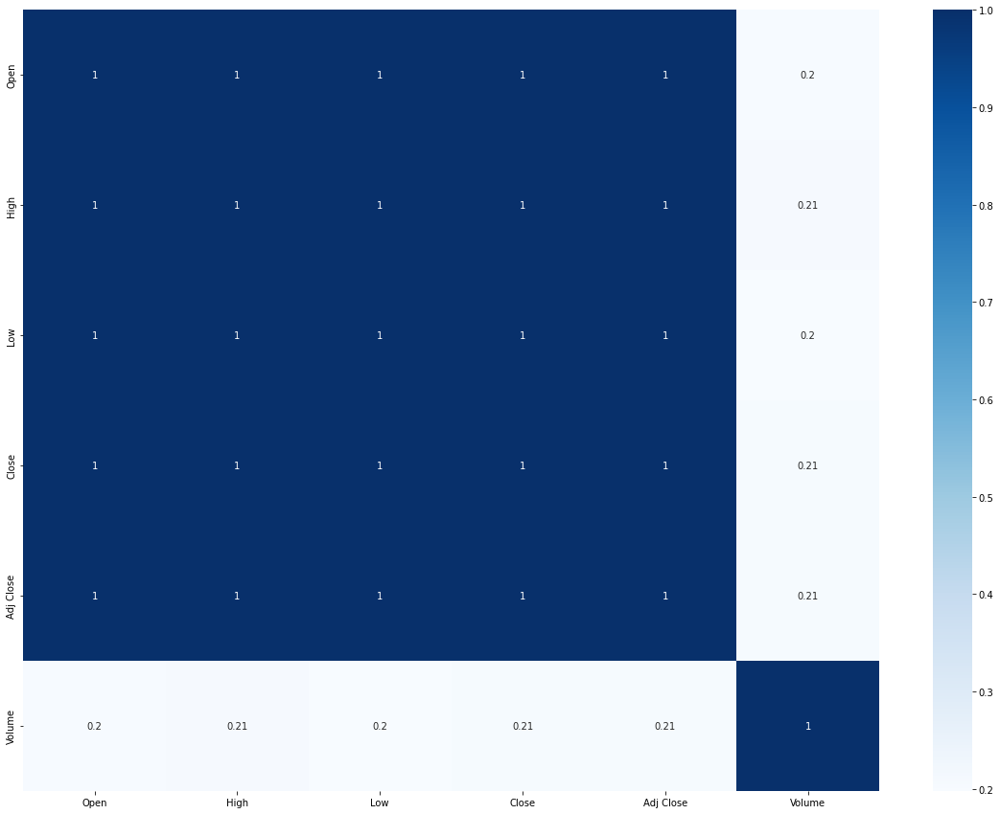

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,2.775656,1.0,9,122,False,False


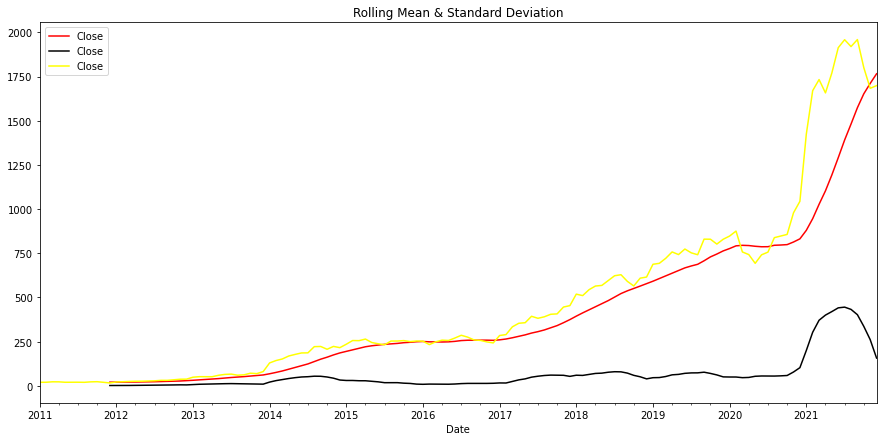

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

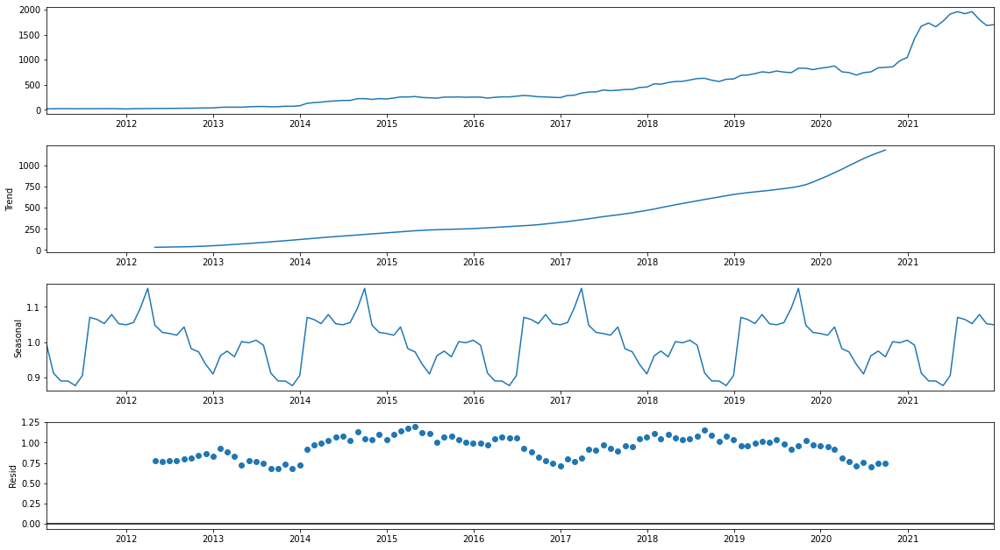

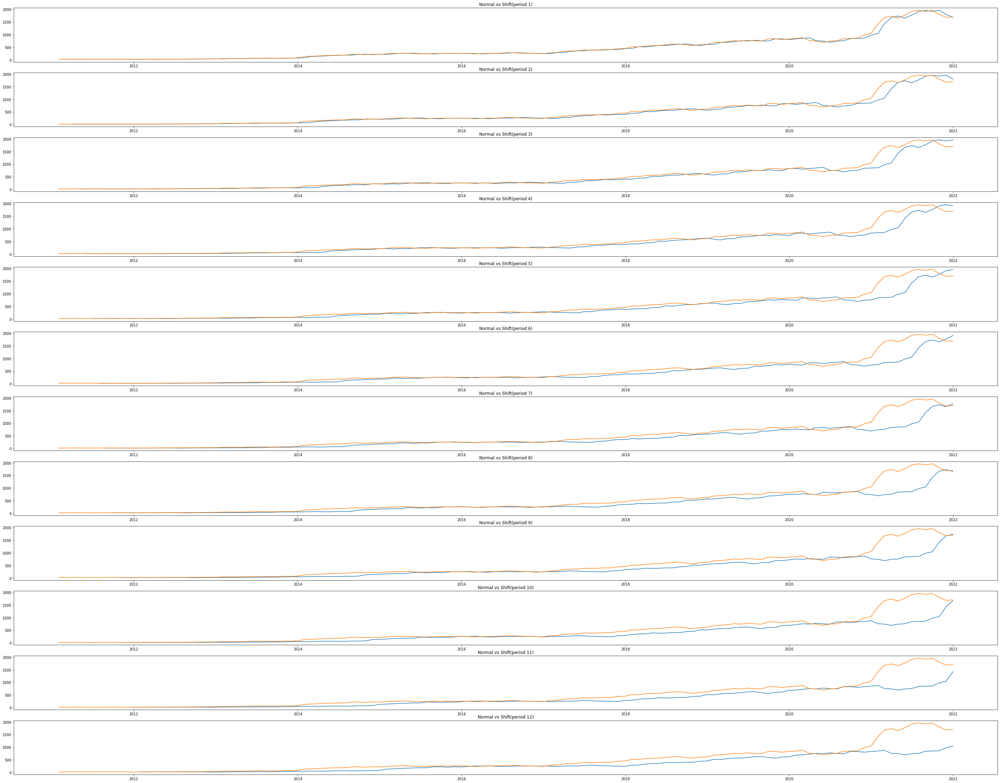

<Figure size 1080x504 with 0 Axes>

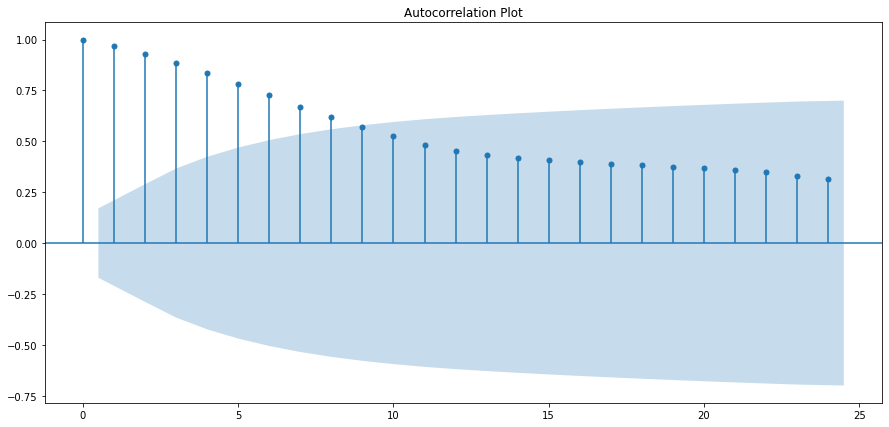

<Figure size 1080x504 with 0 Axes>

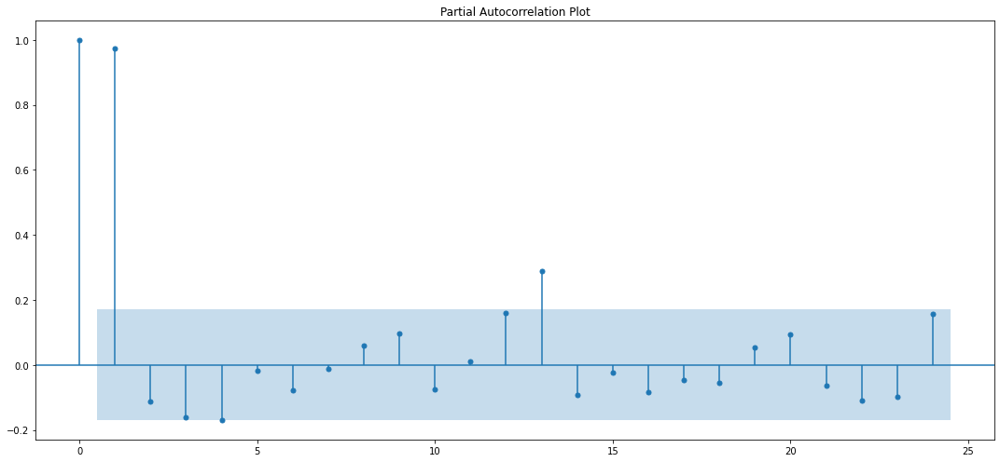

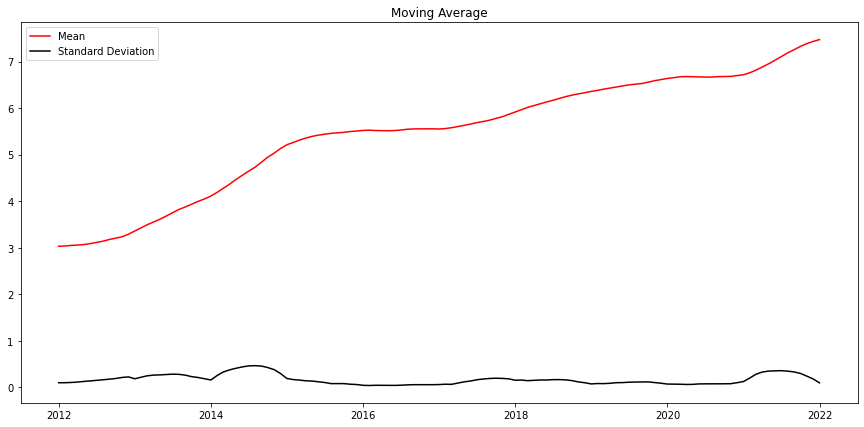

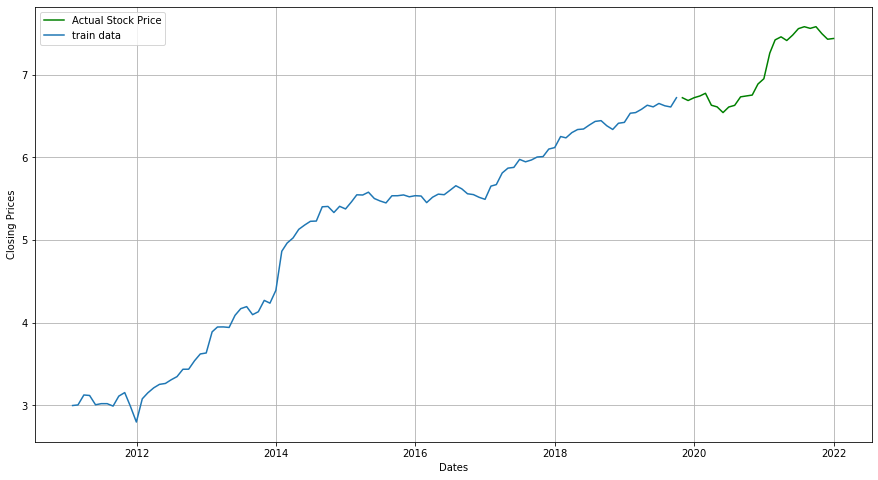

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2083.2619540762225
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1839.8888800446714
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1715.6694625064933
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1551.7292747747765
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1636.491543618321
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1562.735529380177
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1554.4550149147922
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1499.5381468831968
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1899.986287090913
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1677.2030670016297
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1561.134219174128
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1414.0687706422154
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1519.3903899660666
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1433.4195404526286
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 143

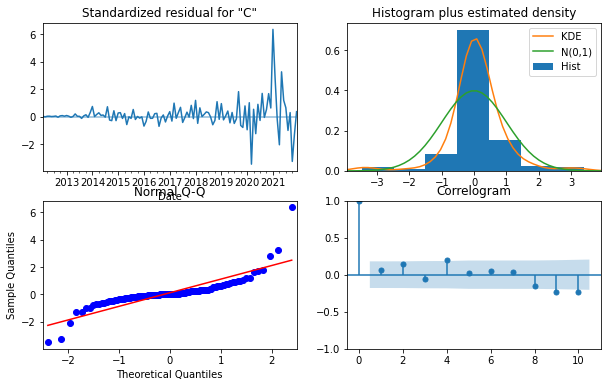

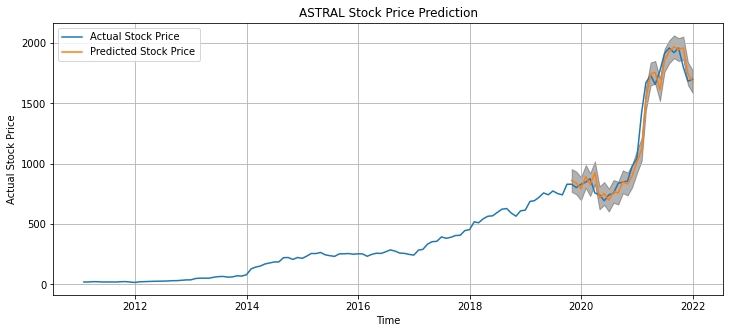

The Mean Squared Error is 8906.07
The root Mean Squared Error is 94.37


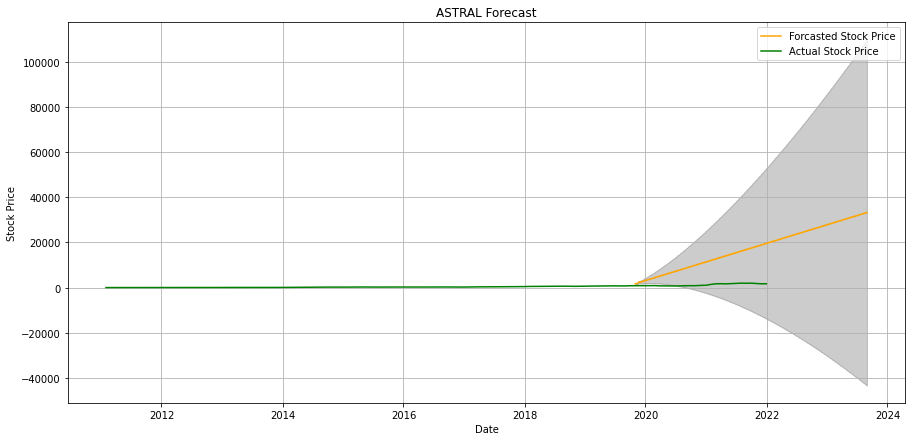

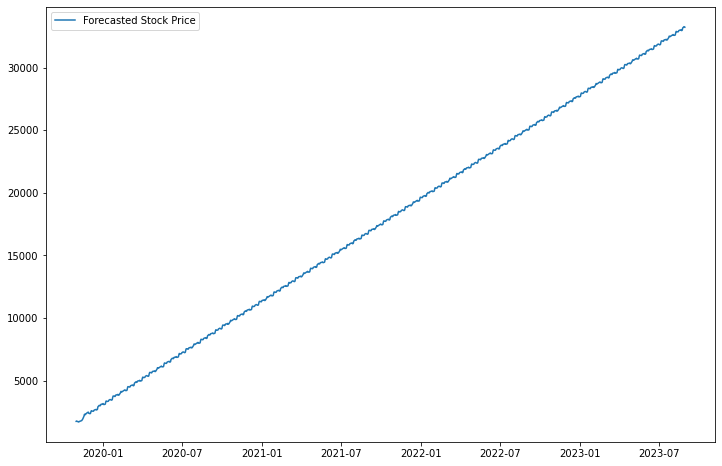

Epoch 1/50
2/2 [==============================] - 13s 211ms/step - loss: 0.3996
Epoch 2/50
2/2 [==============================] - 0s 208ms/step - loss: 0.2316
Epoch 3/50
2/2 [==============================] - 0s 181ms/step - loss: 0.0467
Epoch 4/50
2/2 [==============================] - 0s 179ms/step - loss: 0.0707
Epoch 5/50
2/2 [==============================] - 0s 201ms/step - loss: 0.0478
Epoch 6/50
2/2 [==============================] - 0s 176ms/step - loss: 0.0168
Epoch 7/50
2/2 [==============================] - 0s 198ms/step - loss: 0.0353
Epoch 8/50
2/2 [==============================] - 0s 184ms/step - loss: 0.0440
Epoch 9/50
2/2 [==============================] - 0s 180ms/step - loss: 0.0319
Epoch 10/50
2/2 [==============================] - 0s 178ms/step - loss: 0.0164
Epoch 11/50
2/2 [==============================] - 0s 217ms/step - loss: 0.0128
Epoch 12/50
2/2 [==============================] - 0s 183ms/step - loss: 0.0196
Epoch 13/50
2/2 [==============================]

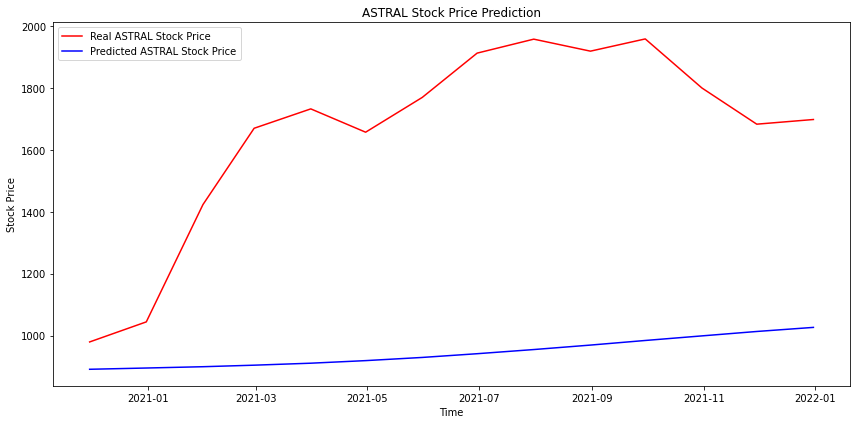

In [141]:
stock_market_prediction(NSE_data, symbol="ASTRAL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### SUMCHEM

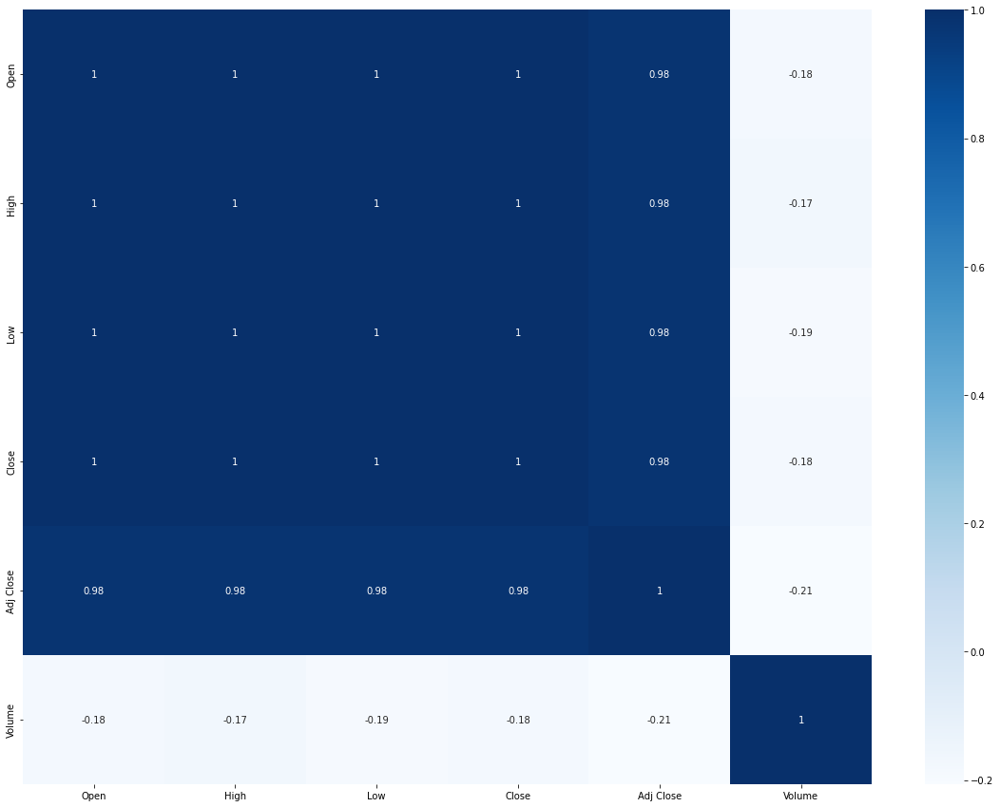

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.890788,0.336407,1,130,False,False


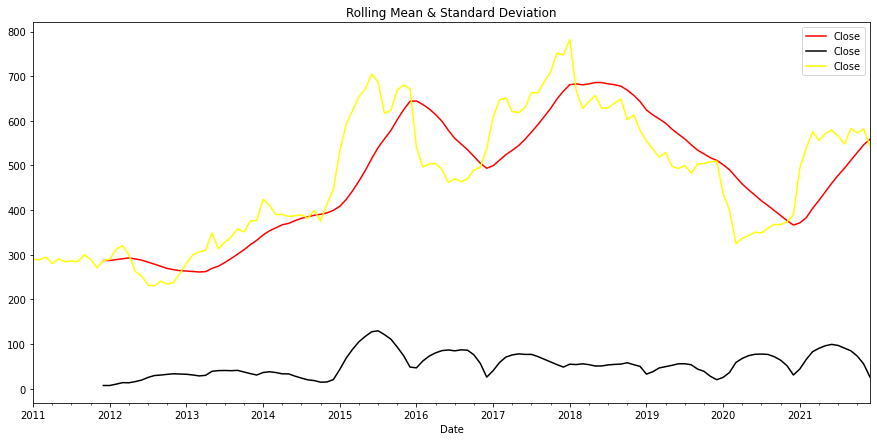

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

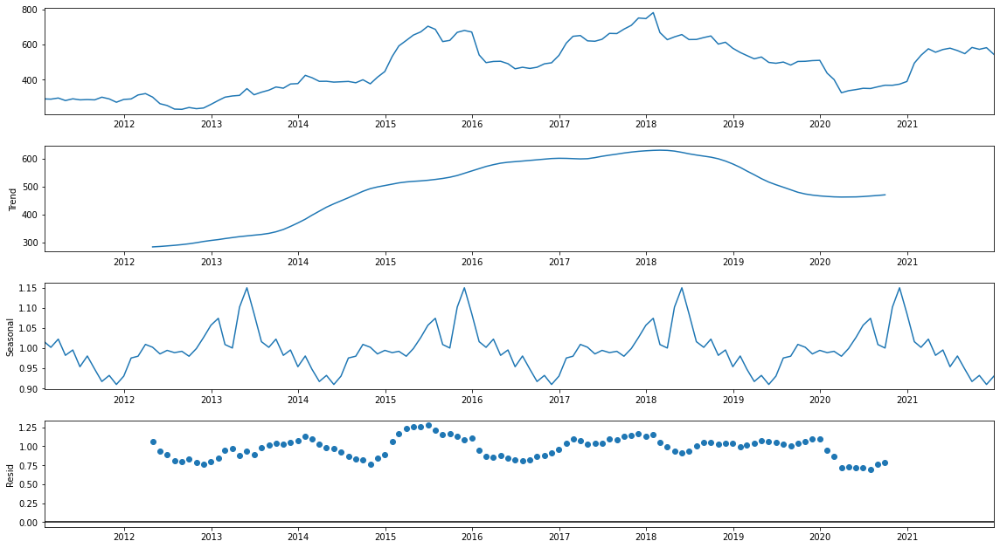

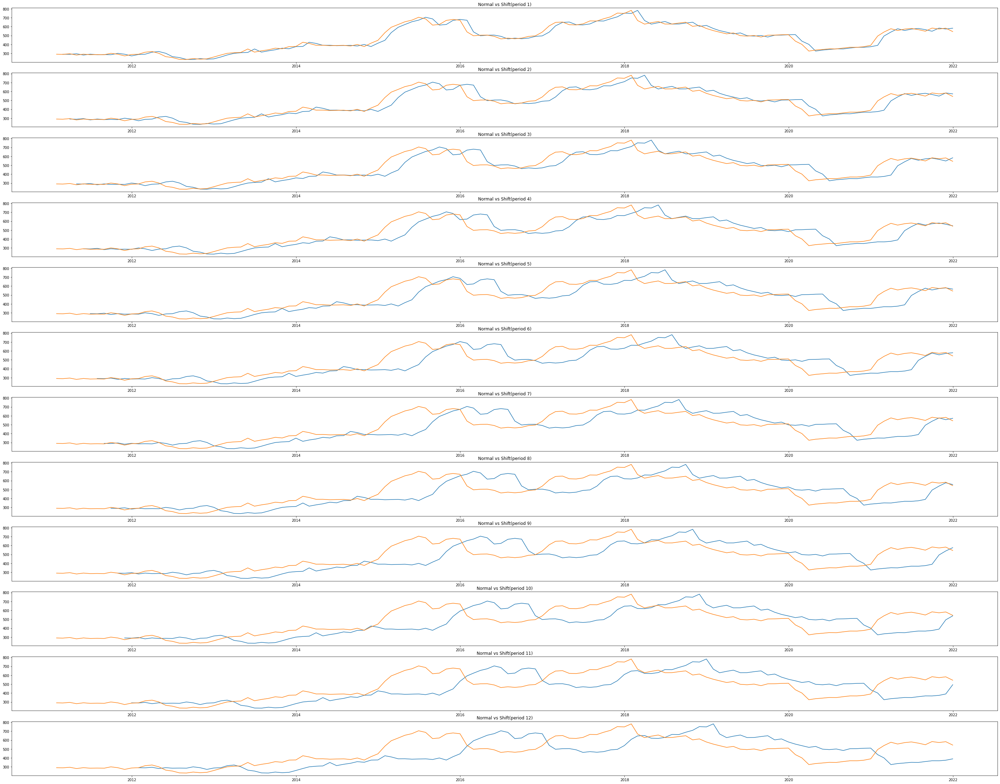

<Figure size 1080x504 with 0 Axes>

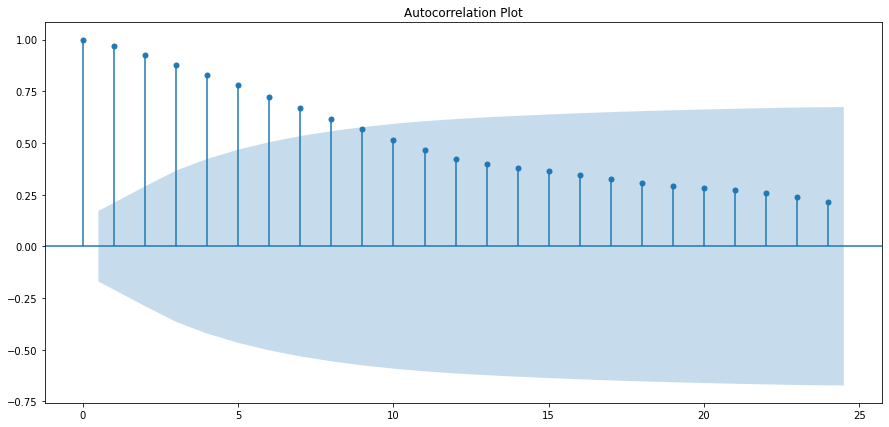

<Figure size 1080x504 with 0 Axes>

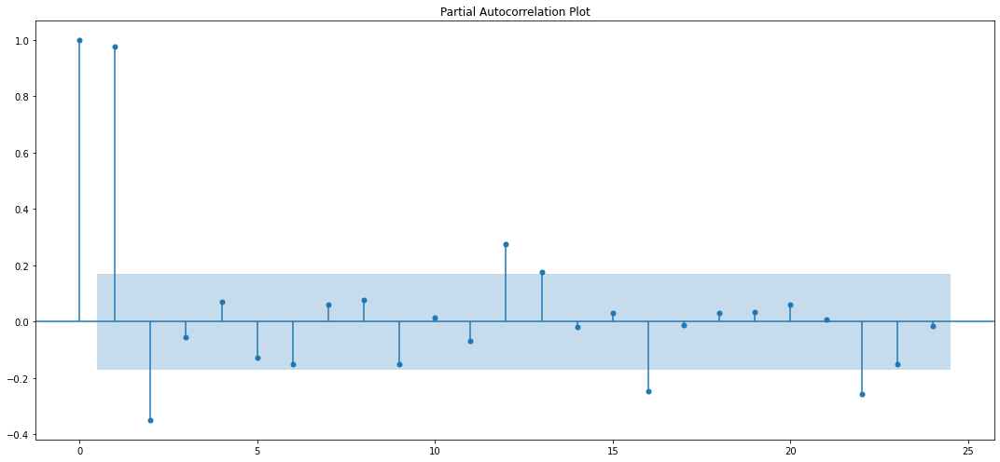

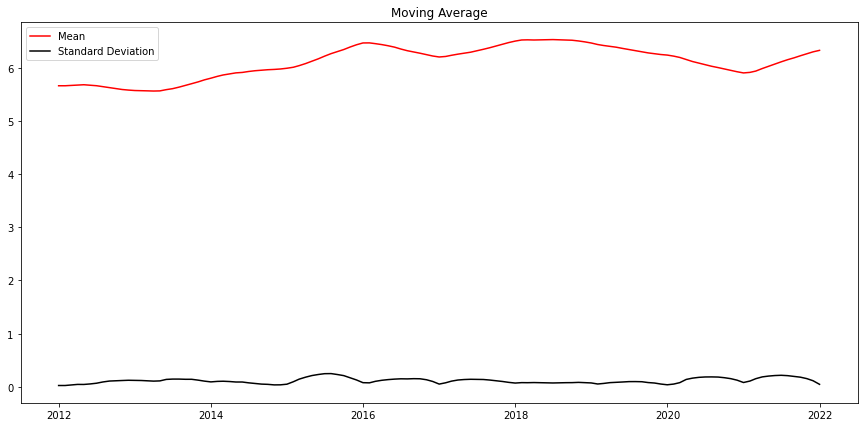

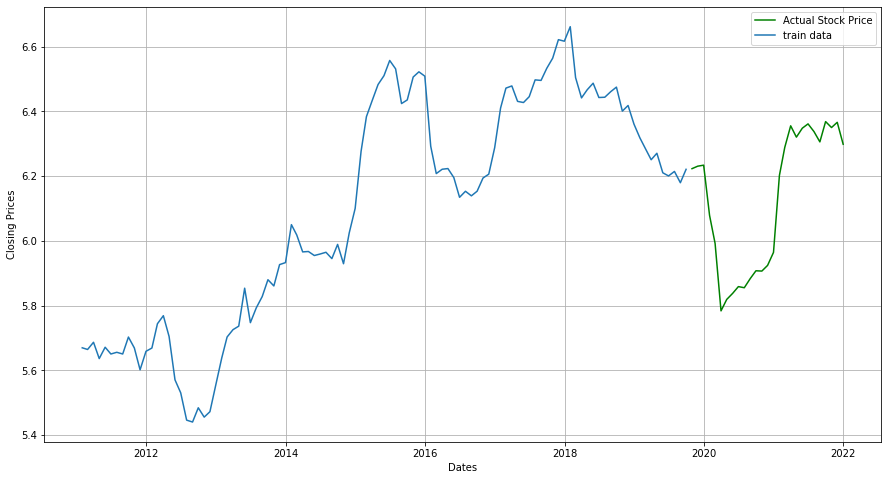

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1998.2255415844413
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1733.6579056116225
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1532.7738295859838
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1378.5722443843863
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1546.630742558516
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1522.6939368823223
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1389.2270572145853
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1379.2283509440606
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1818.83968035883
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1572.7229732475257
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1402.0908835673358
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1255.479065482121
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1424.201589049455
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1388.7833485108724
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1279

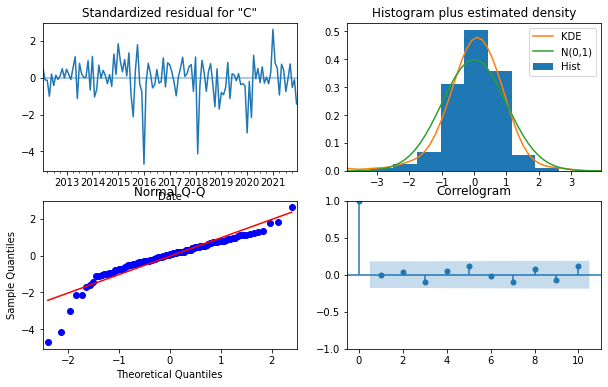

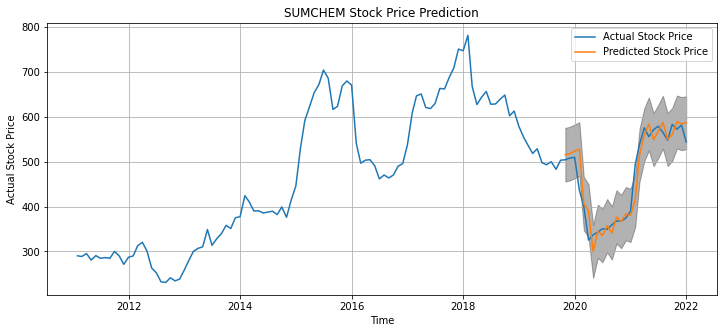

The Mean Squared Error is 1005.08
The root Mean Squared Error is 31.7


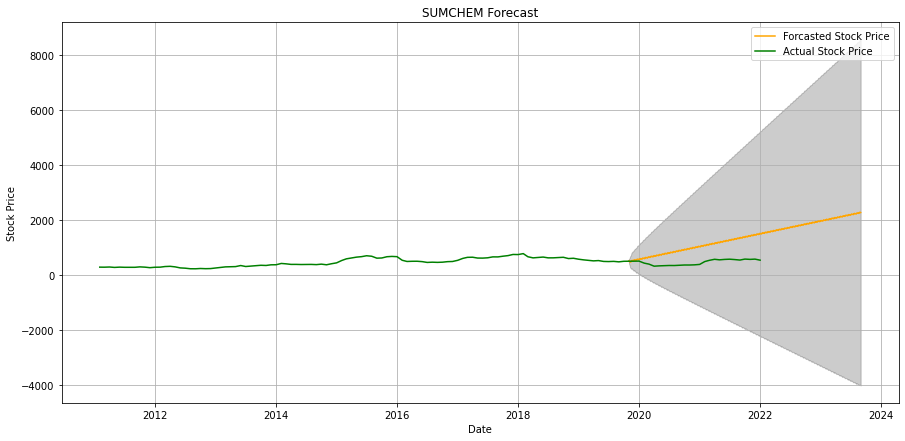

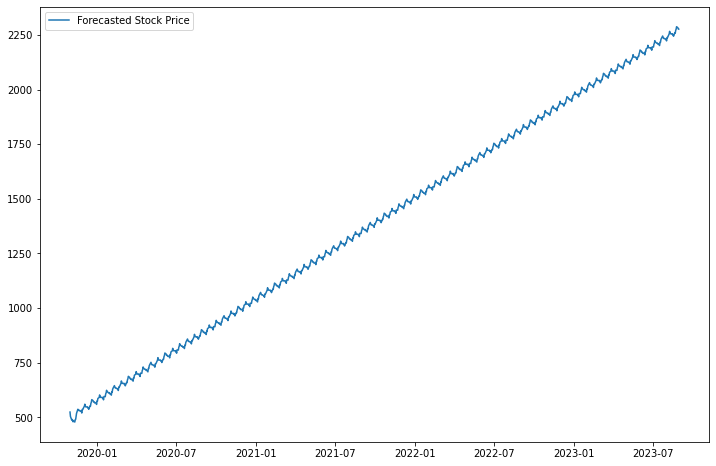

Epoch 1/50
2/2 [==============================] - 13s 212ms/step - loss: 0.2856
Epoch 2/50
2/2 [==============================] - 0s 187ms/step - loss: 0.1426
Epoch 3/50
2/2 [==============================] - 0s 181ms/step - loss: 0.0868
Epoch 4/50
2/2 [==============================] - 0s 184ms/step - loss: 0.0829
Epoch 5/50
2/2 [==============================] - 0s 183ms/step - loss: 0.0461
Epoch 6/50
2/2 [==============================] - 0s 177ms/step - loss: 0.0515
Epoch 7/50
2/2 [==============================] - 0s 216ms/step - loss: 0.0618
Epoch 8/50
2/2 [==============================] - 0s 173ms/step - loss: 0.0546
Epoch 9/50
2/2 [==============================] - 0s 198ms/step - loss: 0.0448
Epoch 10/50
2/2 [==============================] - 0s 173ms/step - loss: 0.0443
Epoch 11/50
2/2 [==============================] - 0s 210ms/step - loss: 0.0484
Epoch 12/50
2/2 [==============================] - 0s 184ms/step - loss: 0.0457
Epoch 13/50
2/2 [==============================]

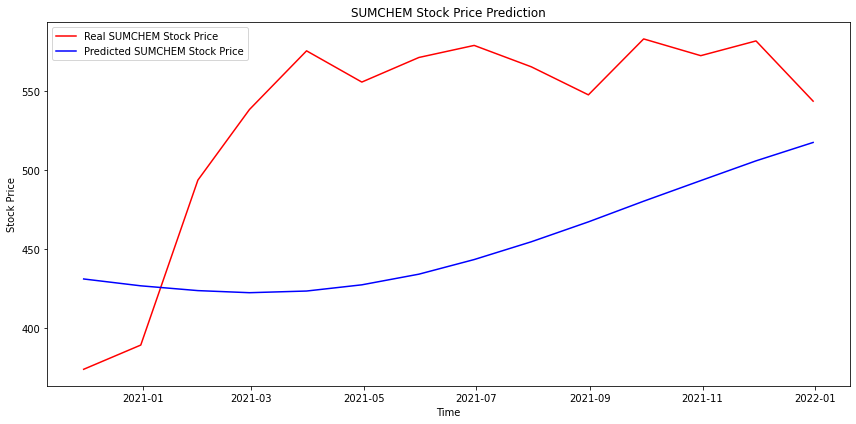

In [142]:
stock_market_prediction(NSE_data, symbol="SUMCHEM", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### BERGEPAINT

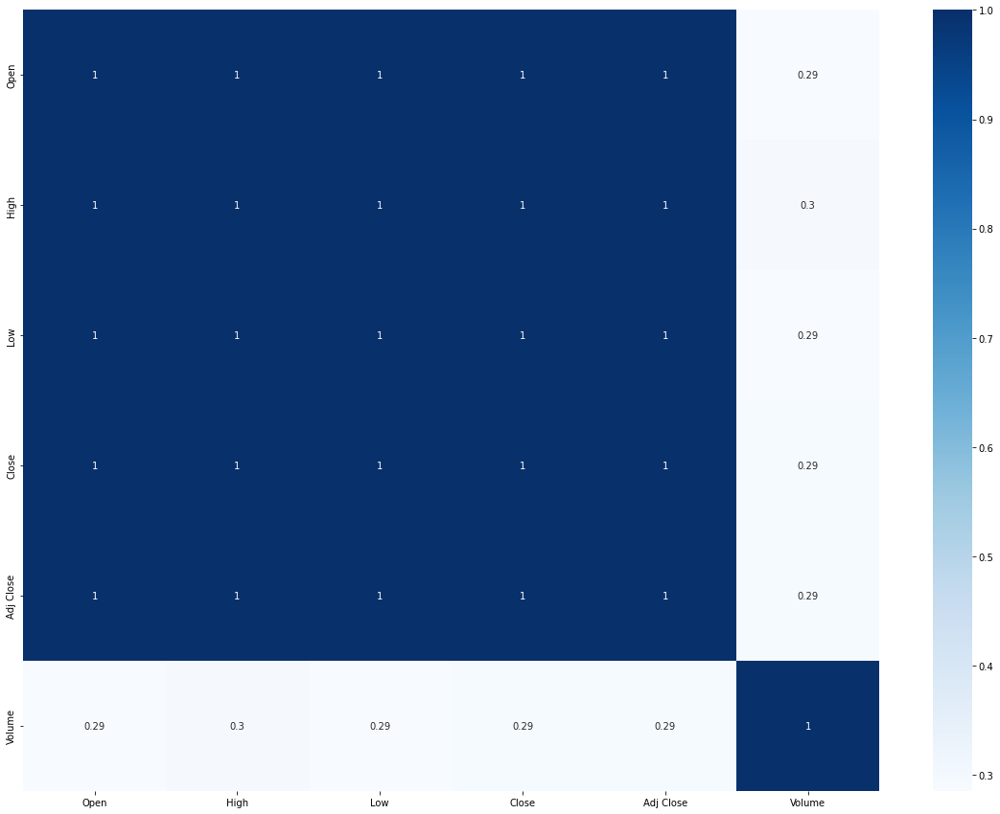

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.514558,0.997577,0,131,False,False


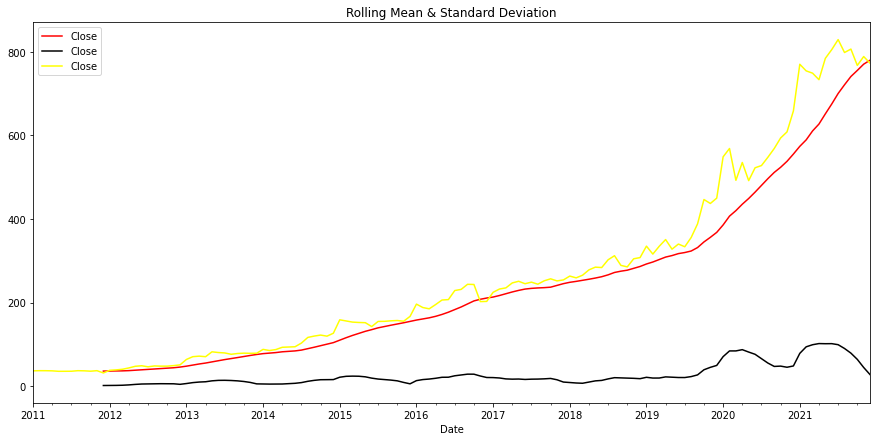

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

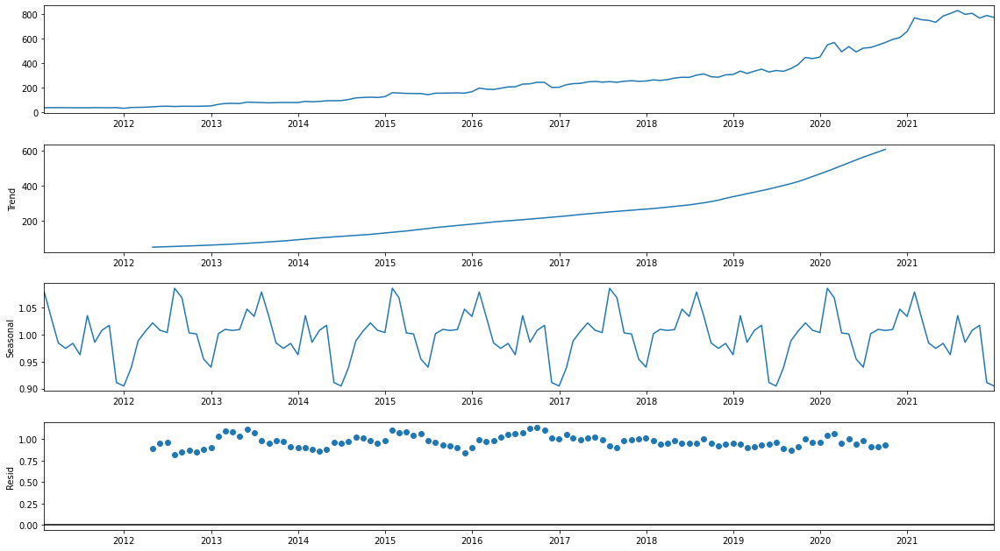

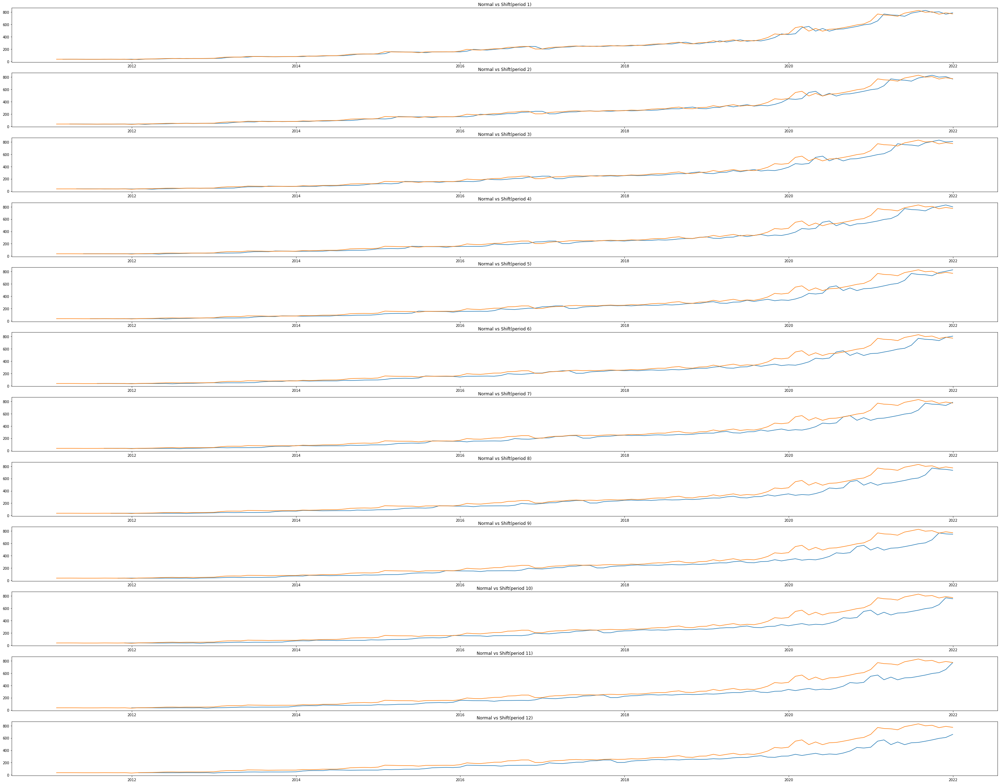

<Figure size 1080x504 with 0 Axes>

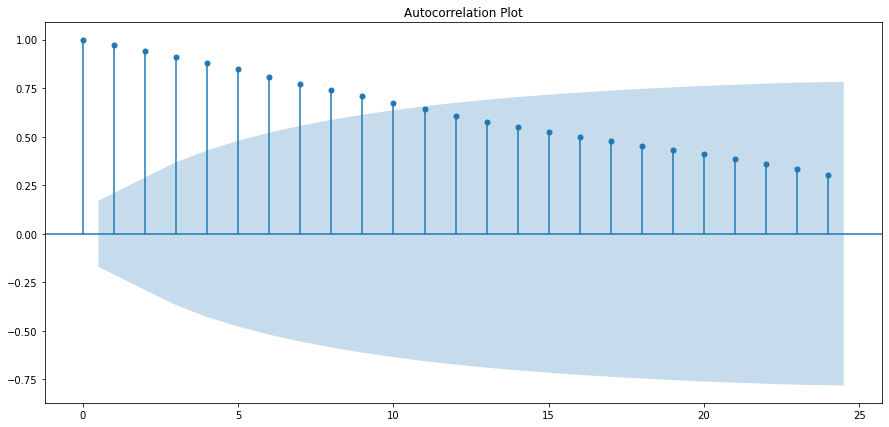

<Figure size 1080x504 with 0 Axes>

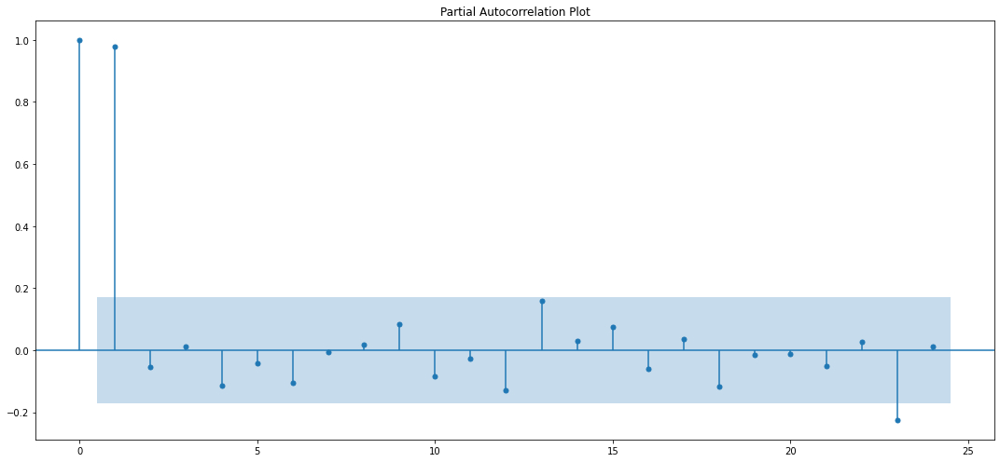

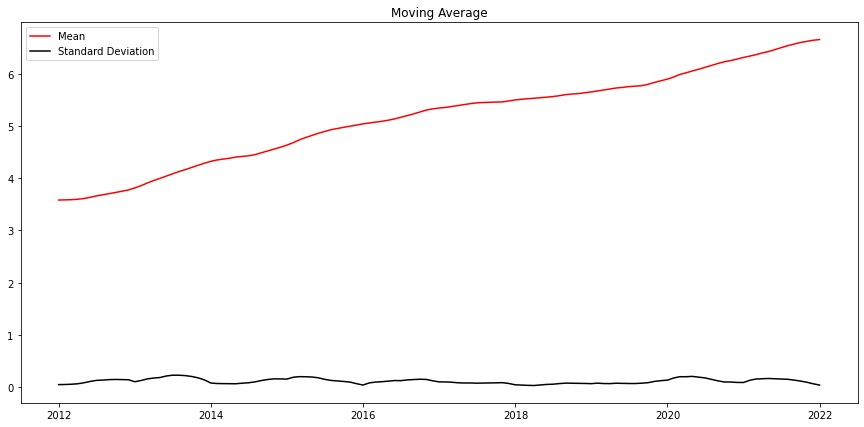

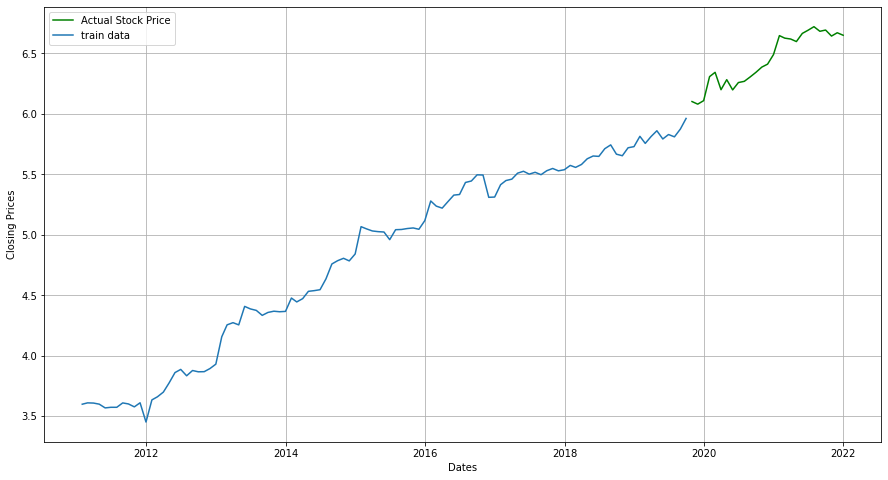

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1903.655668056835
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1745.2405115821616
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1447.0773673795559
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1237.787197037819
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1241.8174085498413
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1232.070066779413
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1170.0712849000906
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1146.4641303888434
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1722.3850696850648
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1480.0771006024918
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1321.999815597242
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1152.4480773757373
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1190.5839650959963
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1162.6124035475464
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 112

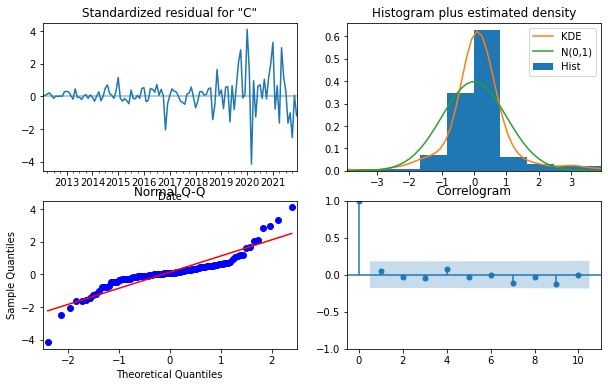

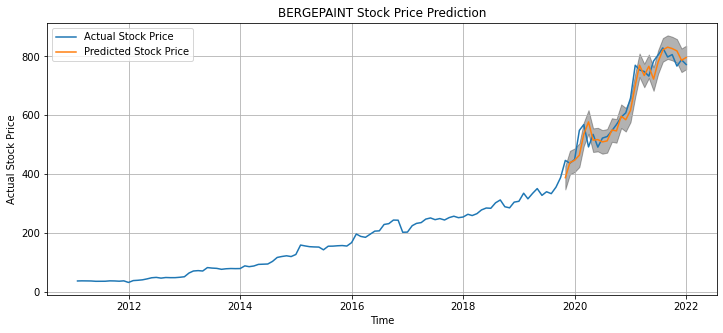

The Mean Squared Error is 1422.16
The root Mean Squared Error is 37.71


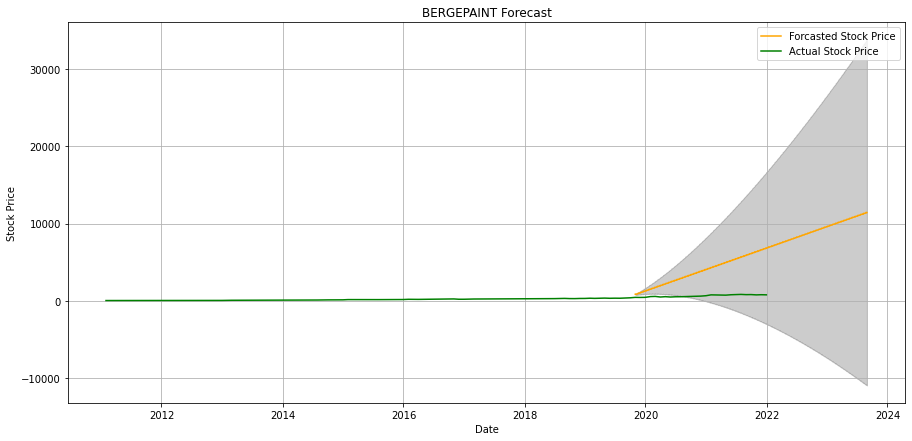

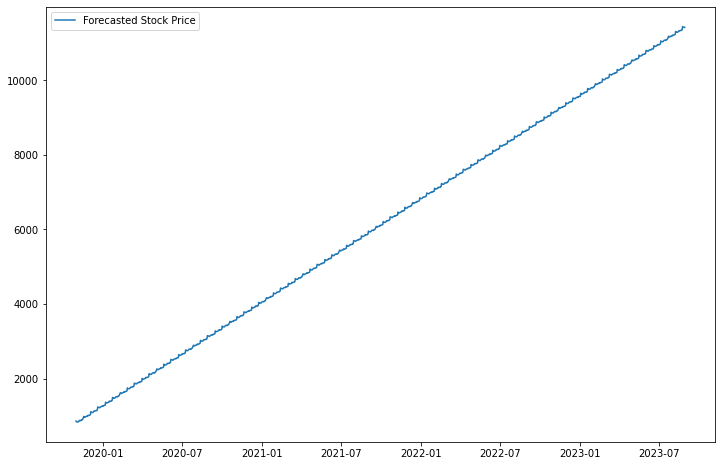

Epoch 1/50
2/2 [==============================] - 13s 247ms/step - loss: 0.2707
Epoch 2/50
2/2 [==============================] - 0s 222ms/step - loss: 0.1402
Epoch 3/50
2/2 [==============================] - 0s 224ms/step - loss: 0.0241
Epoch 4/50
2/2 [==============================] - 0s 228ms/step - loss: 0.0614
Epoch 5/50
2/2 [==============================] - 0s 215ms/step - loss: 0.0182
Epoch 6/50
2/2 [==============================] - 0s 228ms/step - loss: 0.0198
Epoch 7/50
2/2 [==============================] - 0s 229ms/step - loss: 0.0299
Epoch 8/50
2/2 [==============================] - 0s 211ms/step - loss: 0.0272
Epoch 9/50
2/2 [==============================] - 0s 218ms/step - loss: 0.0153
Epoch 10/50
2/2 [==============================] - 0s 219ms/step - loss: 0.0127
Epoch 11/50
2/2 [==============================] - 0s 220ms/step - loss: 0.0183
Epoch 12/50
2/2 [==============================] - 0s 225ms/step - loss: 0.0182
Epoch 13/50
2/2 [==============================]

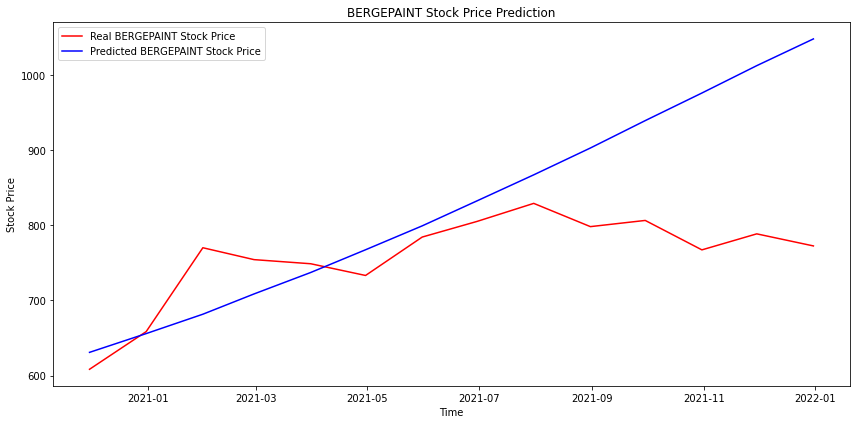

In [143]:
stock_market_prediction(NSE_data, symbol="BERGEPAINT", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### IGL

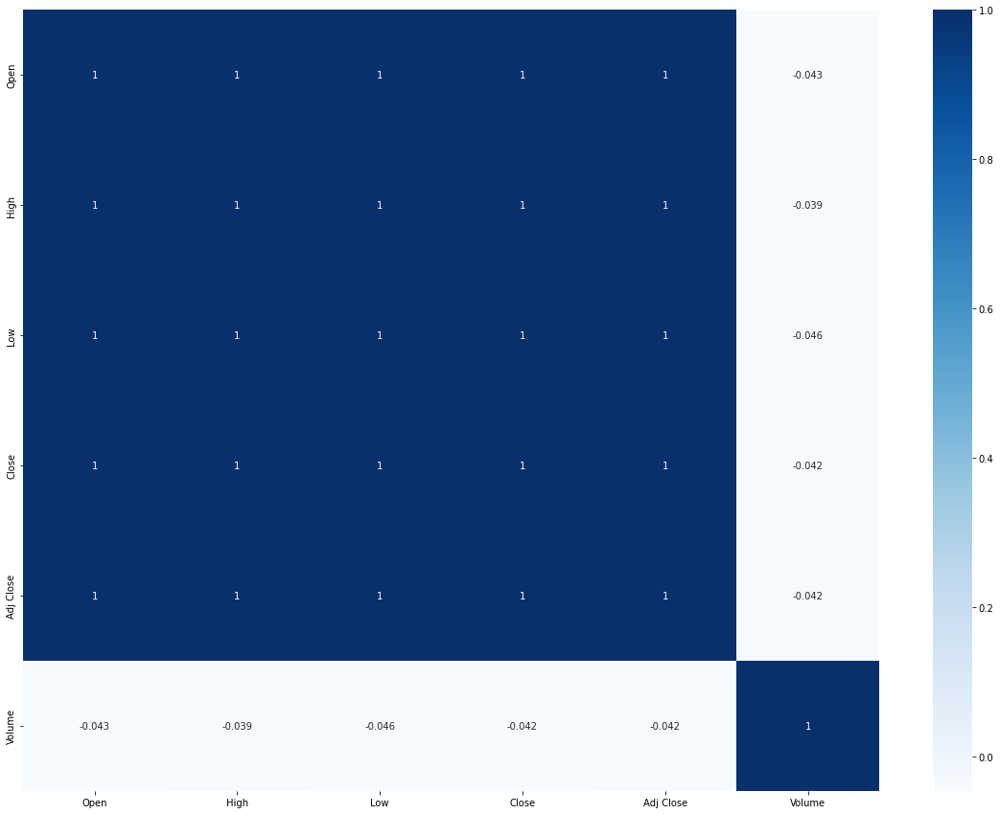

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.111462,0.995313,12,119,False,False


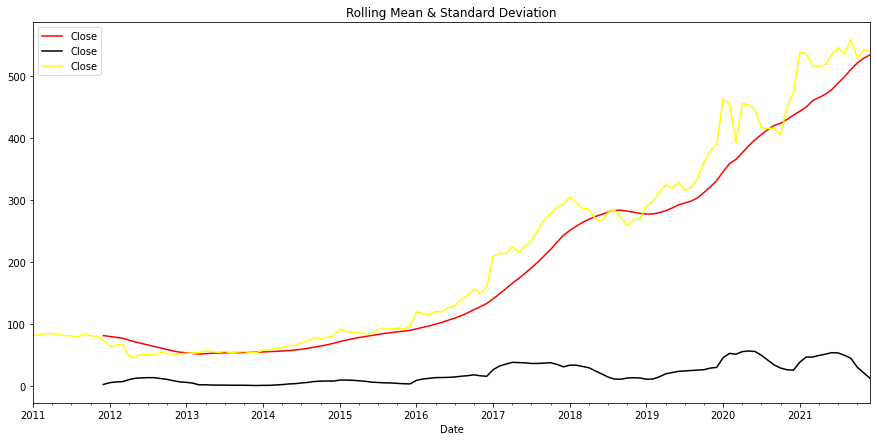

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

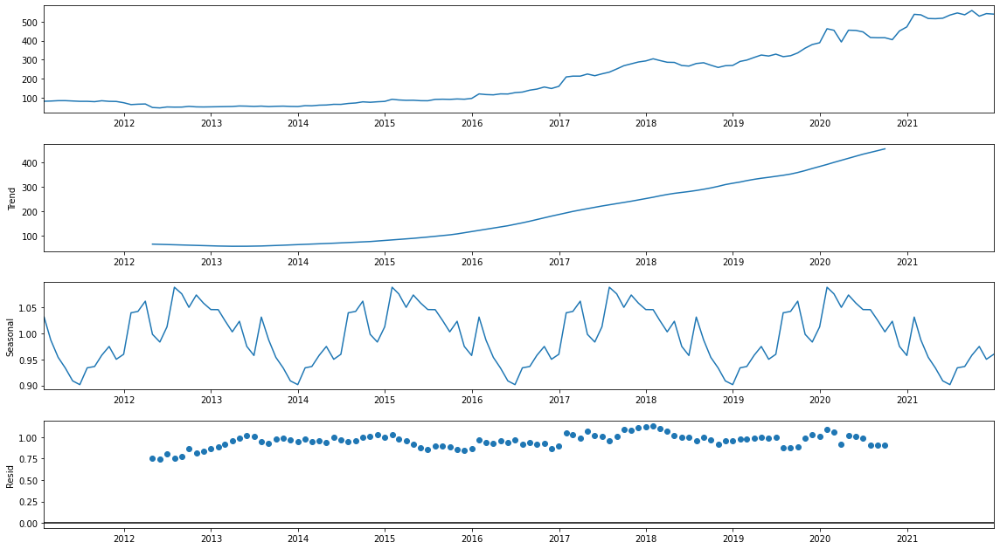

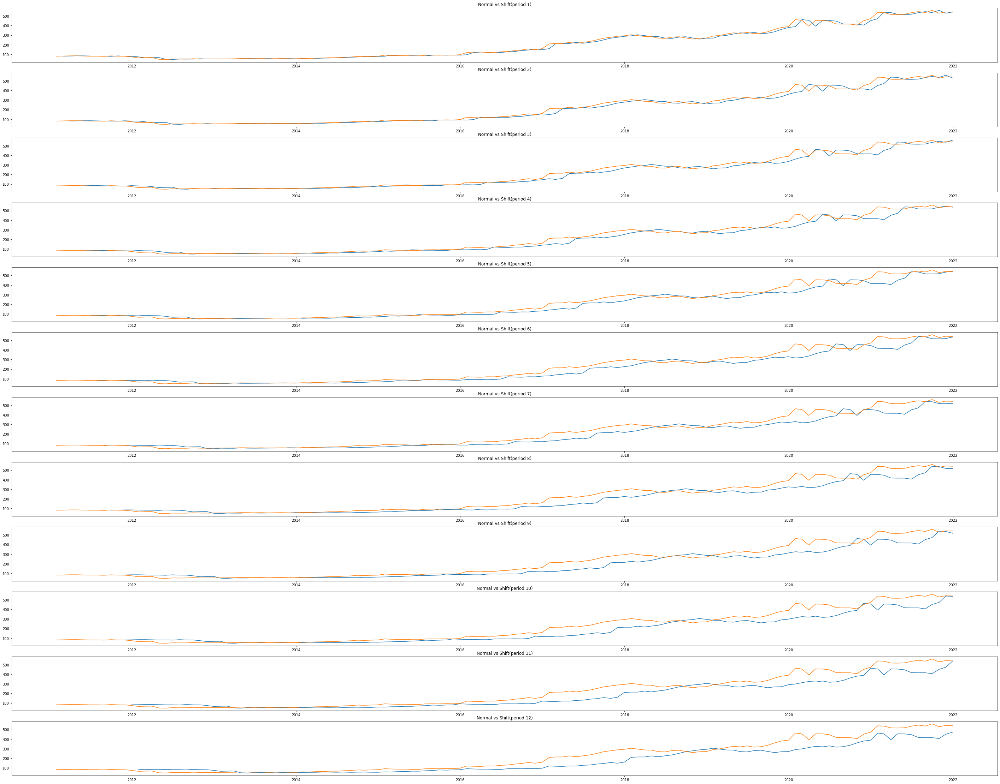

<Figure size 1080x504 with 0 Axes>

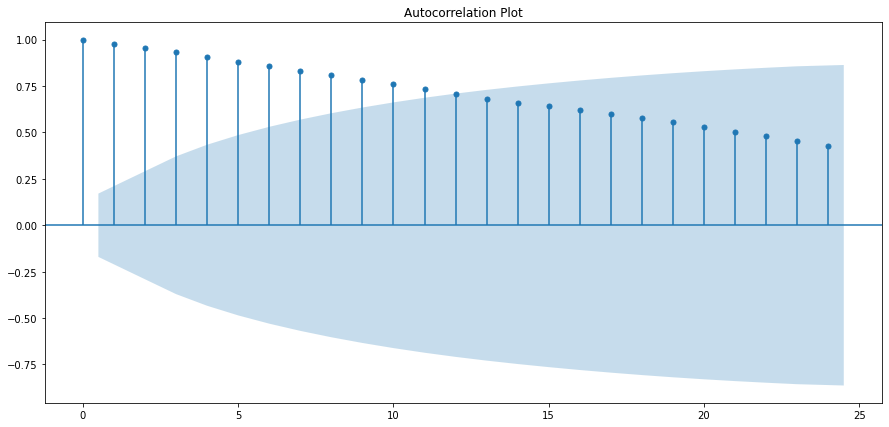

<Figure size 1080x504 with 0 Axes>

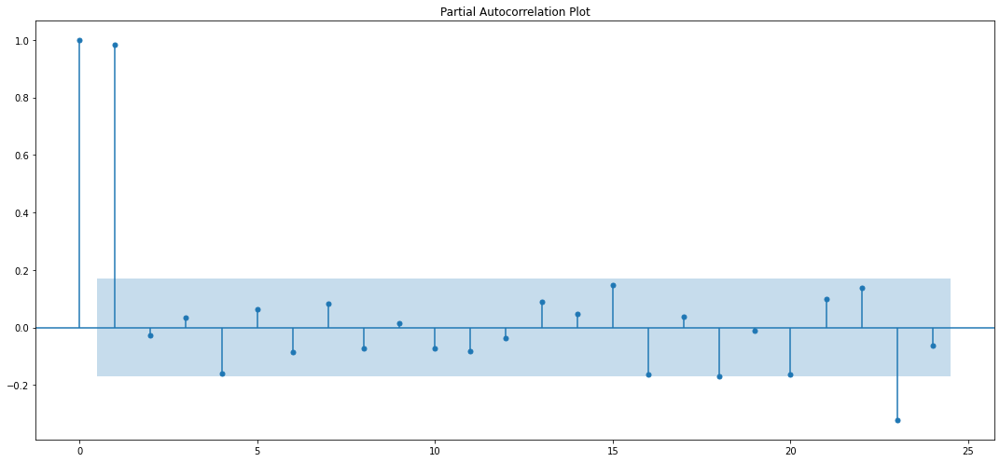

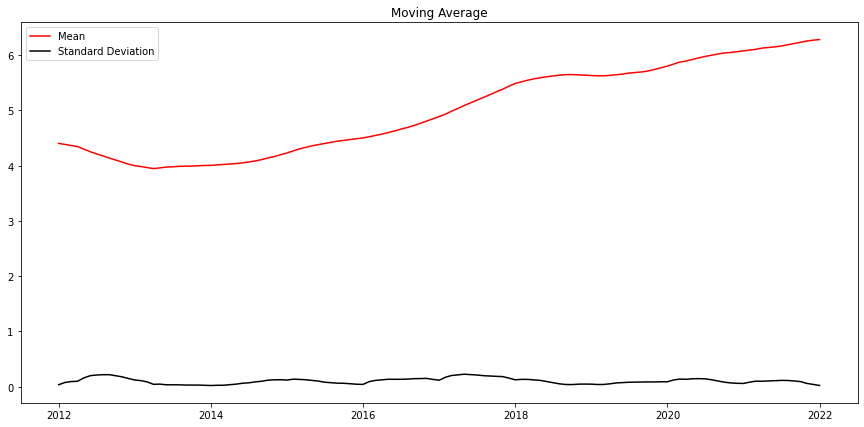

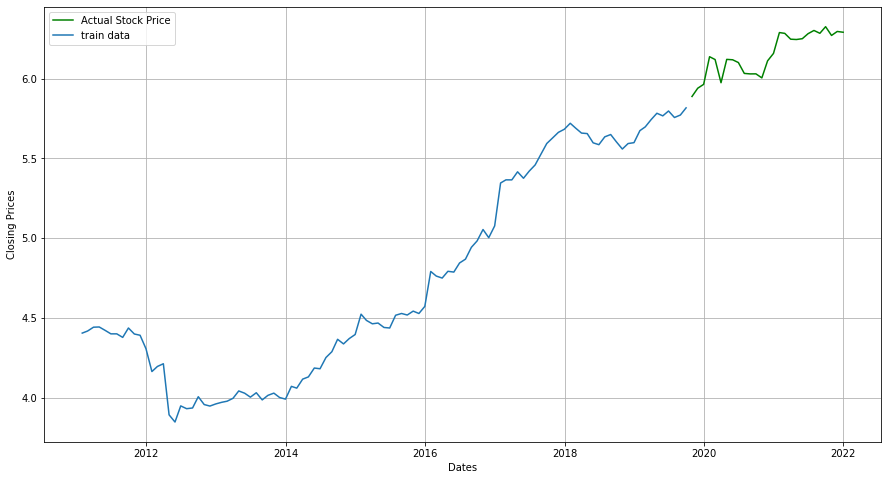

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1835.948065861699
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1573.24765092918
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1343.4304273386974
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1194.1936180686512
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1241.4185989788025
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1218.3636976517544
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1182.607086942581
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1147.221064663892
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1652.8273959981689
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1409.0732145025713
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1201.307091663972
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1077.403564780411
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1140.0057223815754
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1105.1805361854288
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1084.6

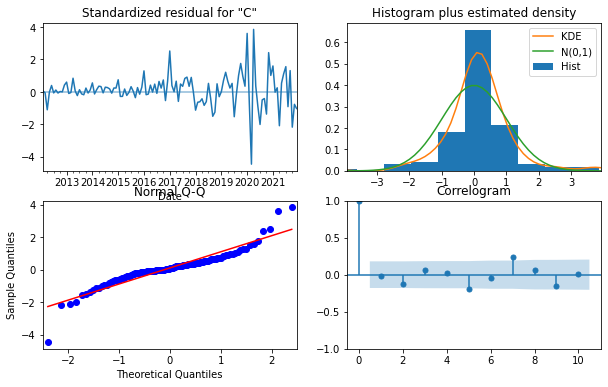

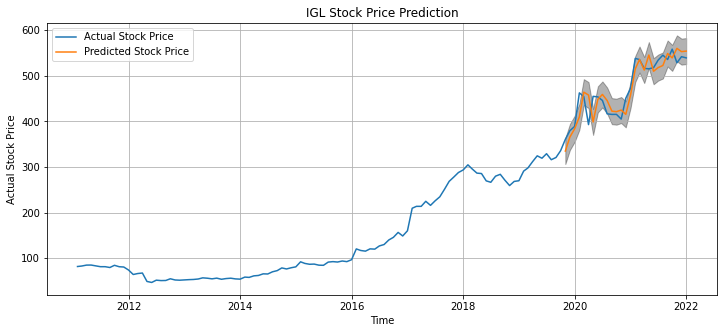

The Mean Squared Error is 677.37
The root Mean Squared Error is 26.03


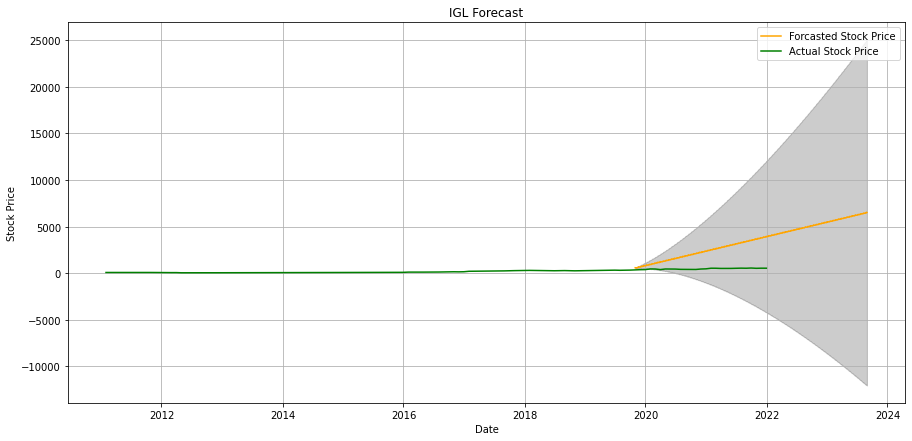

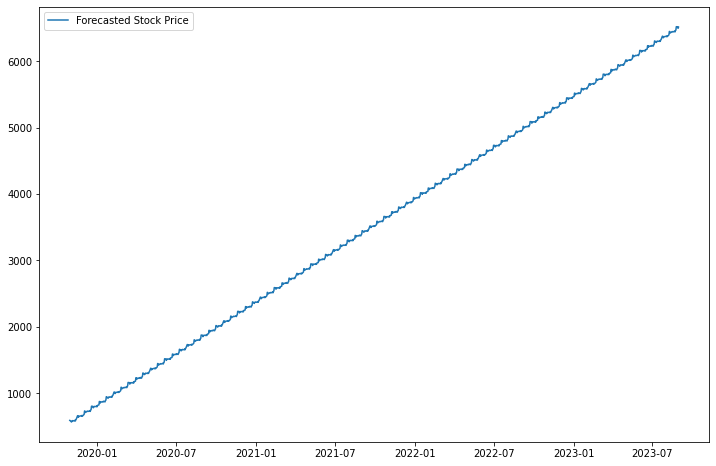

Epoch 1/50
2/2 [==============================] - 13s 263ms/step - loss: 0.3520
Epoch 2/50
2/2 [==============================] - 0s 231ms/step - loss: 0.2417
Epoch 3/50
2/2 [==============================] - 0s 229ms/step - loss: 0.1102
Epoch 4/50
2/2 [==============================] - 0s 225ms/step - loss: 0.0271
Epoch 5/50
2/2 [==============================] - 0s 226ms/step - loss: 0.0602
Epoch 6/50
2/2 [==============================] - 0s 146ms/step - loss: 0.0170
Epoch 7/50
2/2 [==============================] - 0s 144ms/step - loss: 0.0184
Epoch 8/50
2/2 [==============================] - 0s 231ms/step - loss: 0.0319
Epoch 9/50
2/2 [==============================] - 1s 288ms/step - loss: 0.0289
Epoch 10/50
2/2 [==============================] - 0s 171ms/step - loss: 0.0178
Epoch 11/50
2/2 [==============================] - 0s 247ms/step - loss: 0.0119
Epoch 12/50
2/2 [==============================] - 0s 222ms/step - loss: 0.0166
Epoch 13/50
2/2 [==============================]

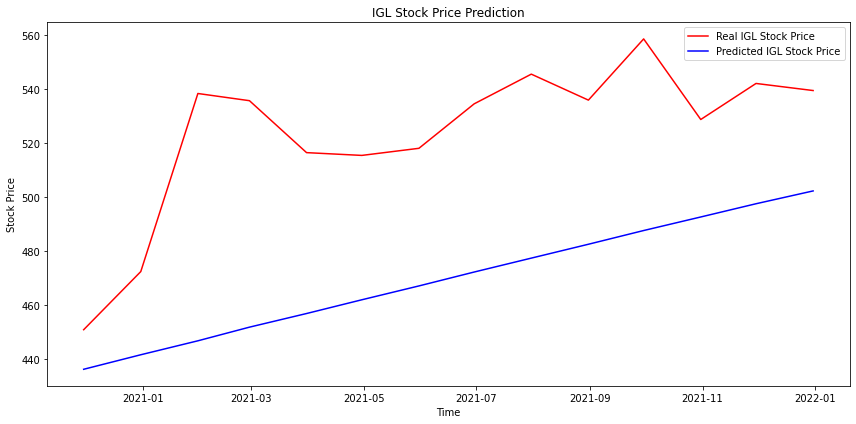

In [144]:
stock_market_prediction(NSE_data, symbol="IGL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### KANSAINER


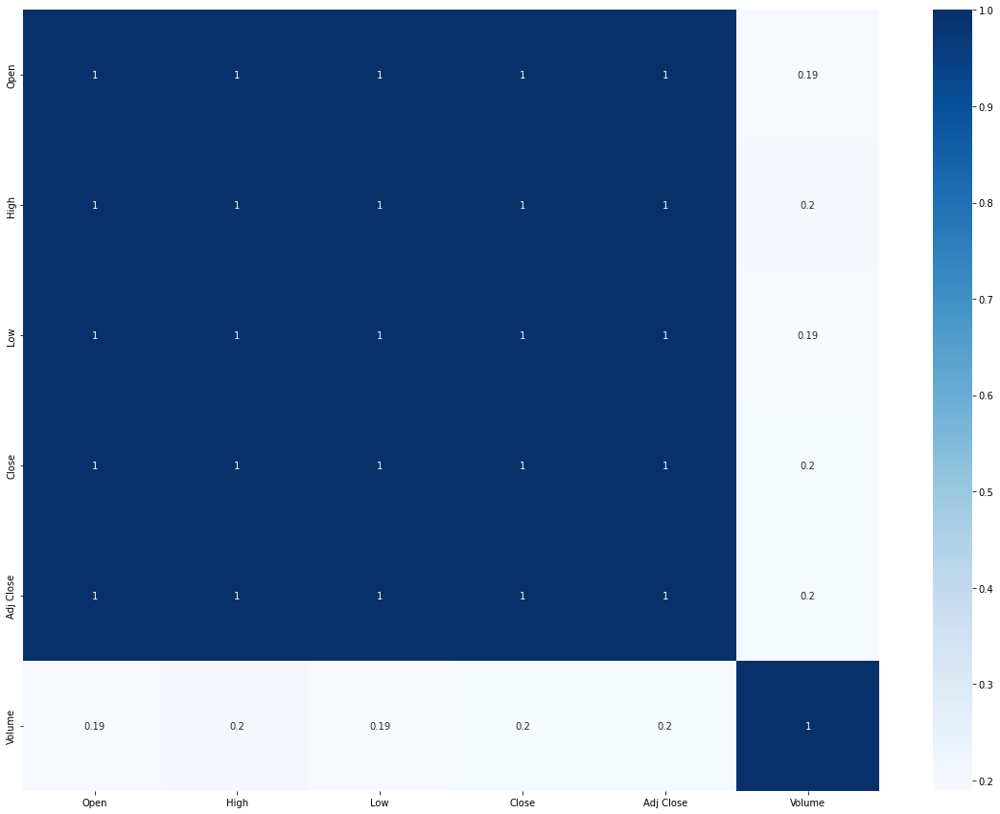

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.228266,0.935067,0,131,False,False


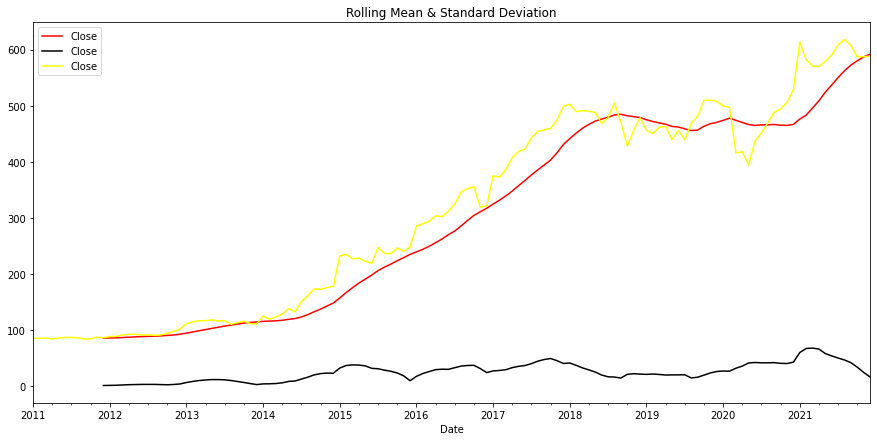

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

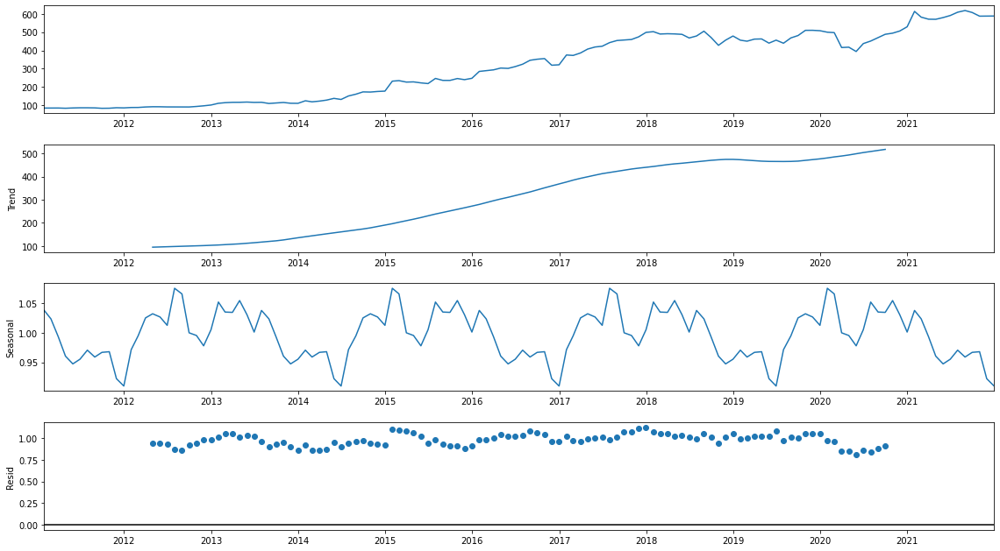

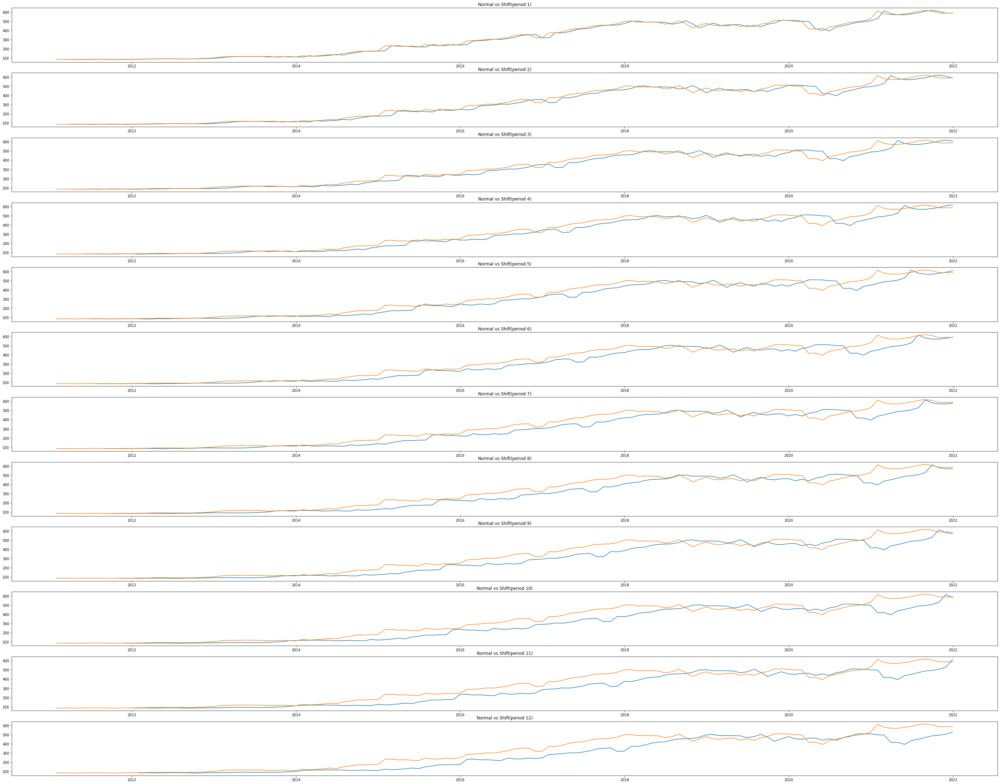

<Figure size 1080x504 with 0 Axes>

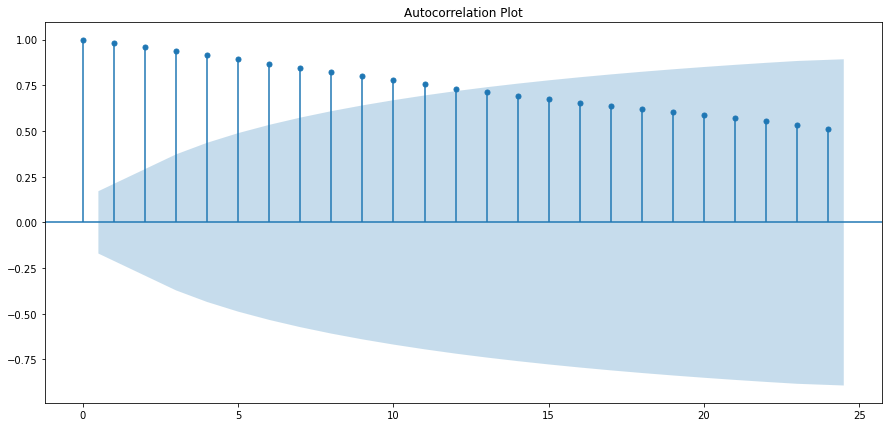

<Figure size 1080x504 with 0 Axes>

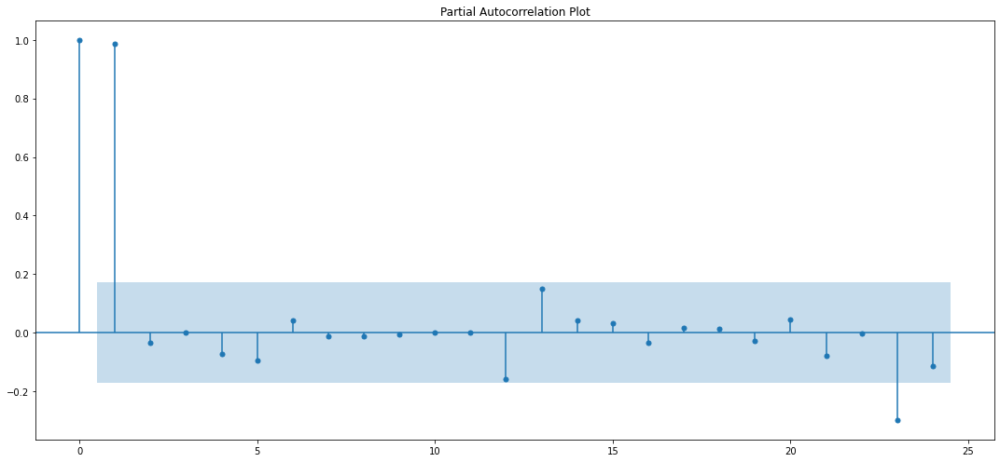

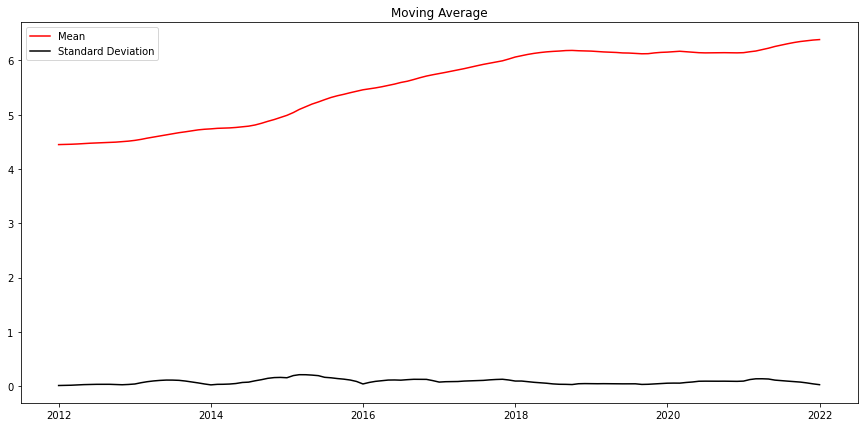

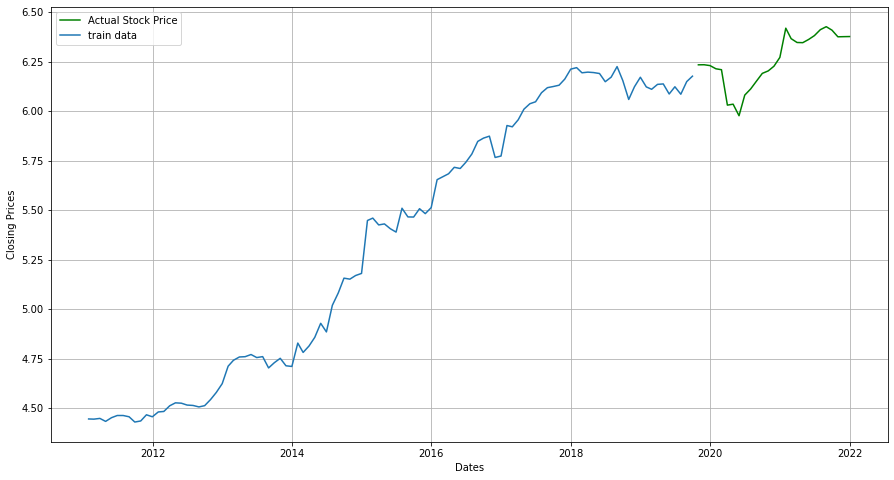

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1915.9418744888799
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1639.5424298546554
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1366.8615179717237
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1224.960836963971
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1327.853118106134
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1317.34683091801
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1228.9456893946065
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1205.1960574062869
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1735.9128560981994
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1478.870413720191
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1247.3338679669664
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1124.2771315514367
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1231.0680836607708
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1214.3010164134857
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1141

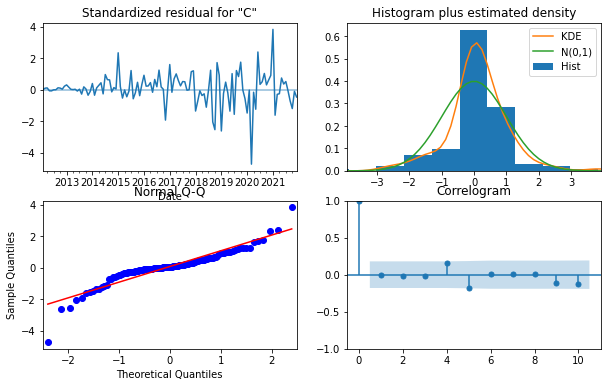

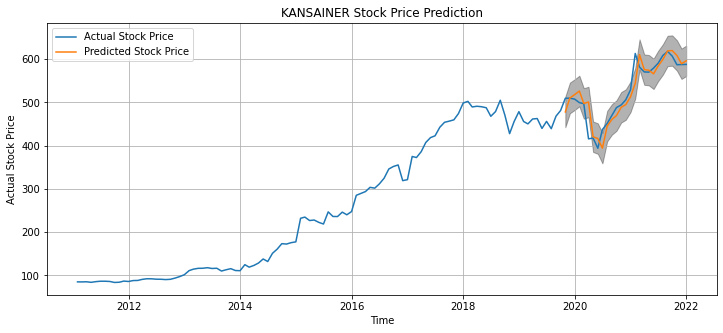

The Mean Squared Error is 702.21
The root Mean Squared Error is 26.5


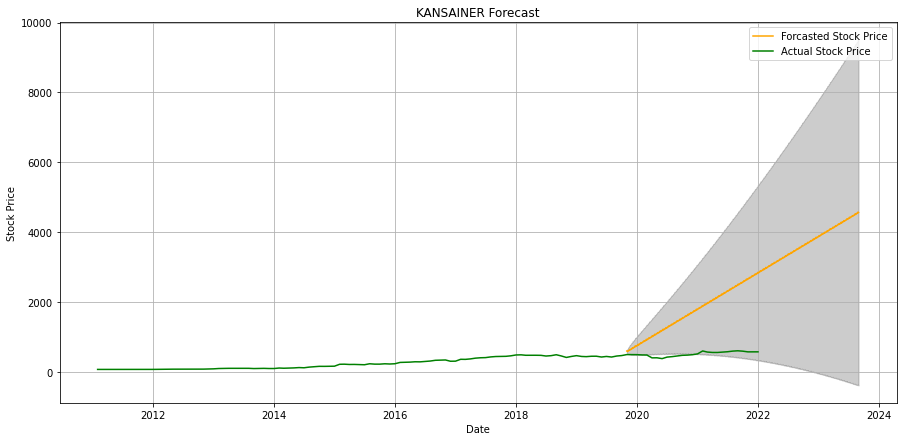

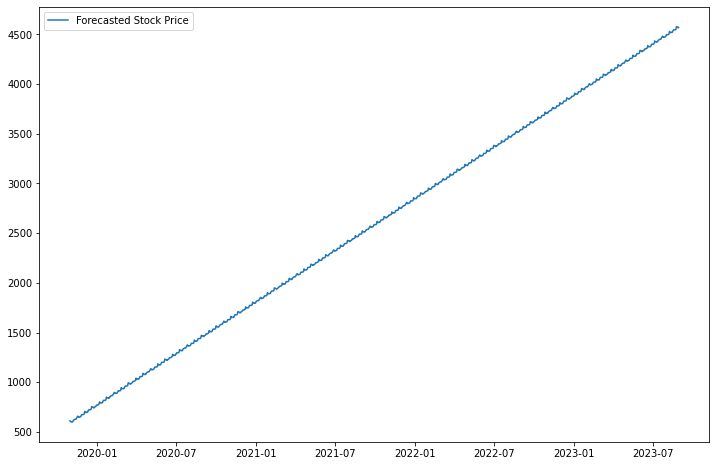

Epoch 1/50
2/2 [==============================] - 13s 241ms/step - loss: 0.6477
Epoch 2/50
2/2 [==============================] - 0s 208ms/step - loss: 0.3855
Epoch 3/50
2/2 [==============================] - 0s 207ms/step - loss: 0.1273
Epoch 4/50
2/2 [==============================] - 0s 214ms/step - loss: 0.0702
Epoch 5/50
2/2 [==============================] - 0s 204ms/step - loss: 0.0914
Epoch 6/50
2/2 [==============================] - 0s 210ms/step - loss: 0.0175
Epoch 7/50
2/2 [==============================] - 0s 220ms/step - loss: 0.0258
Epoch 8/50
2/2 [==============================] - 0s 205ms/step - loss: 0.0454
Epoch 9/50
2/2 [==============================] - 0s 203ms/step - loss: 0.0387
Epoch 10/50
2/2 [==============================] - 0s 204ms/step - loss: 0.0180
Epoch 11/50
2/2 [==============================] - 0s 211ms/step - loss: 0.0099
Epoch 12/50
2/2 [==============================] - 0s 208ms/step - loss: 0.0156
Epoch 13/50
2/2 [==============================]

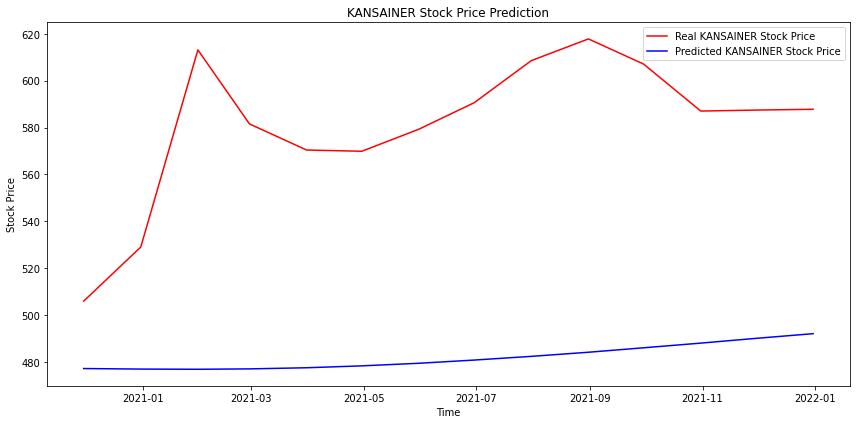

In [145]:
stock_market_prediction(NSE_data, symbol="KANSAINER", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### RELAXO

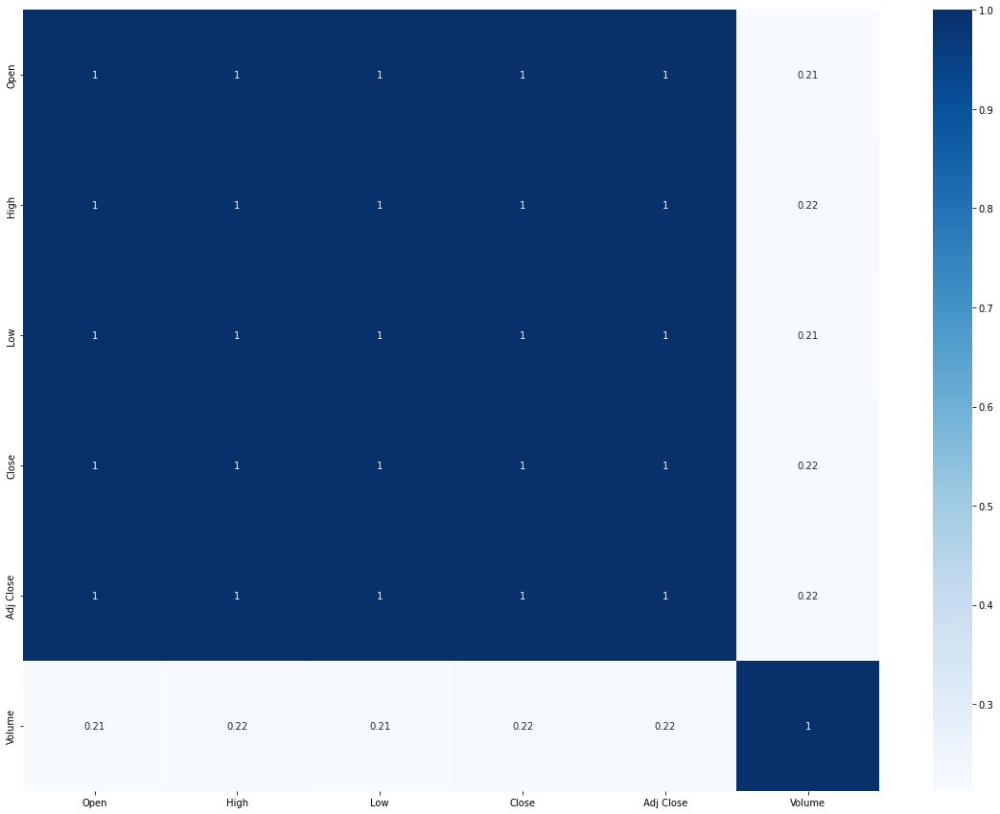

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.990985,0.998661,12,119,False,False


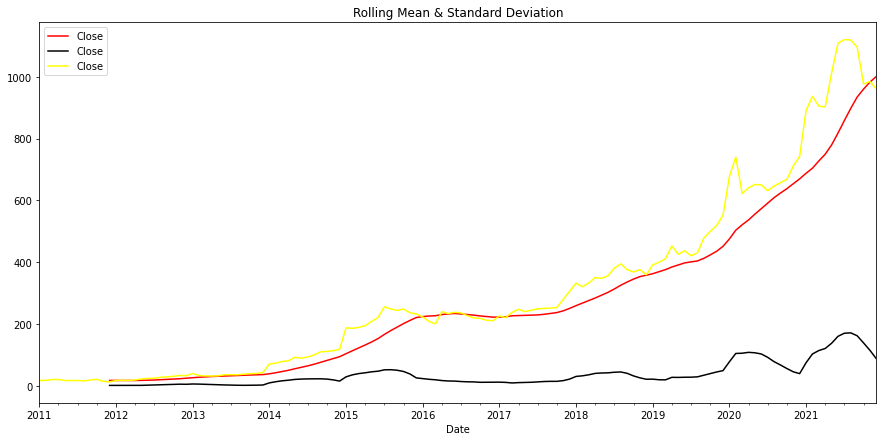

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

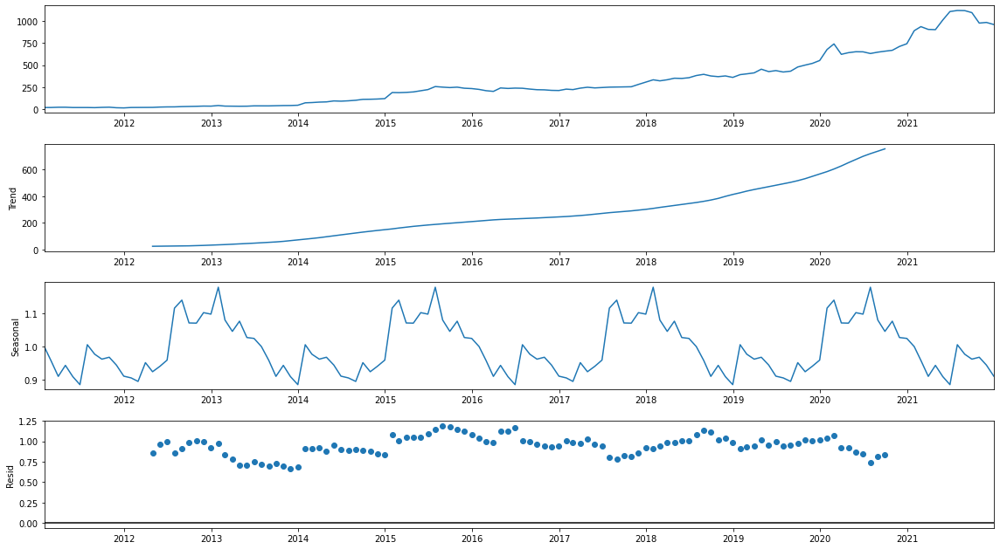

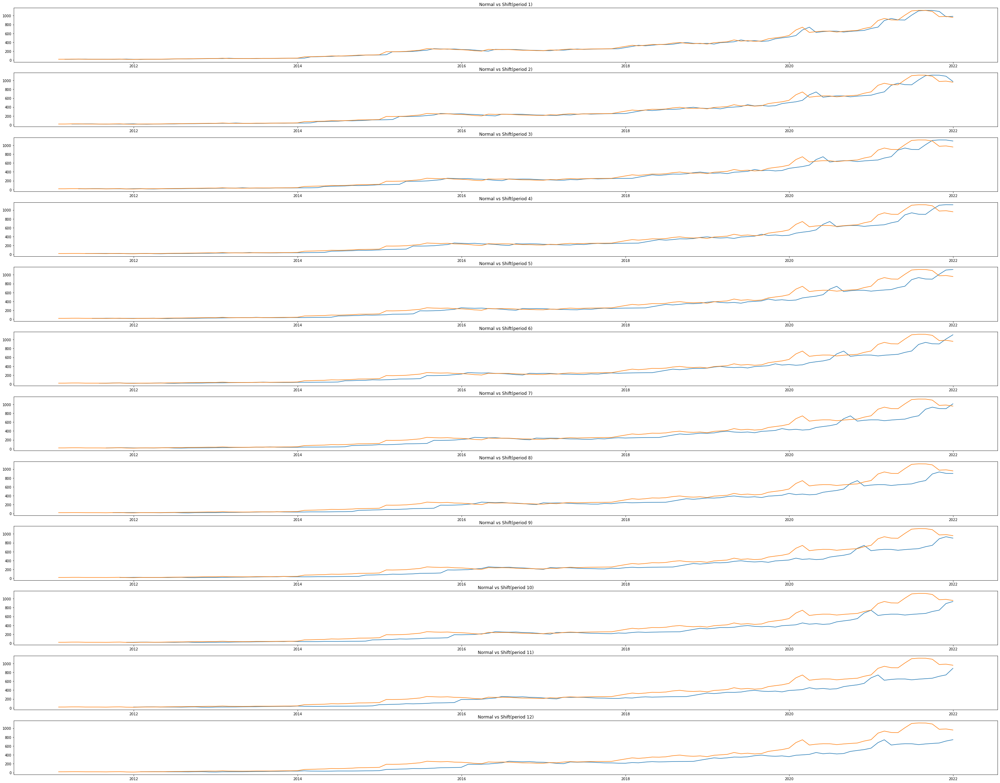

<Figure size 1080x504 with 0 Axes>

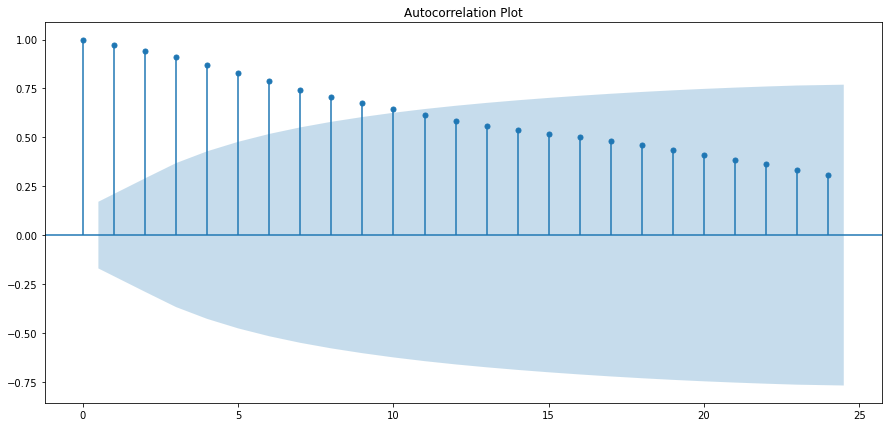

<Figure size 1080x504 with 0 Axes>

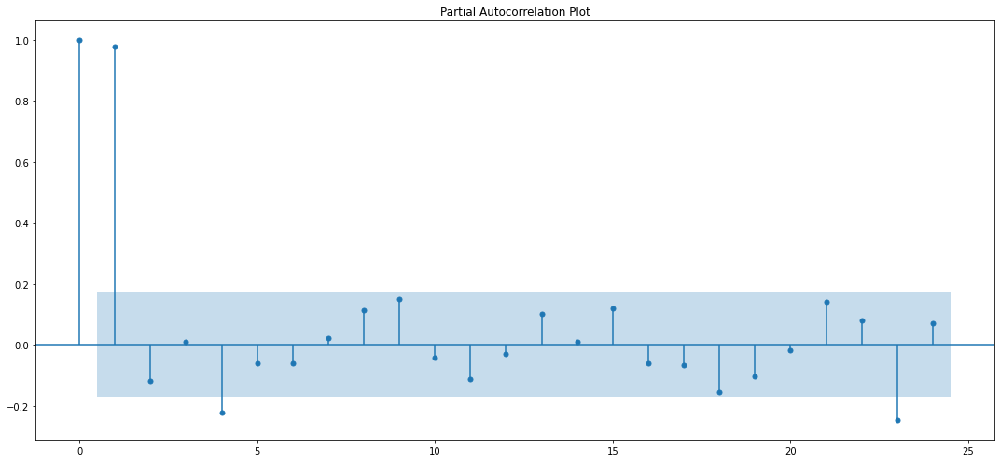

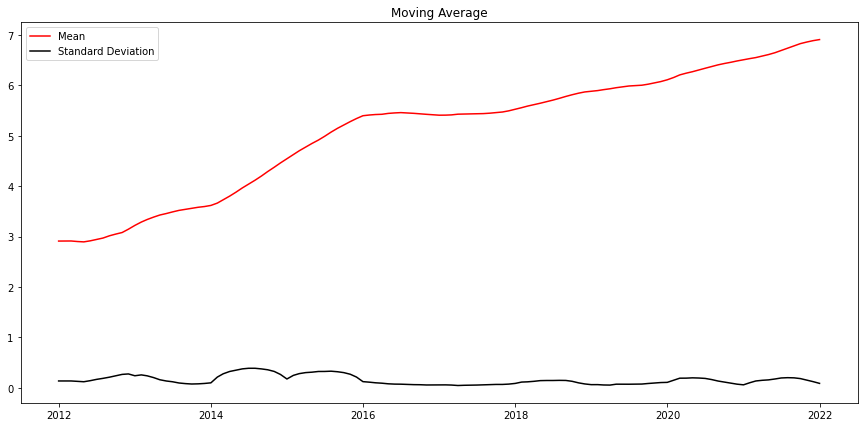

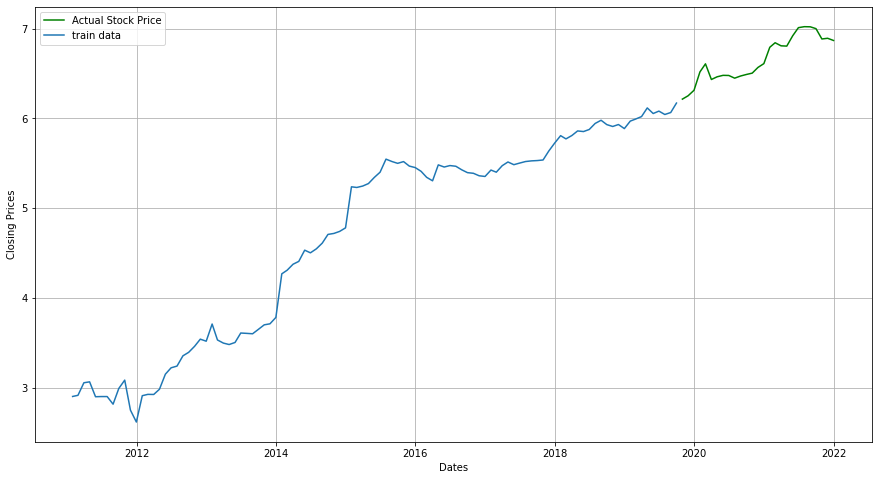

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1959.1921711170862
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1695.8580558004273
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1527.5934711981886
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1333.986533045473
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1368.3808724201178
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1348.7058140480804
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1302.7321081379848
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1260.0721773658063
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1776.52907841169
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1532.9279994404378
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1377.521927468173
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1220.804568813922
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1273.4870110005534
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1238.8224066090963
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1214

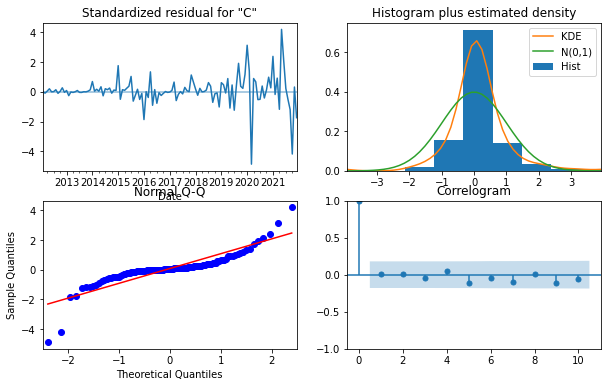

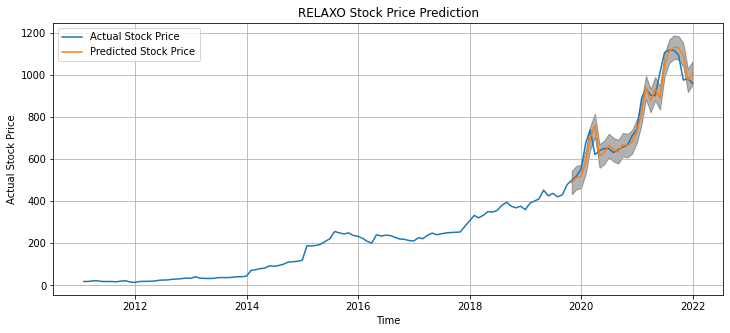

The Mean Squared Error is 2815.12
The root Mean Squared Error is 53.06


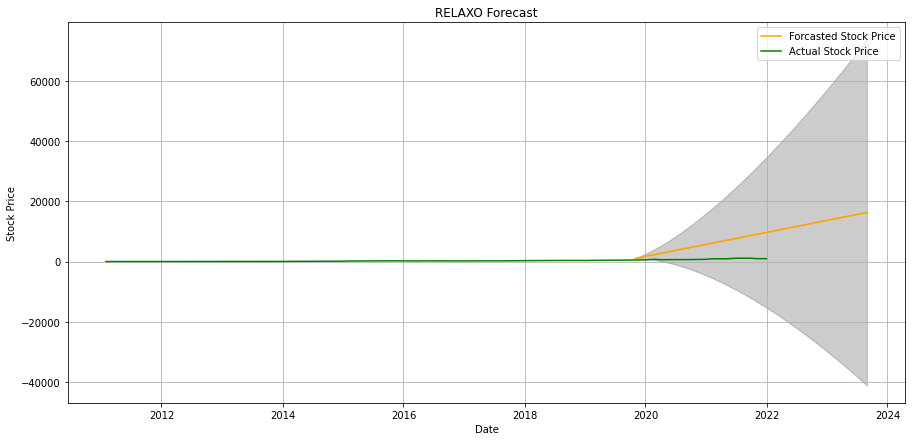

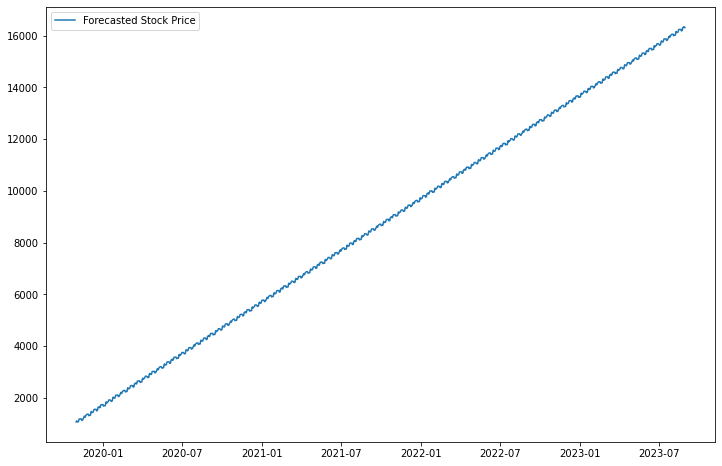

Epoch 1/50
2/2 [==============================] - 12s 190ms/step - loss: 0.2990
Epoch 2/50
2/2 [==============================] - 0s 139ms/step - loss: 0.2097
Epoch 3/50
2/2 [==============================] - 0s 150ms/step - loss: 0.1000
Epoch 4/50
2/2 [==============================] - 0s 207ms/step - loss: 0.0310
Epoch 5/50
2/2 [==============================] - 0s 154ms/step - loss: 0.0600
Epoch 6/50
2/2 [==============================] - 0s 149ms/step - loss: 0.0200
Epoch 7/50
2/2 [==============================] - 0s 148ms/step - loss: 0.0246
Epoch 8/50
2/2 [==============================] - 0s 137ms/step - loss: 0.0360
Epoch 9/50
2/2 [==============================] - 0s 180ms/step - loss: 0.0329
Epoch 10/50
2/2 [==============================] - 0s 167ms/step - loss: 0.0214
Epoch 11/50
2/2 [==============================] - 0s 163ms/step - loss: 0.0141
Epoch 12/50
2/2 [==============================] - 0s 155ms/step - loss: 0.0226
Epoch 13/50
2/2 [==============================]

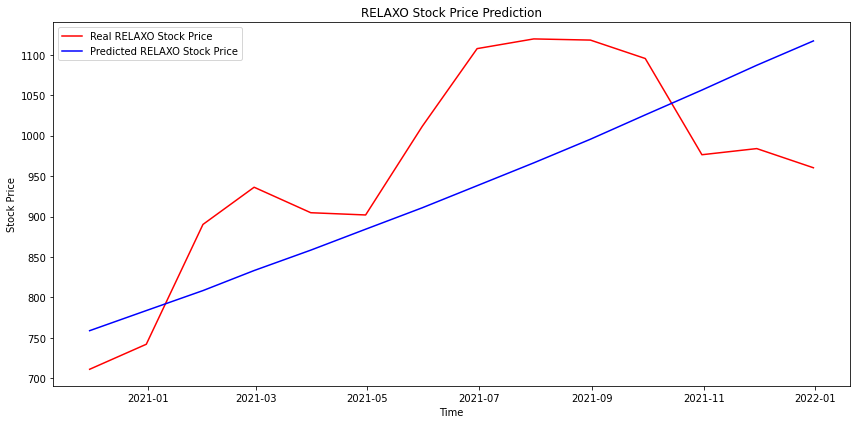

In [146]:
stock_market_prediction(NSE_data, symbol="RELAXO", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### CDSL

In [206]:
#stock_market_prediction(NSE_data, symbol="CDSL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### HDFCLIFE

In [205]:
# stock_market_prediction(NSE_data, symbol="HDFCLIFE", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### IEX

In [170]:
# stock_market_prediction(NSE_data, symbol="IEX", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### SIEMENS

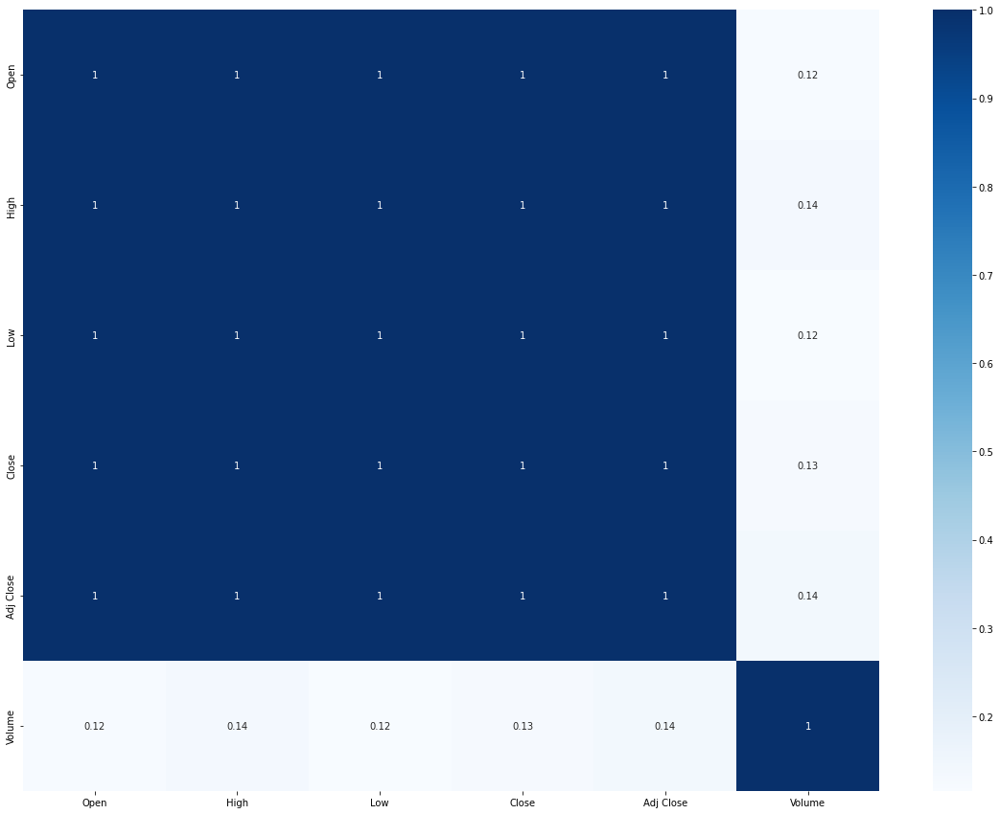

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.644513,0.860603,1,130,False,False


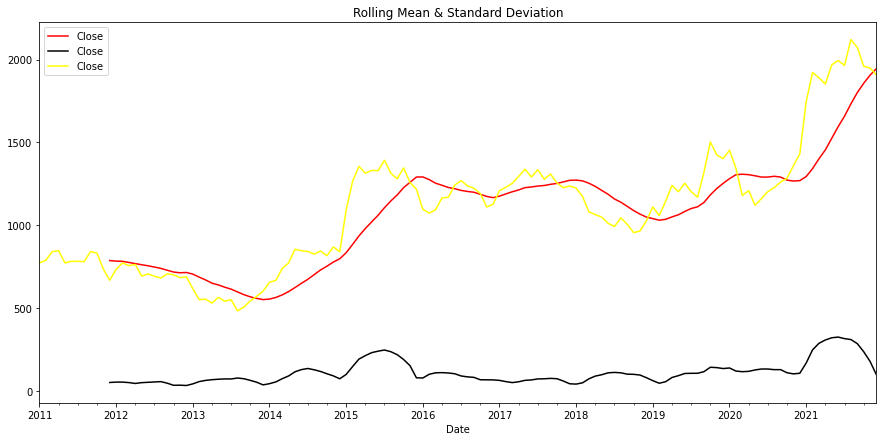

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

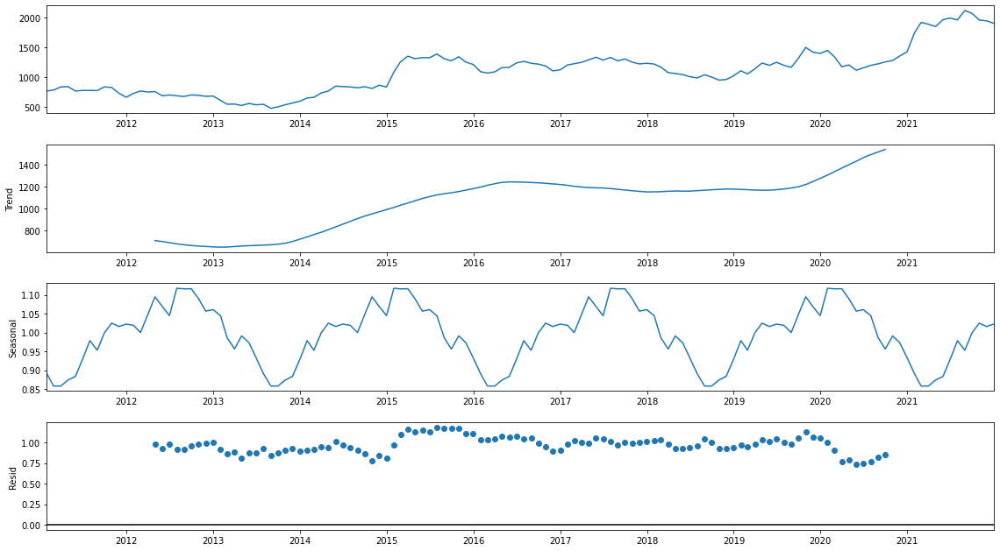

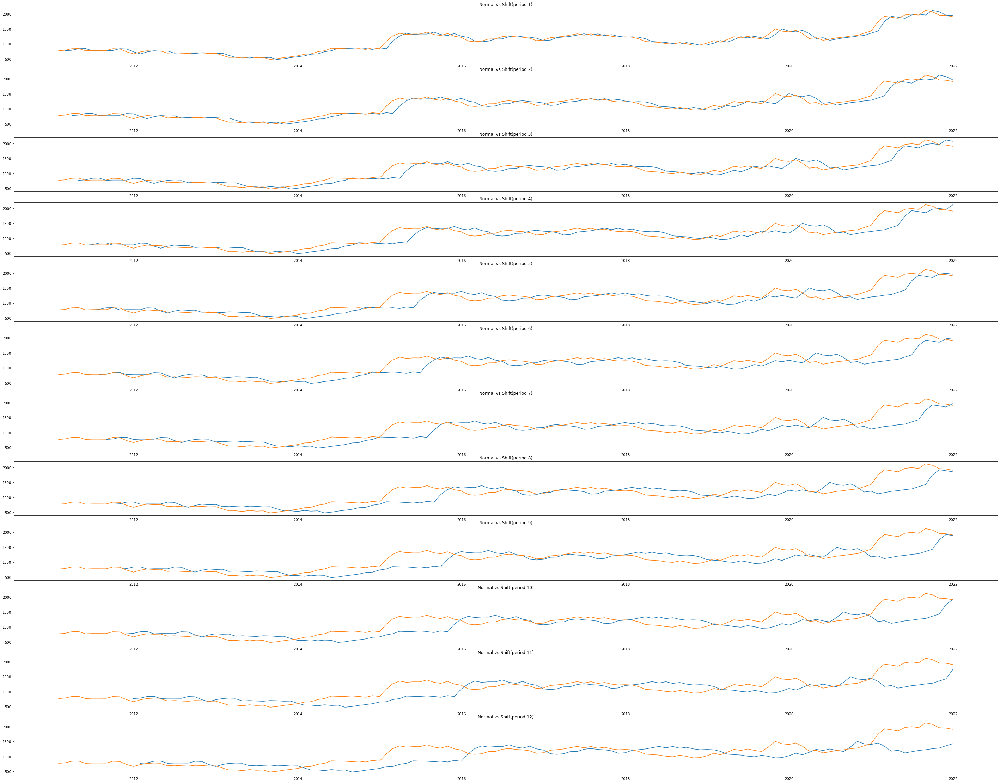

<Figure size 1080x504 with 0 Axes>

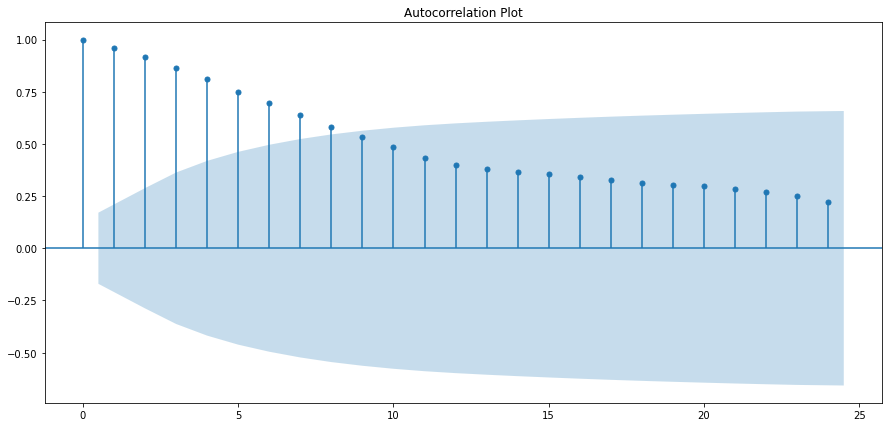

<Figure size 1080x504 with 0 Axes>

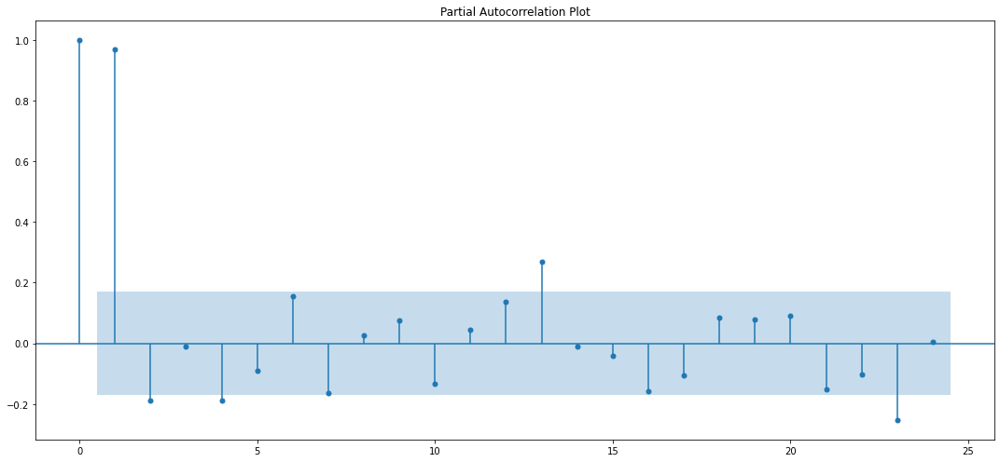

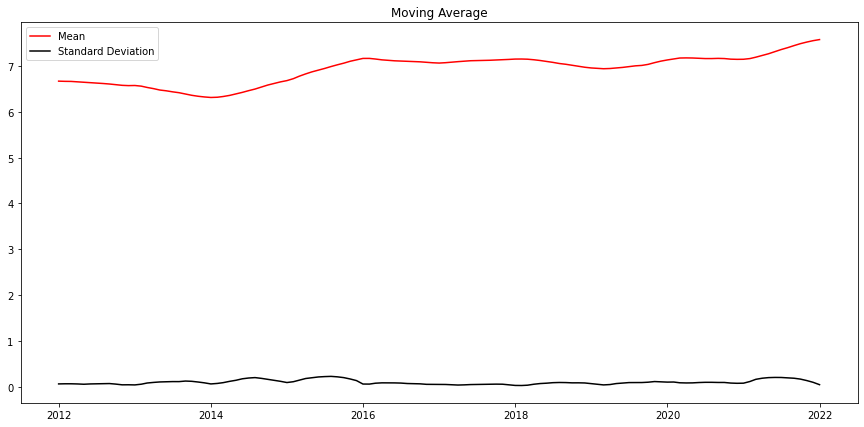

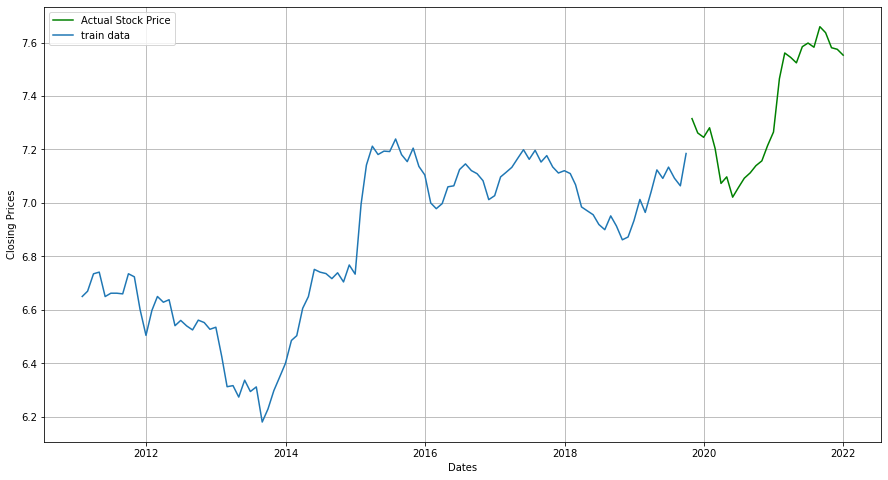

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2223.4008256802235
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1934.657171039164
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1714.5533958287529
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1553.035286427413
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1717.2768865541298
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1665.786138252993
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1566.2968574357974
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1548.5047299010796
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 2039.9041193525368
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1773.2372385231042
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1577.8546572708203
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1425.3854606421162
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1597.1583096115041
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1533.55851384076
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1451

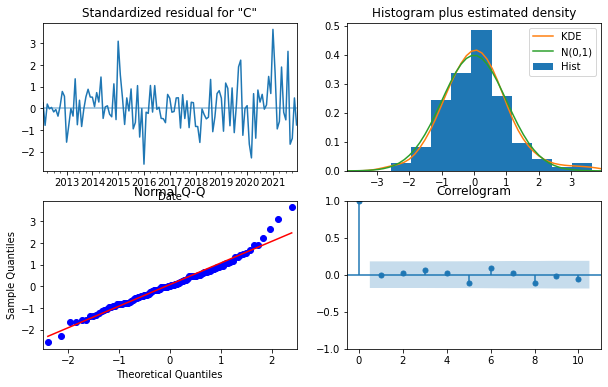

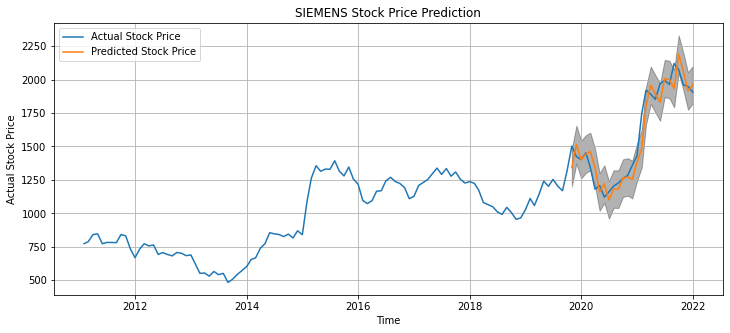

The Mean Squared Error is 10305.64
The root Mean Squared Error is 101.52


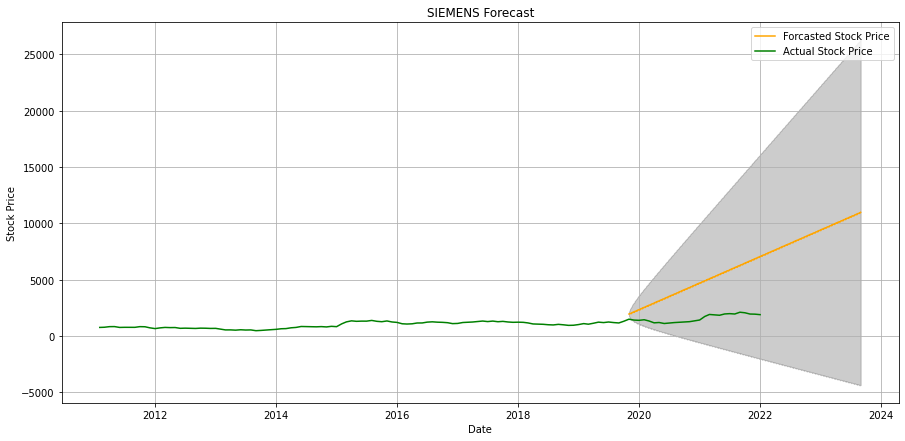

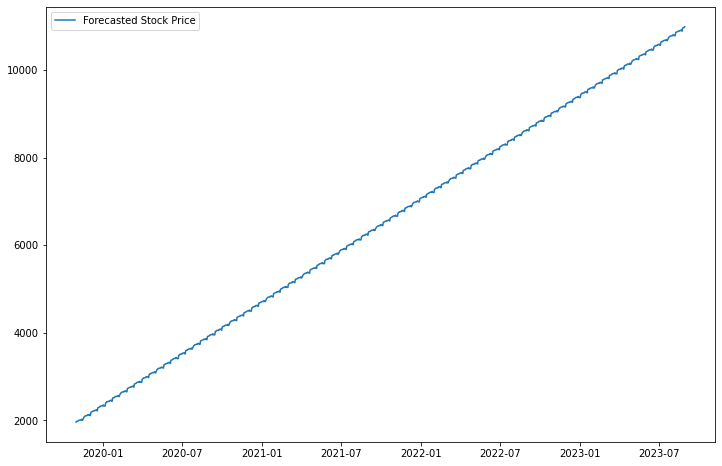

(58, 60, 1)
Epoch 1/50
2/2 [==============================] - 14s 285ms/step - loss: 0.4558
Epoch 2/50
2/2 [==============================] - 0s 228ms/step - loss: 0.2476
Epoch 3/50
2/2 [==============================] - 0s 225ms/step - loss: 0.0550
Epoch 4/50
2/2 [==============================] - 0s 211ms/step - loss: 0.0889
Epoch 5/50
2/2 [==============================] - 0s 227ms/step - loss: 0.0469
Epoch 6/50
2/2 [==============================] - 0s 247ms/step - loss: 0.0190
Epoch 7/50
2/2 [==============================] - 1s 265ms/step - loss: 0.0398
Epoch 8/50
2/2 [==============================] - 1s 262ms/step - loss: 0.0448
Epoch 9/50
2/2 [==============================] - 1s 239ms/step - loss: 0.0307
Epoch 10/50
2/2 [==============================] - 0s 215ms/step - loss: 0.0169
Epoch 11/50
2/2 [==============================] - 1s 253ms/step - loss: 0.0211
Epoch 12/50
2/2 [==============================] - 1s 261ms/step - loss: 0.0254
Epoch 13/50
2/2 [===================

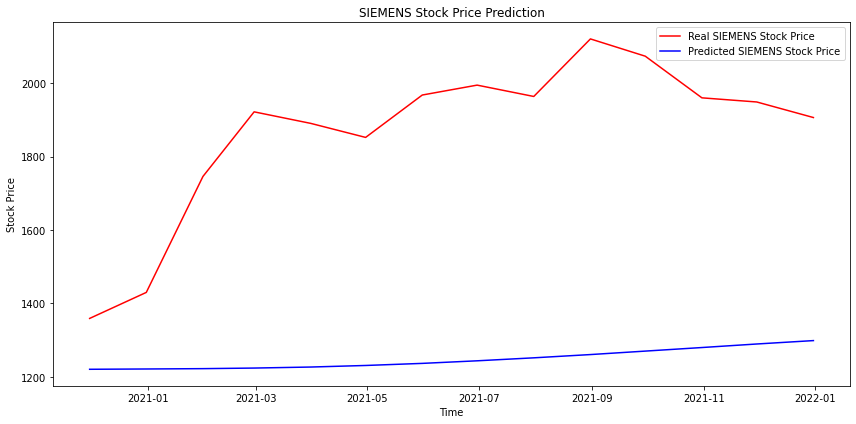

In [165]:
stock_market_prediction(NSE_data, symbol="SIEMENS", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### CAMS

In [204]:
# stock_market_prediction(NSE_data, symbol="CAMS", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### PRINCEPIPE

In [202]:
# stock_market_prediction(NSE_data, symbol="PRINCEPIPE", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1, date=False)

#### SBICARD

In [203]:
# stock_market_prediction(NSE_data, symbol="SBICARD", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### ROUTE

In [171]:
# stock_market_prediction(NSE_data, symbol="ROUTE", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### American Stocks

#### AAPL

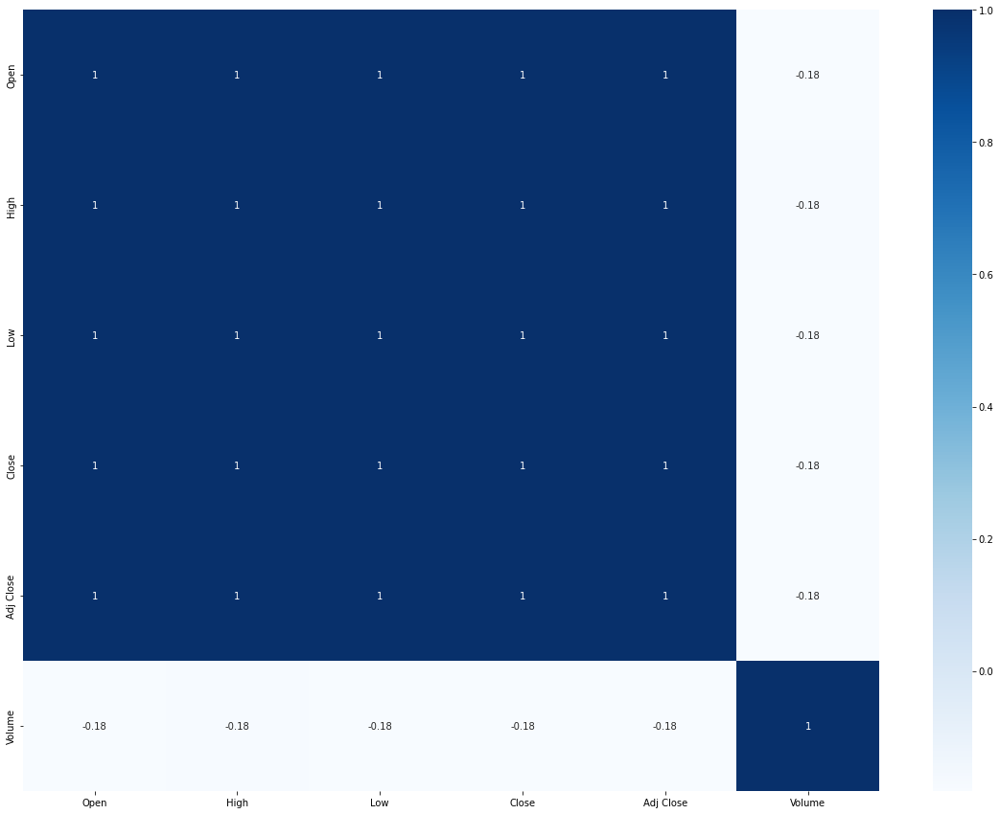

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,4.410346,1.0,18,474,False,False


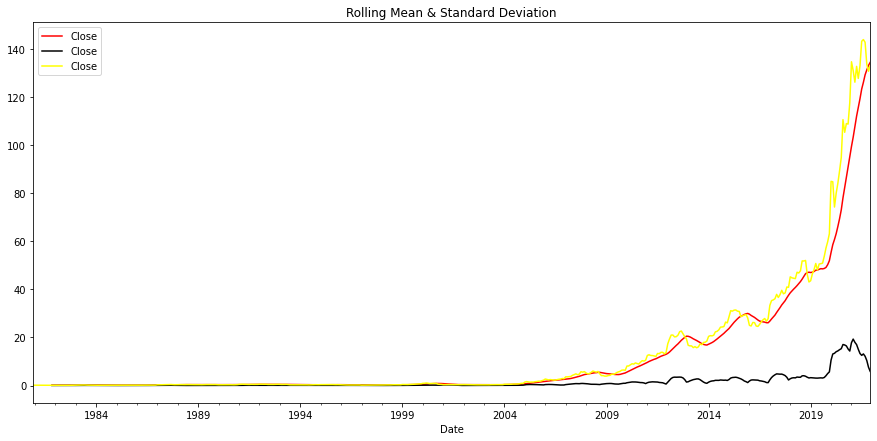

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

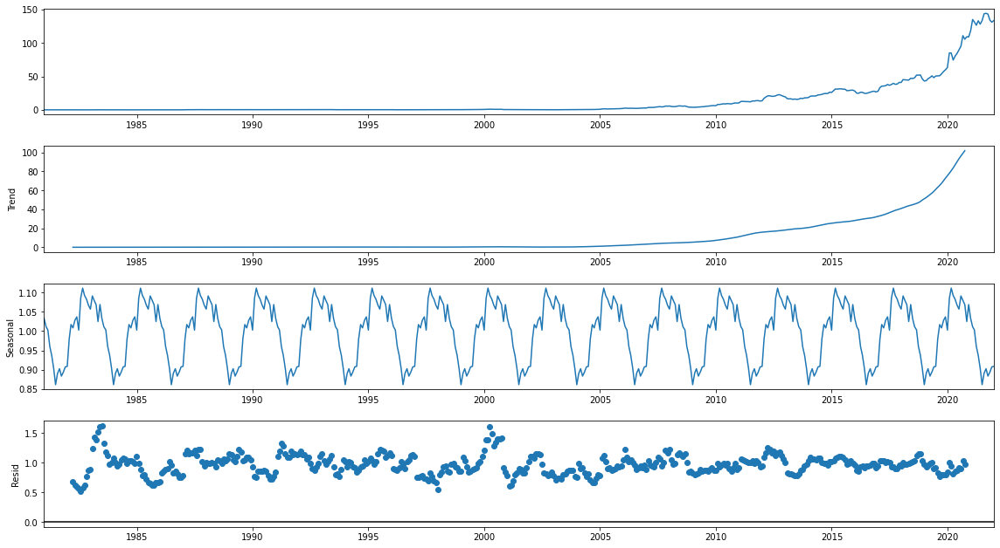

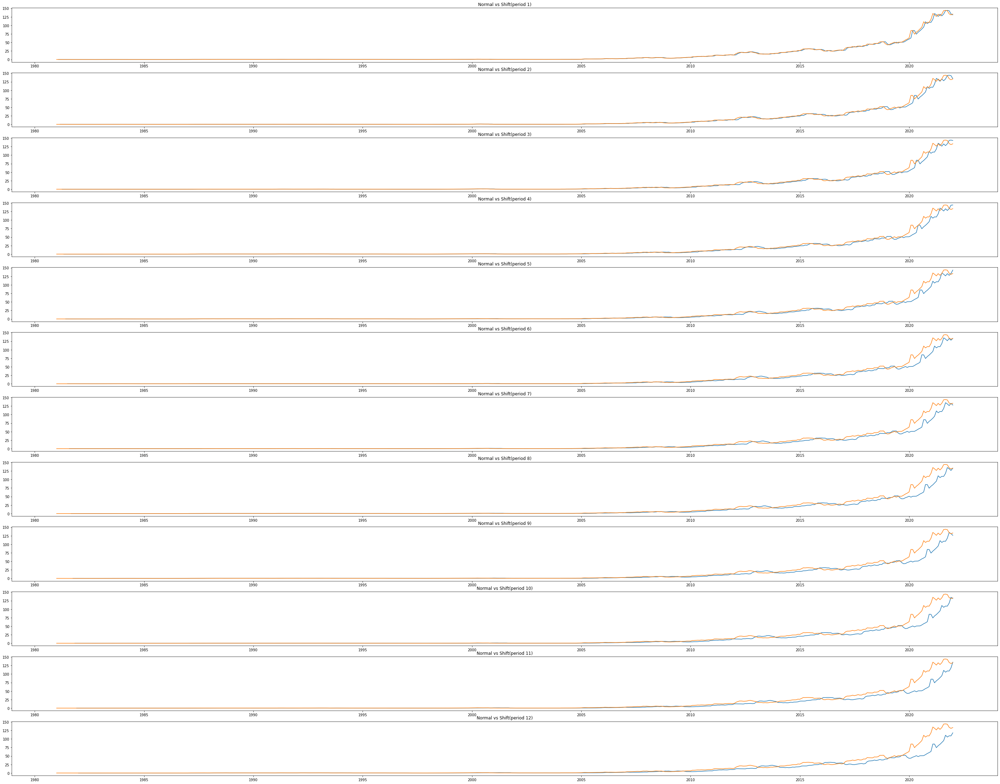

<Figure size 1080x504 with 0 Axes>

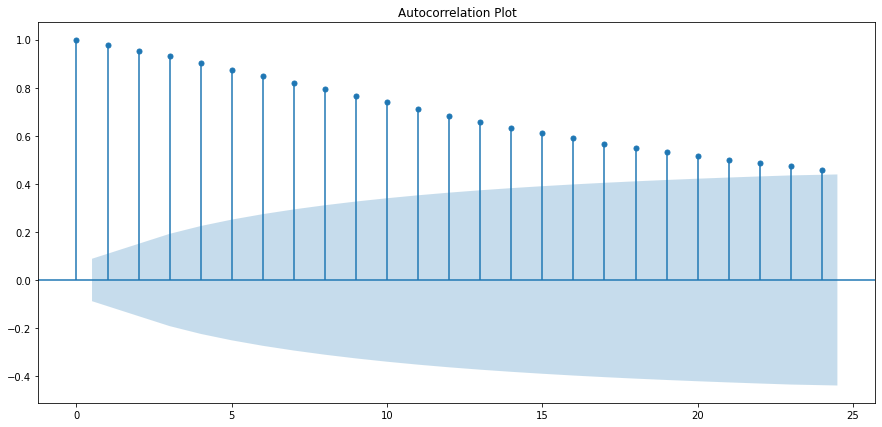

<Figure size 1080x504 with 0 Axes>

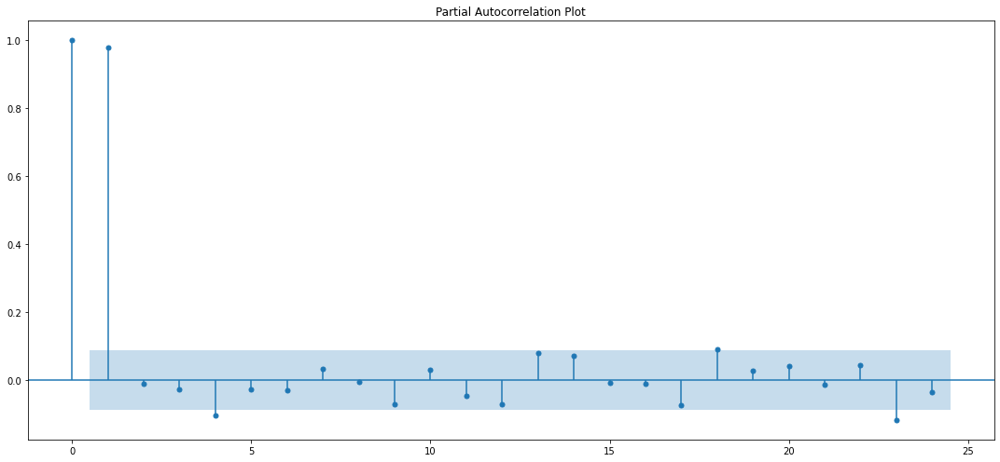

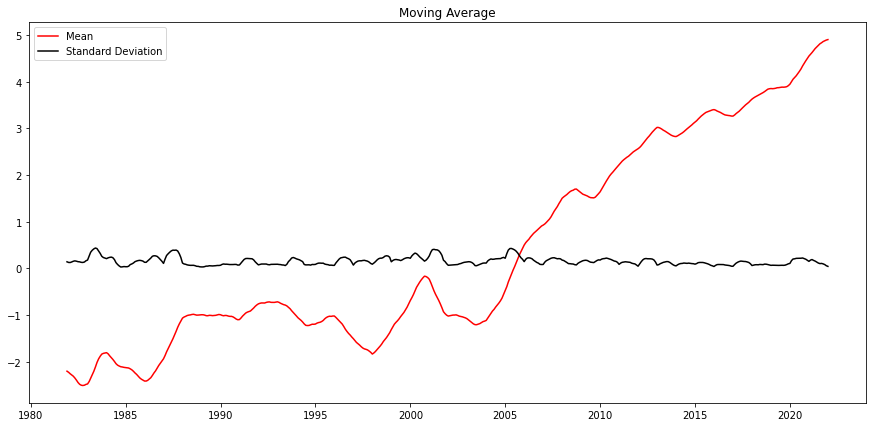

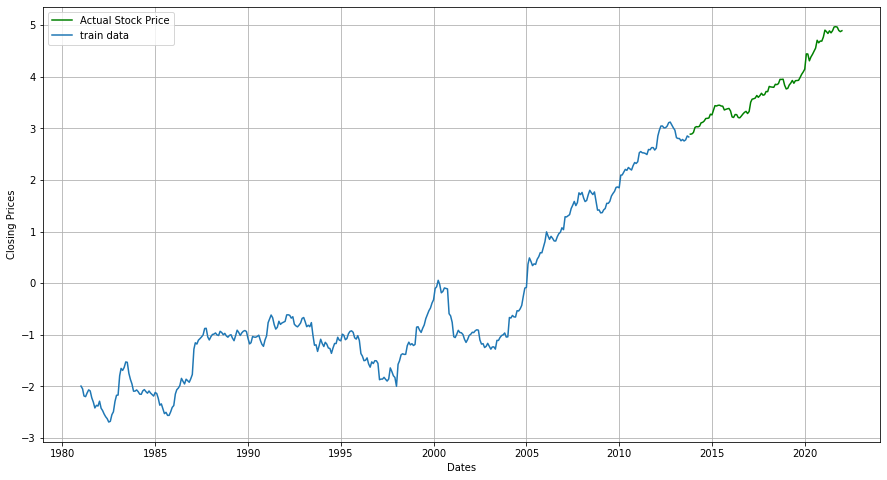

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4746.192894341674
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 4158.545818473292
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 3596.8356340548
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 3330.5561954832524
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 3145.4485442113655
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 3105.0593169548015
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 3324.6001409737155
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 3116.8095088497553
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 4089.0979332437782
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 3537.317464144192
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 3011.8919198707945
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2860.717651664856
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2715.9583828950663
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2632.184545867654
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 2852.56

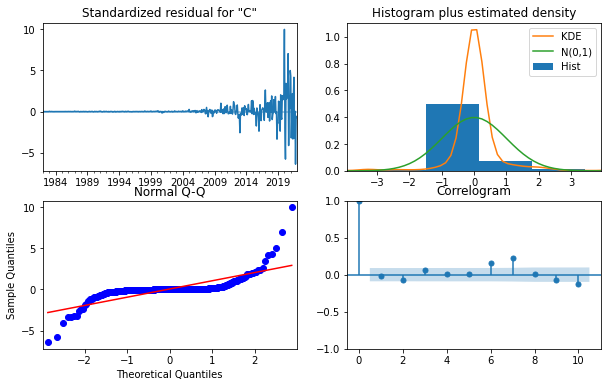

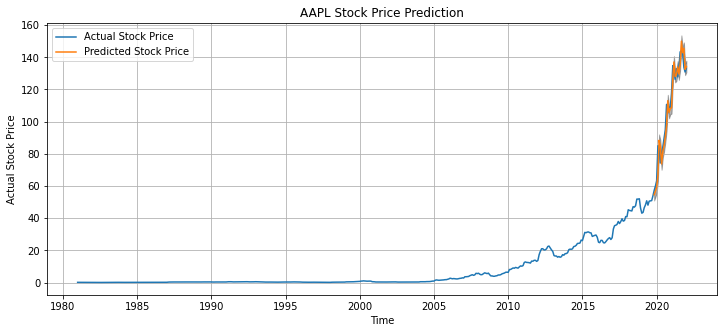

The Mean Squared Error is 48.69
The root Mean Squared Error is 6.98


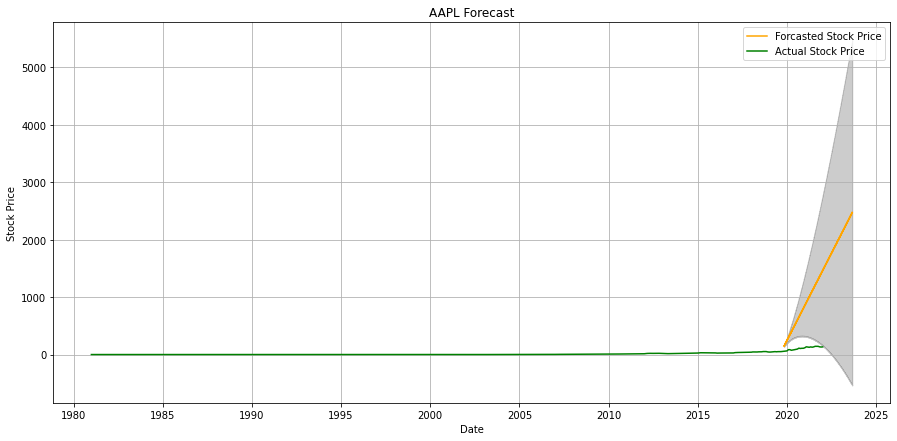

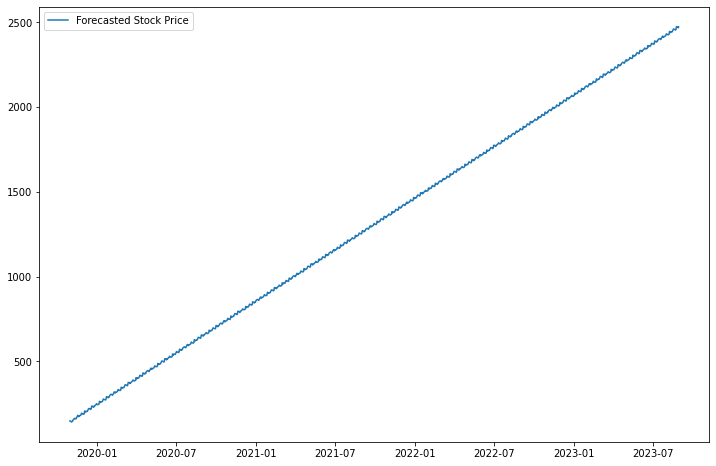

(383, 60, 1)
Epoch 1/50
12/12 [==============================] - 16s 242ms/step - loss: 0.0333
Epoch 2/50
12/12 [==============================] - 3s 285ms/step - loss: 0.0053
Epoch 3/50
12/12 [==============================] - 3s 253ms/step - loss: 0.0038
Epoch 4/50
12/12 [==============================] - 3s 249ms/step - loss: 0.0035
Epoch 5/50
12/12 [==============================] - 3s 265ms/step - loss: 0.0030
Epoch 6/50
12/12 [==============================] - 3s 247ms/step - loss: 0.0037
Epoch 7/50
12/12 [==============================] - 3s 231ms/step - loss: 0.0031
Epoch 8/50
12/12 [==============================] - 3s 283ms/step - loss: 0.0037
Epoch 9/50
12/12 [==============================] - 3s 247ms/step - loss: 0.0032
Epoch 10/50
12/12 [==============================] - 3s 247ms/step - loss: 0.0035
Epoch 11/50
12/12 [==============================] - 3s 271ms/step - loss: 0.0035
Epoch 12/50
12/12 [==============================] - 3s 246ms/step - loss: 0.0032
Epoch 13/50

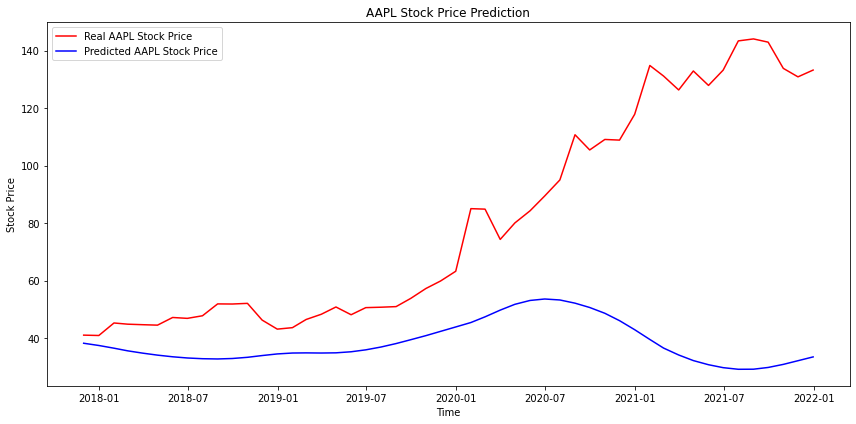

In [197]:
stock_market_prediction(faang, symbol="AAPL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### AMZN

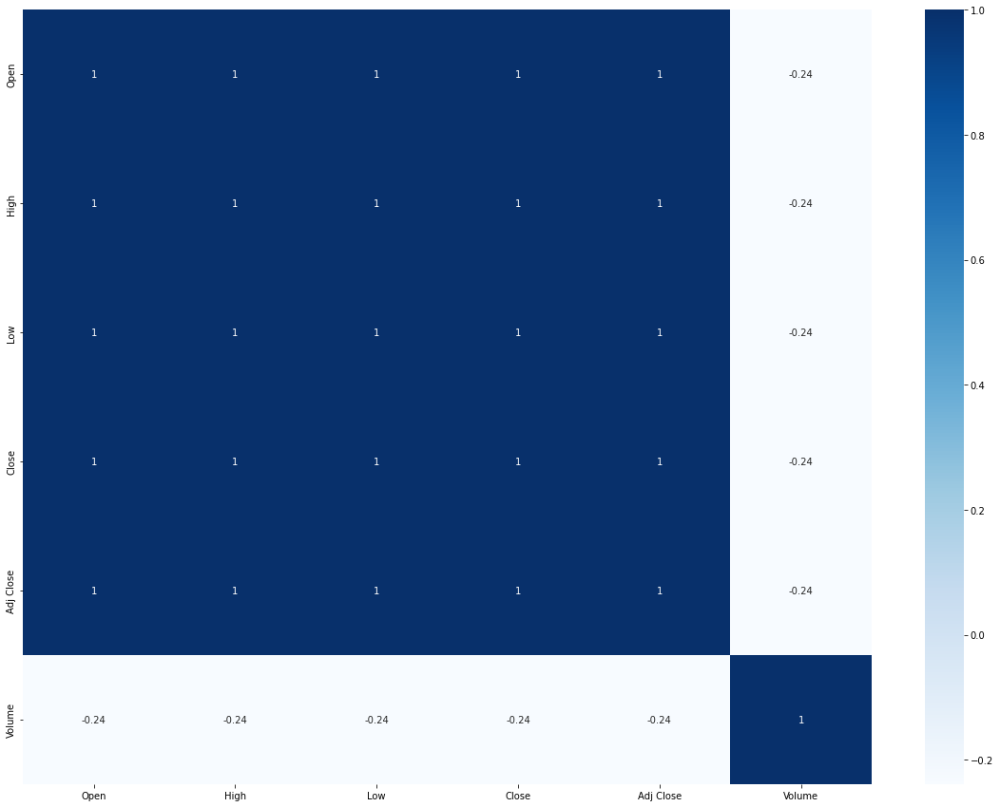

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,3.765042,1.0,16,283,False,False


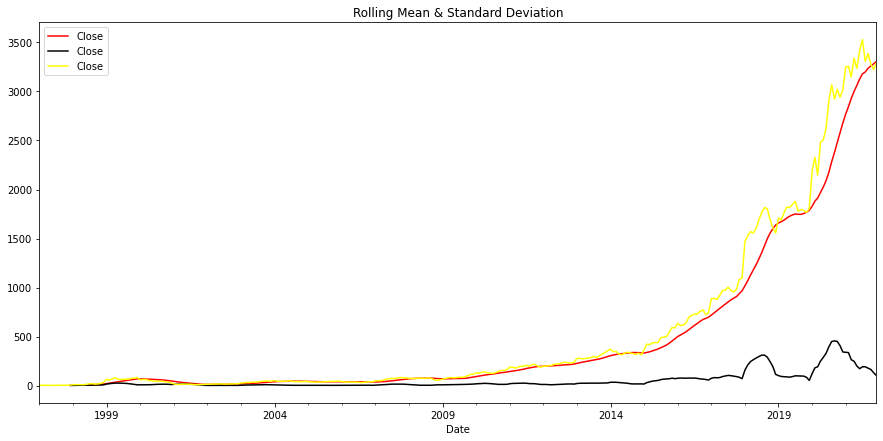

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

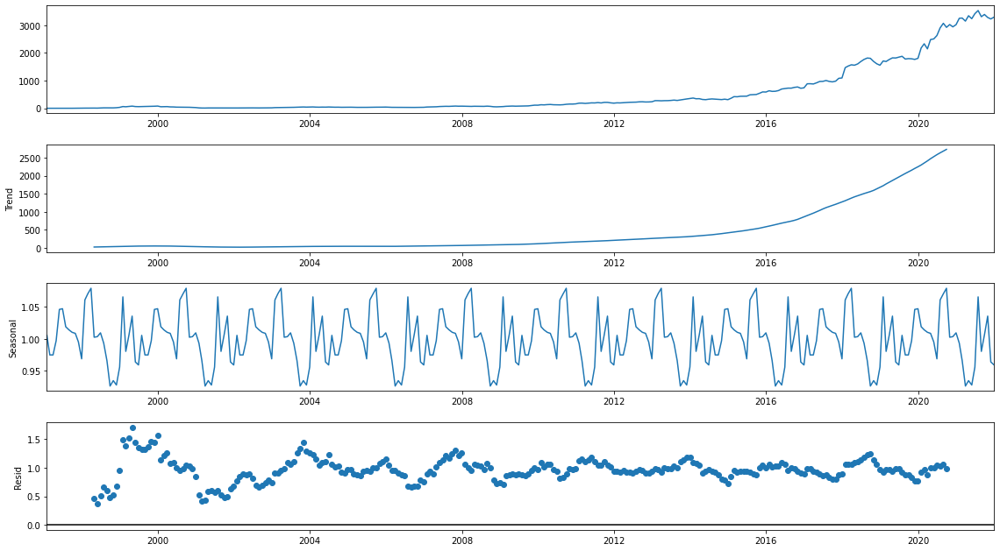

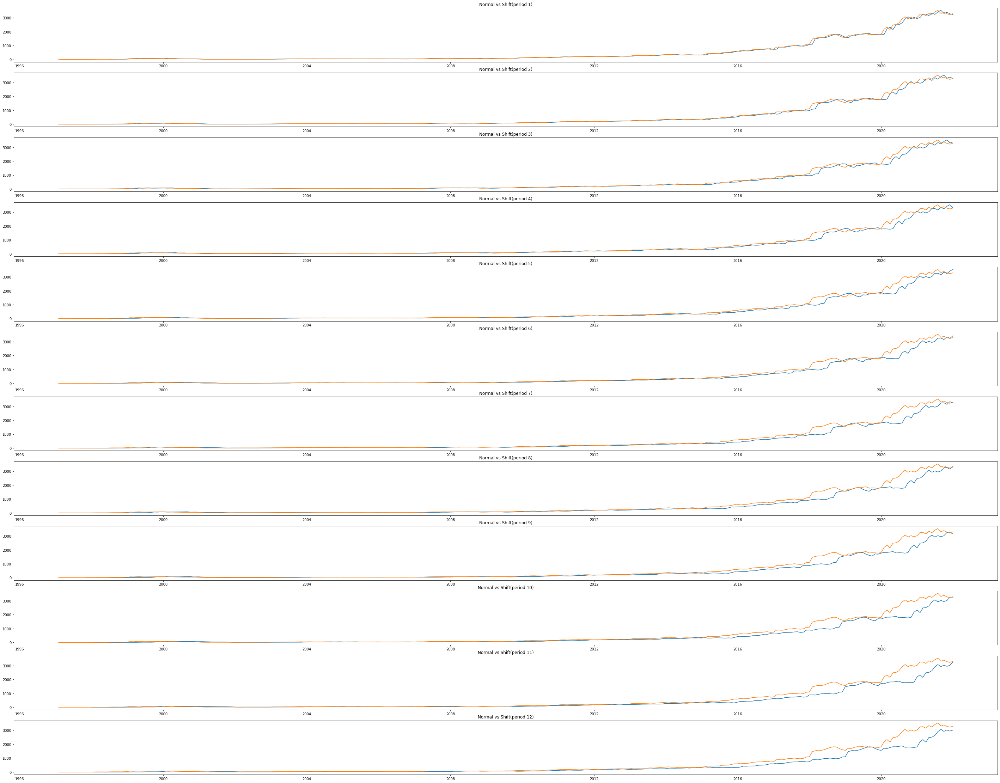

<Figure size 1080x504 with 0 Axes>

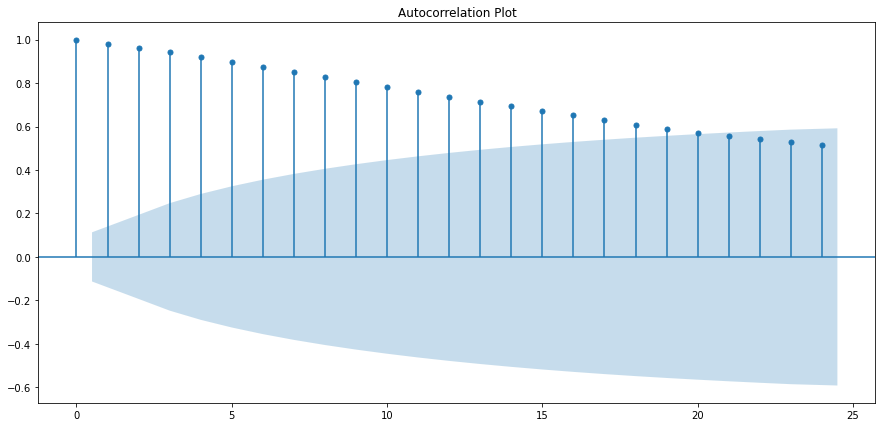

<Figure size 1080x504 with 0 Axes>

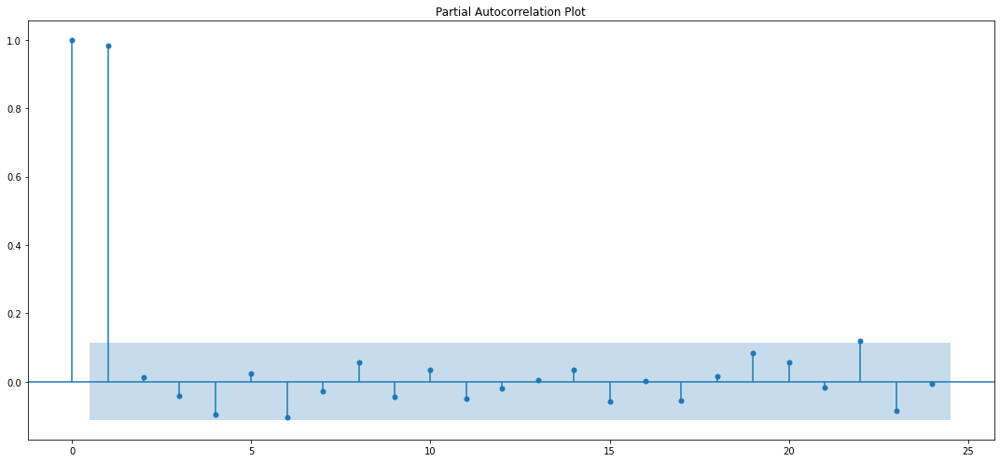

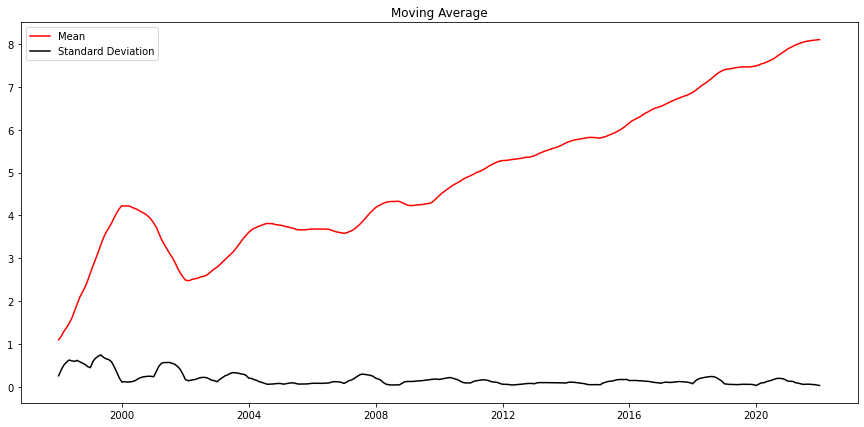

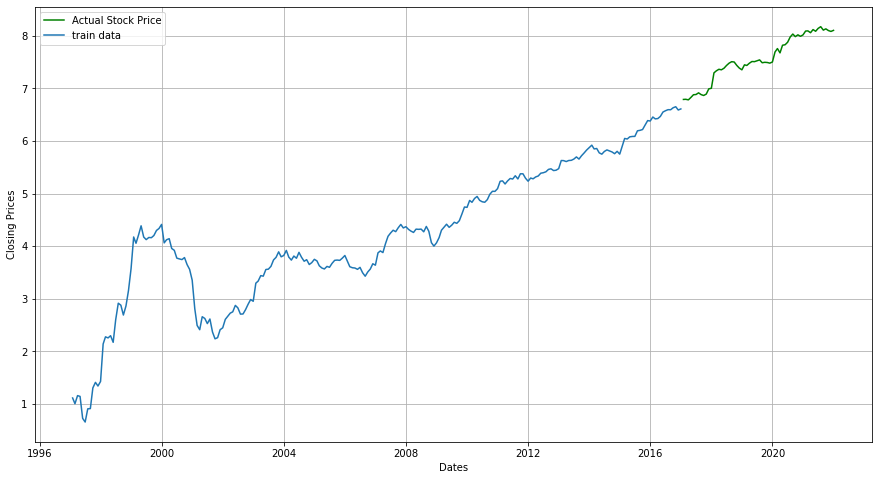

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4995.422698880069
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 4511.845956394992
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 4075.041353102165
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 3873.20455556636
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 3796.9295183841514
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 3590.1067237361476
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 3838.792499881163
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 3673.9072362816823
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 4597.184400893566
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 4136.4503197945205
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 3745.349463663729
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 3570.992776687919
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 3557.2006291119787
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 3367.9865480719263
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 3571.153

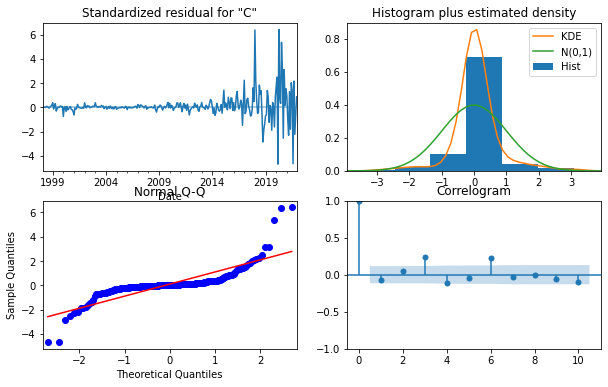

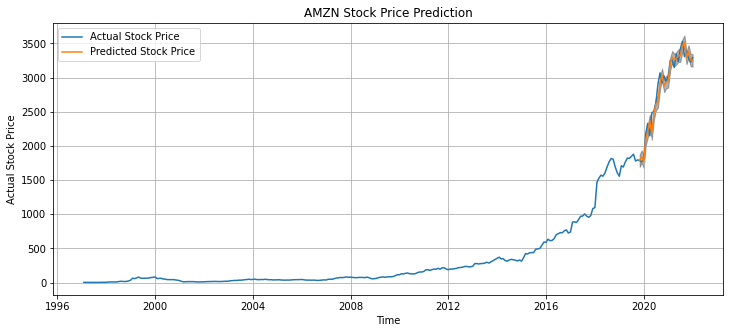

The Mean Squared Error is 15059.25
The root Mean Squared Error is 122.72


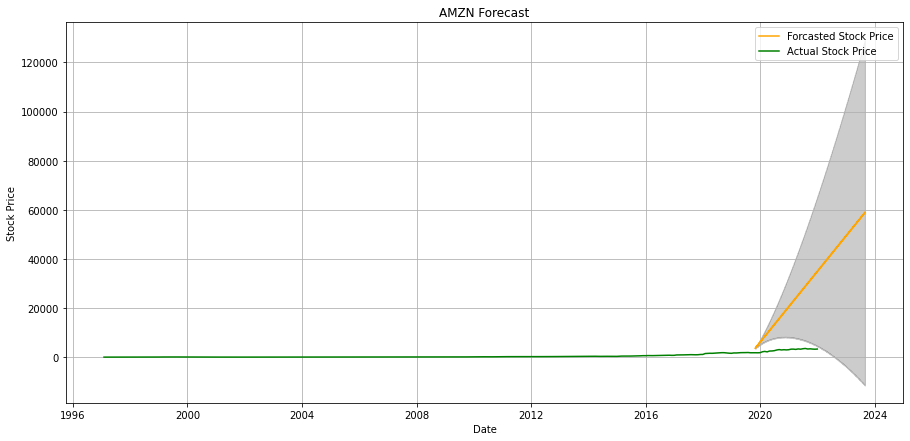

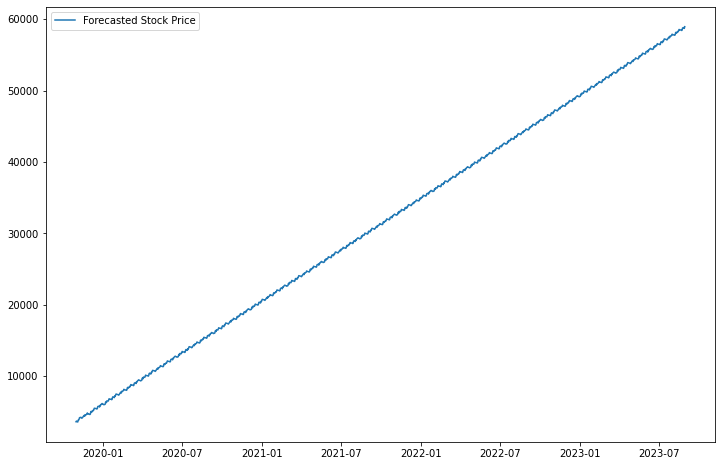

(210, 60, 1)
Epoch 1/50
7/7 [==============================] - 14s 215ms/step - loss: 0.0621
Epoch 2/50
7/7 [==============================] - 1s 211ms/step - loss: 0.0161
Epoch 3/50
7/7 [==============================] - 2s 229ms/step - loss: 0.0061
Epoch 4/50
7/7 [==============================] - 1s 197ms/step - loss: 0.0029
Epoch 5/50
7/7 [==============================] - 2s 225ms/step - loss: 0.0019
Epoch 6/50
7/7 [==============================] - 1s 189ms/step - loss: 0.0024
Epoch 7/50
7/7 [==============================] - 1s 208ms/step - loss: 0.0017
Epoch 8/50
7/7 [==============================] - 2s 248ms/step - loss: 0.0018
Epoch 9/50
7/7 [==============================] - 1s 199ms/step - loss: 0.0016
Epoch 10/50
7/7 [==============================] - 1s 199ms/step - loss: 0.0021
Epoch 11/50
7/7 [==============================] - 1s 197ms/step - loss: 0.0016
Epoch 12/50
7/7 [==============================] - 1s 187ms/step - loss: 0.0017
Epoch 13/50
7/7 [==================

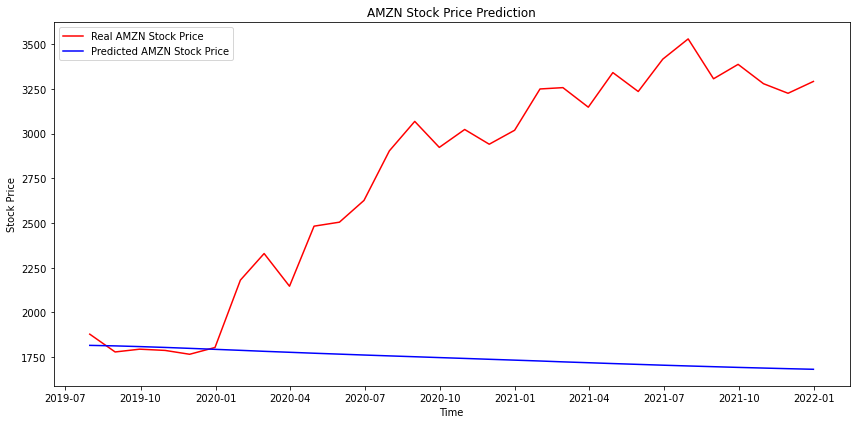

In [198]:
stock_market_prediction(faang, symbol="AMZN", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### FB

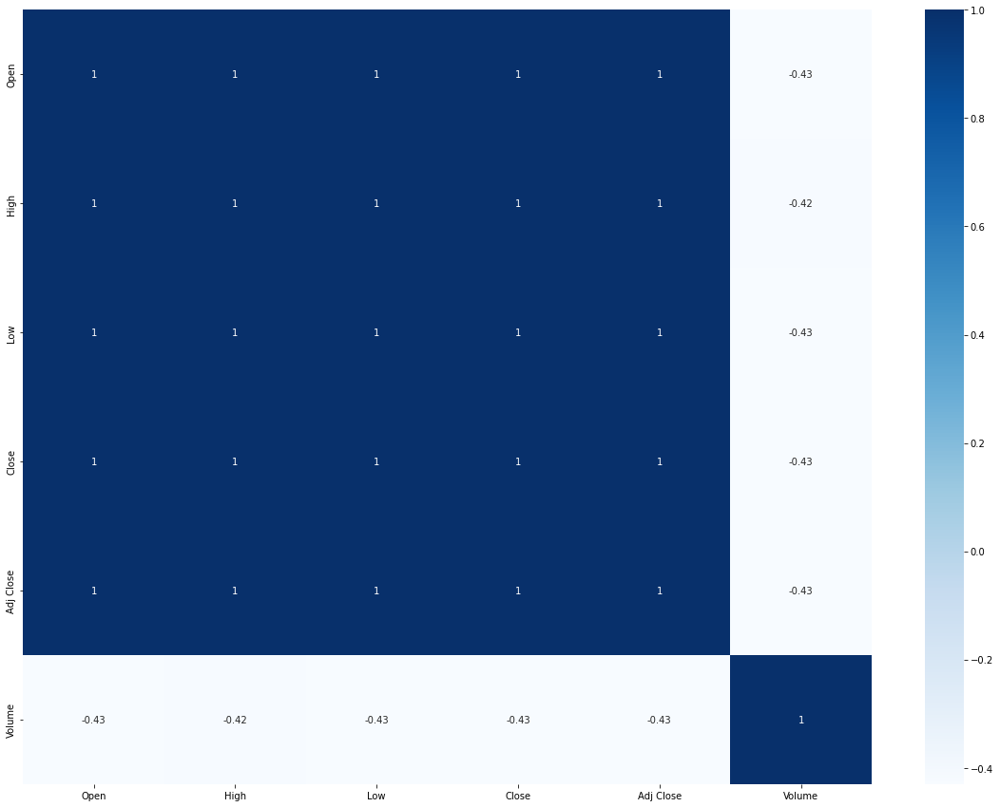

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,0.683697,0.989507,4,115,False,False


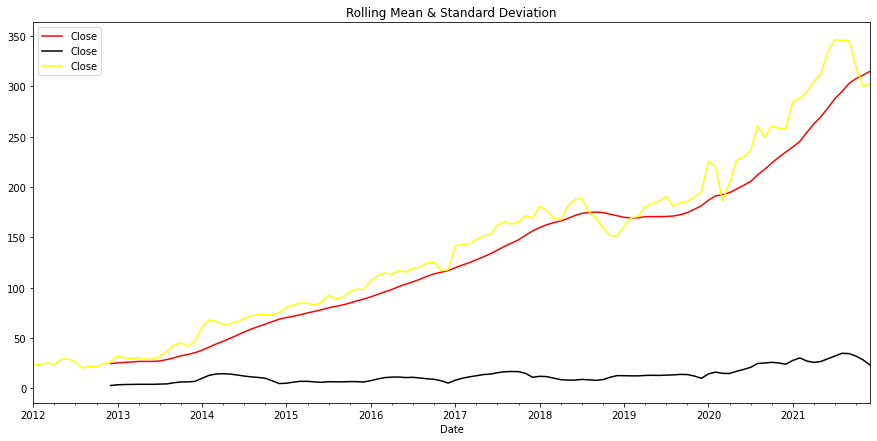

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

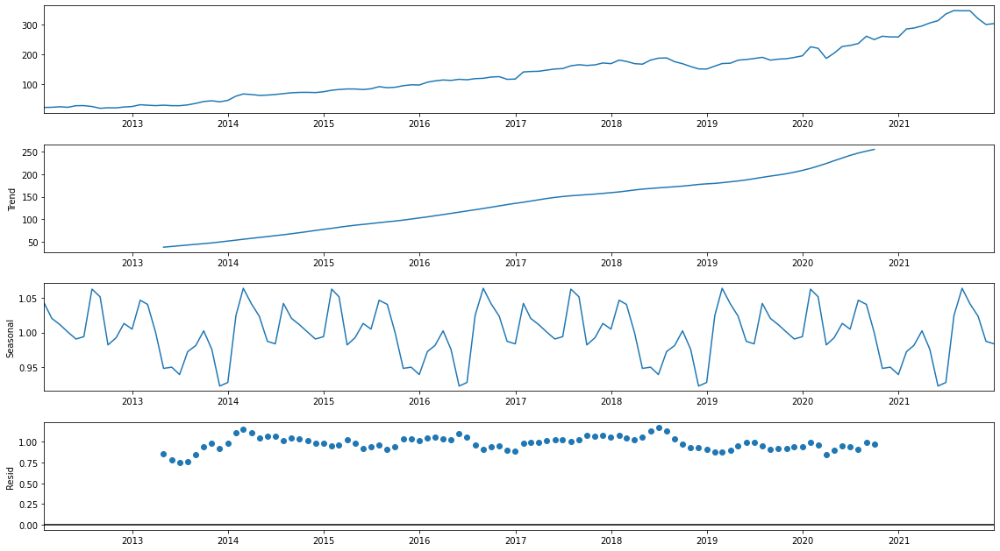

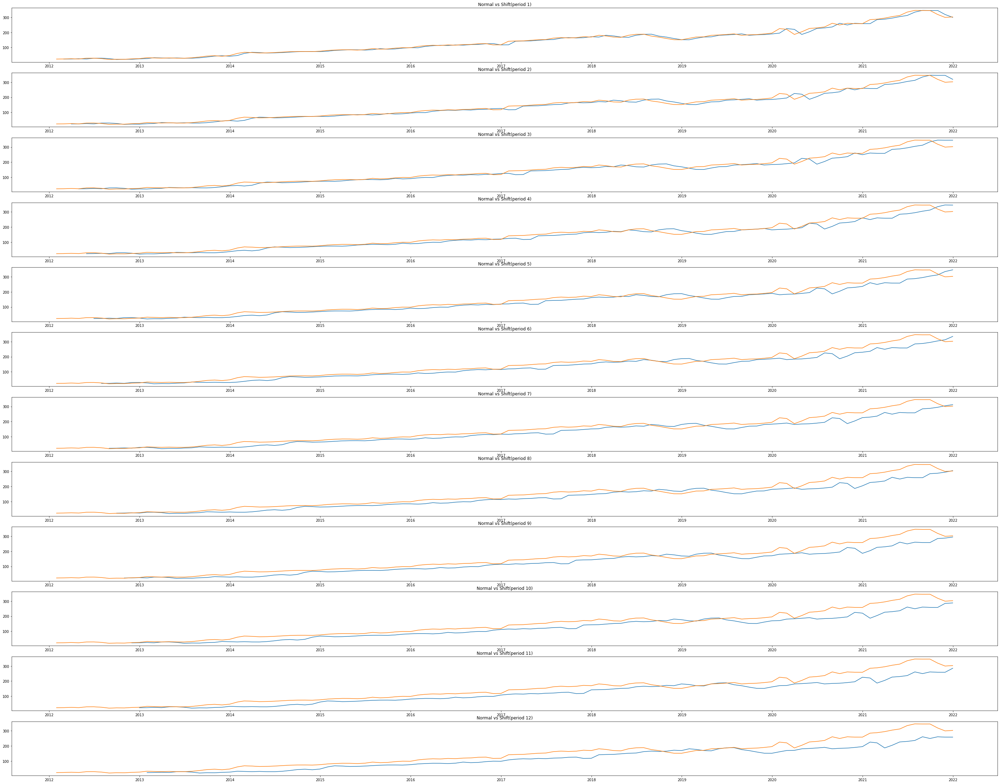

<Figure size 1080x504 with 0 Axes>

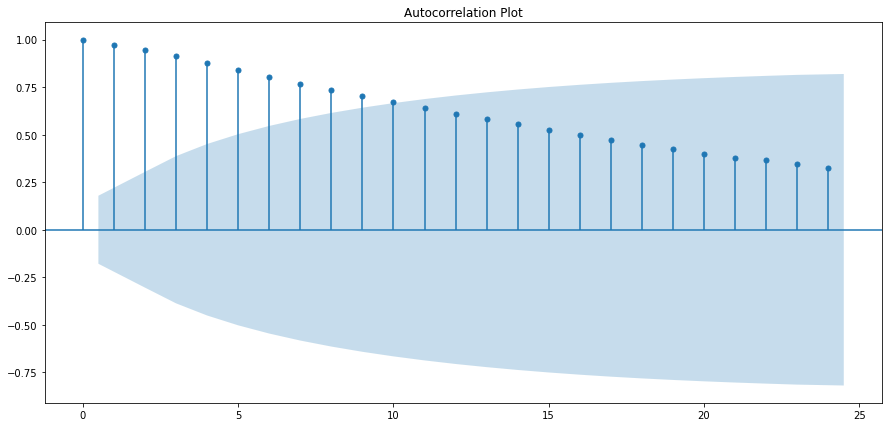

<Figure size 1080x504 with 0 Axes>

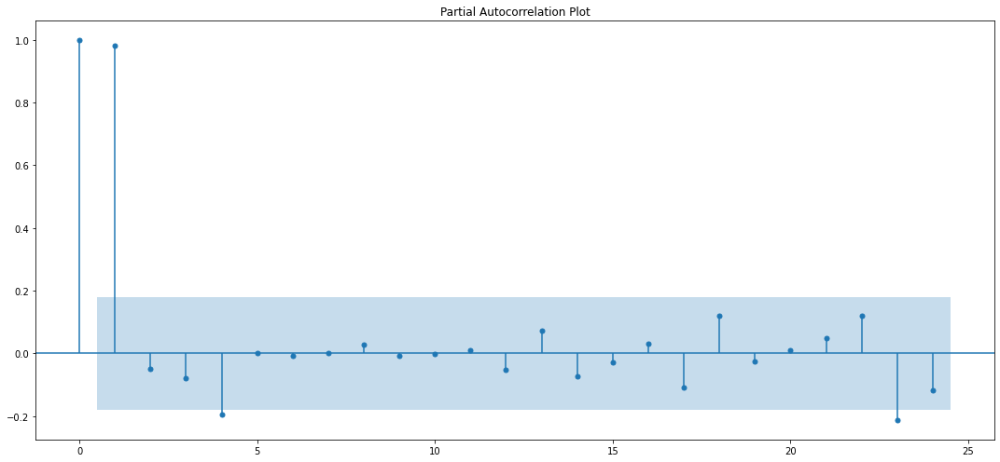

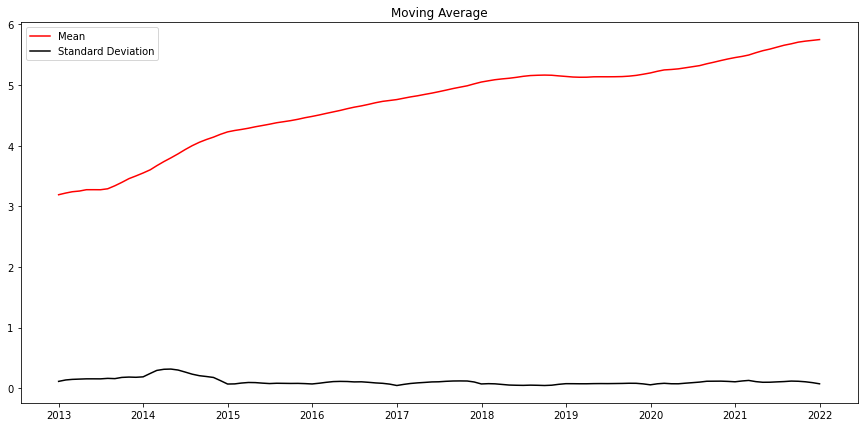

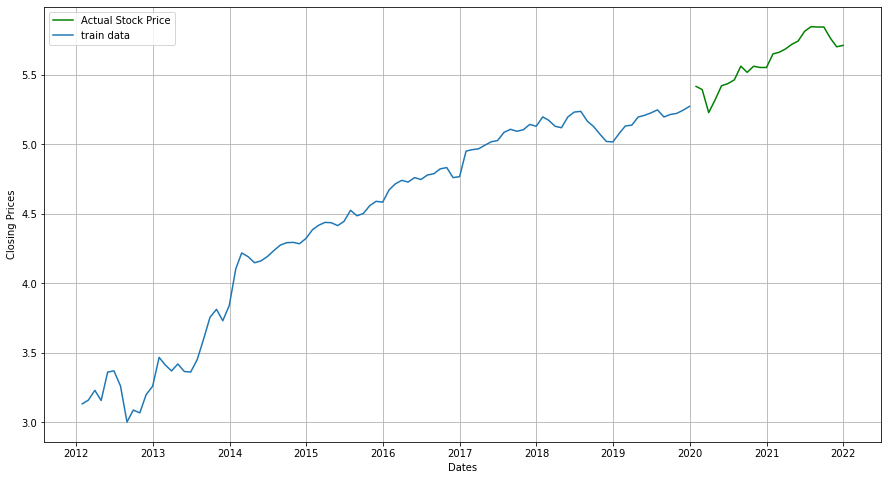

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1555.2254035377202
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1315.204702510353
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1103.1269105927481
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 954.4725467197061
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 996.0889211130619
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 988.912480397469
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 944.0306750617741
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 909.3754974138748
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1392.0396973173777
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1168.4054838539776
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 971.5441008565442
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 846.870287207476
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 904.5220956069445
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 882.1629829759003
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 889.1997297

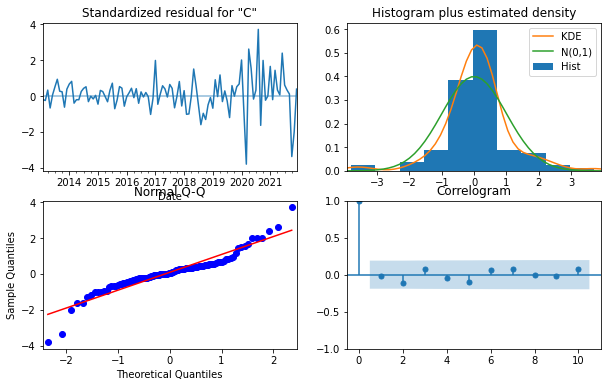

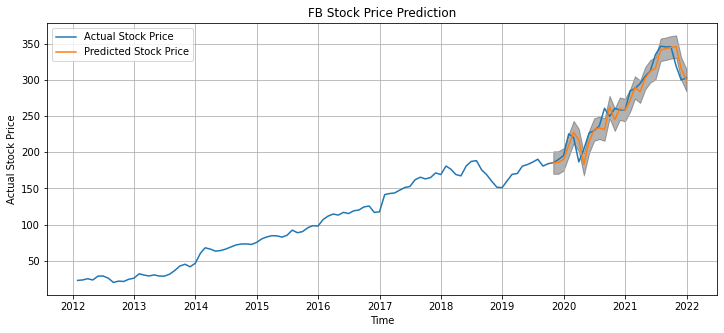

The Mean Squared Error is 178.65
The root Mean Squared Error is 13.37


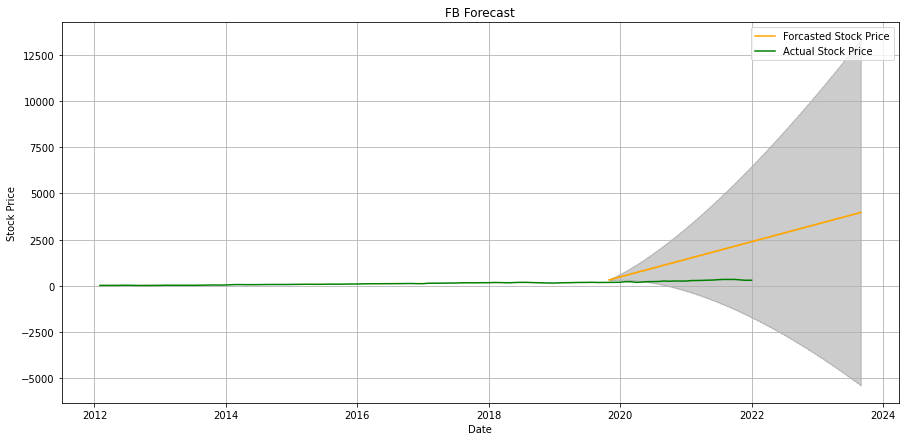

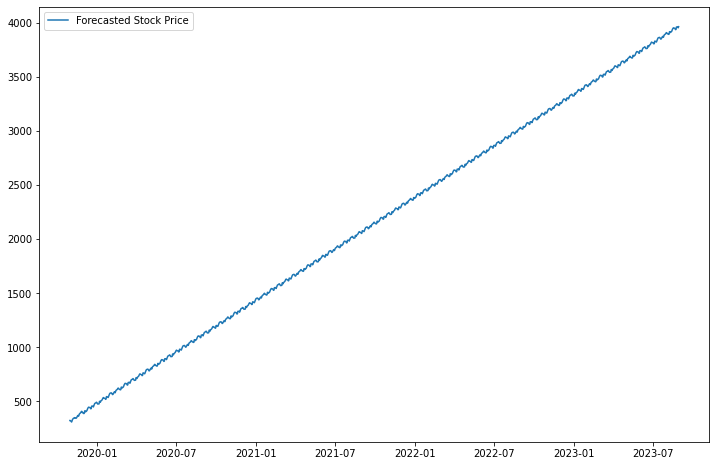

(48, 60, 1)
Epoch 1/50
2/2 [==============================] - 13s 158ms/step - loss: 0.4499
Epoch 2/50
2/2 [==============================] - 0s 155ms/step - loss: 0.2971
Epoch 3/50
2/2 [==============================] - 0s 166ms/step - loss: 0.1015
Epoch 4/50
2/2 [==============================] - 0s 142ms/step - loss: 0.0403
Epoch 5/50
2/2 [==============================] - 0s 131ms/step - loss: 0.0773
Epoch 6/50
2/2 [==============================] - 0s 129ms/step - loss: 0.0098
Epoch 7/50
2/2 [==============================] - 0s 159ms/step - loss: 0.0290
Epoch 8/50
2/2 [==============================] - 0s 133ms/step - loss: 0.0368
Epoch 9/50
2/2 [==============================] - 0s 153ms/step - loss: 0.0262
Epoch 10/50
2/2 [==============================] - 0s 162ms/step - loss: 0.0122
Epoch 11/50
2/2 [==============================] - 0s 130ms/step - loss: 0.0113
Epoch 12/50
2/2 [==============================] - 0s 154ms/step - loss: 0.0188
Epoch 13/50
2/2 [===================

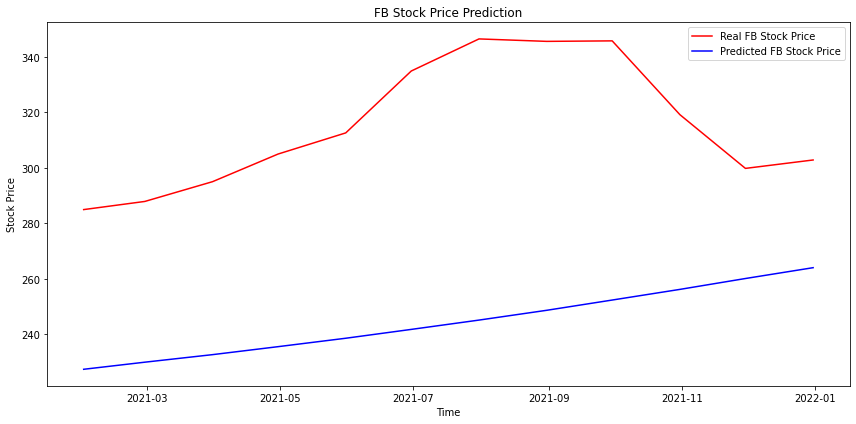

In [199]:
stock_market_prediction(faang, symbol="FB", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### GOOG

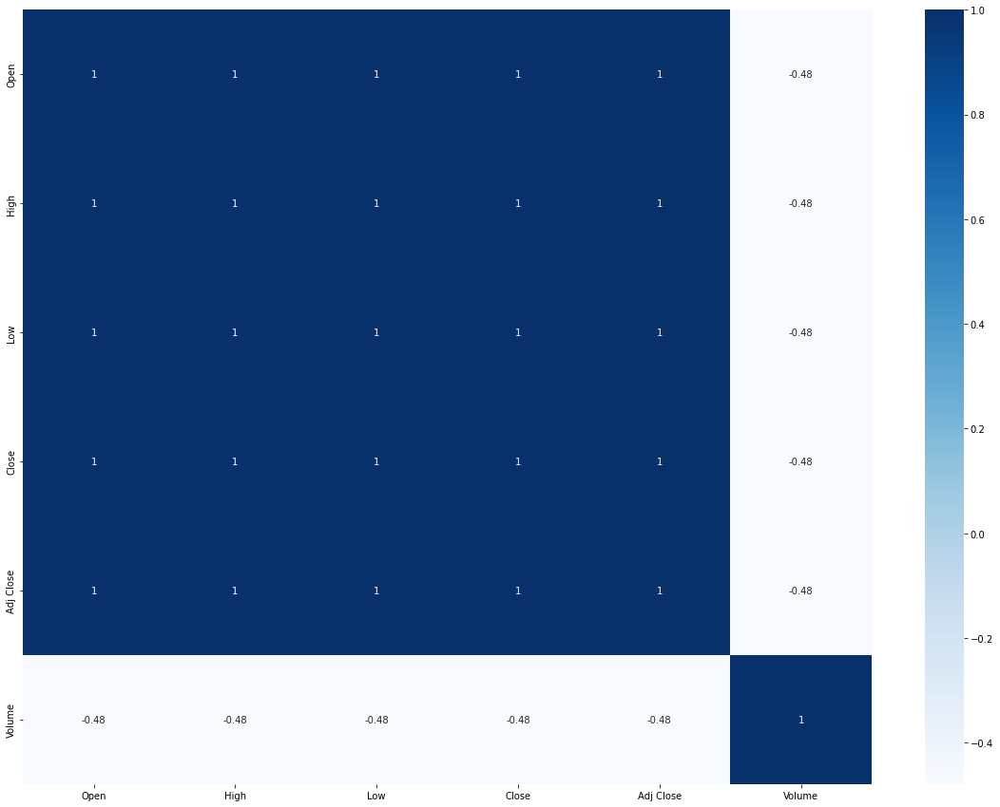

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,3.321119,1.0,15,200,False,False


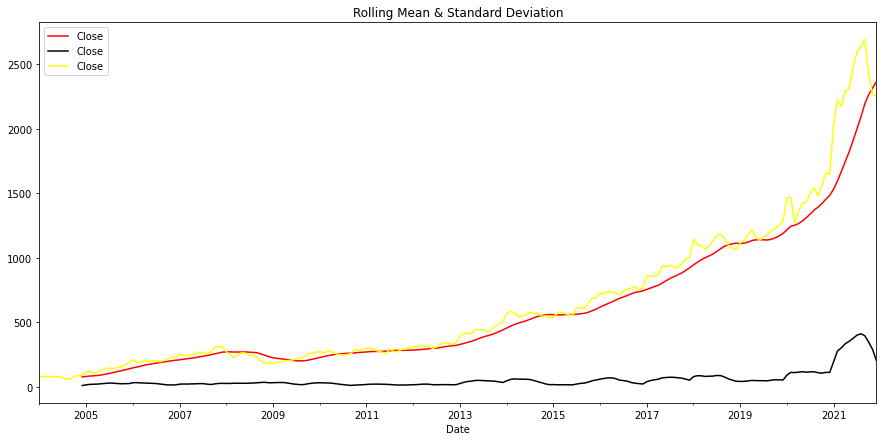

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

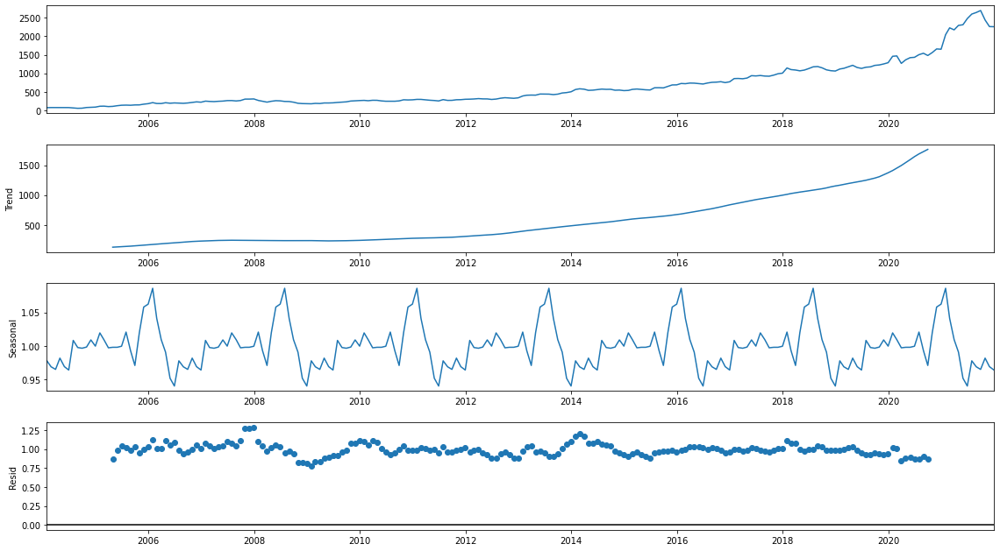

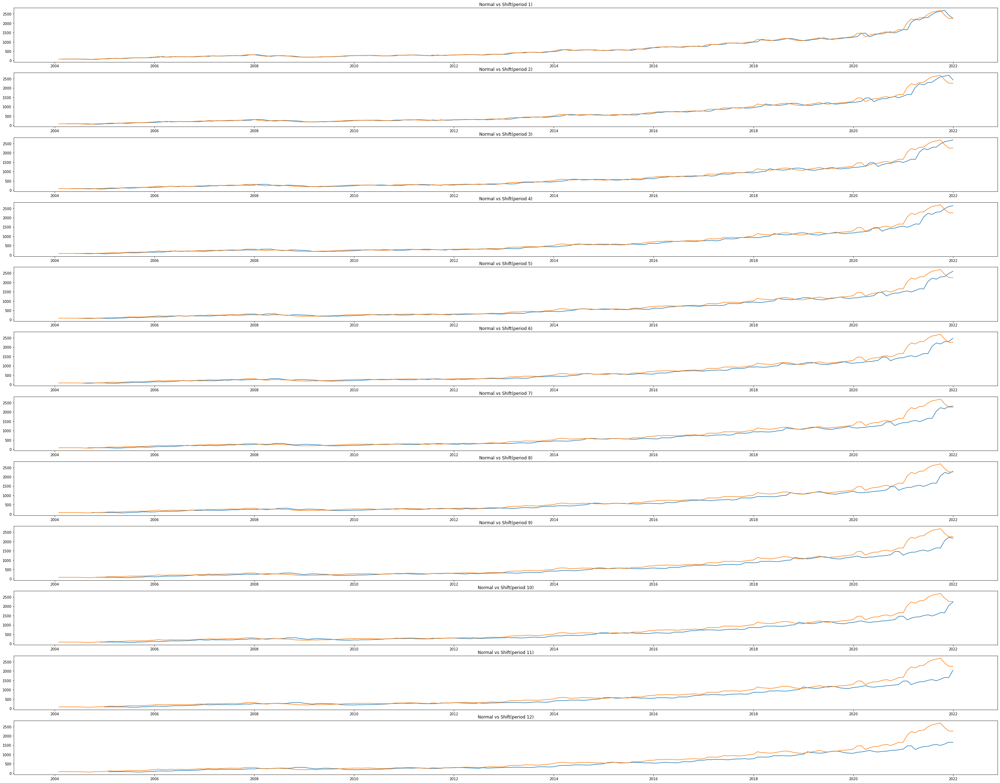

<Figure size 1080x504 with 0 Axes>

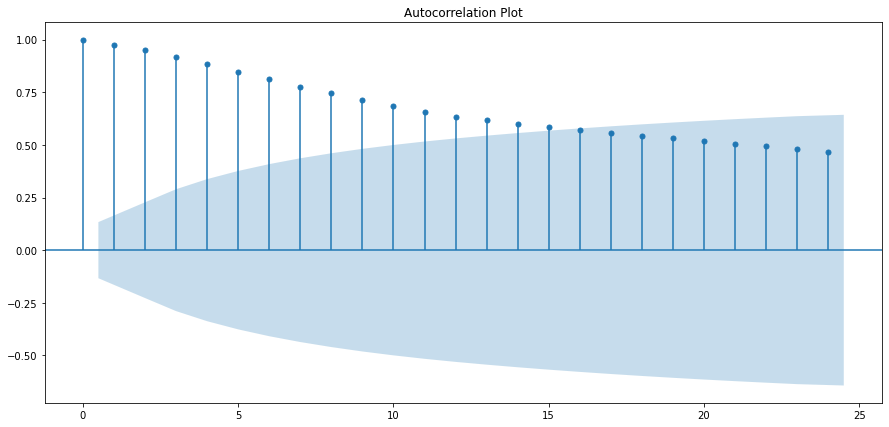

<Figure size 1080x504 with 0 Axes>

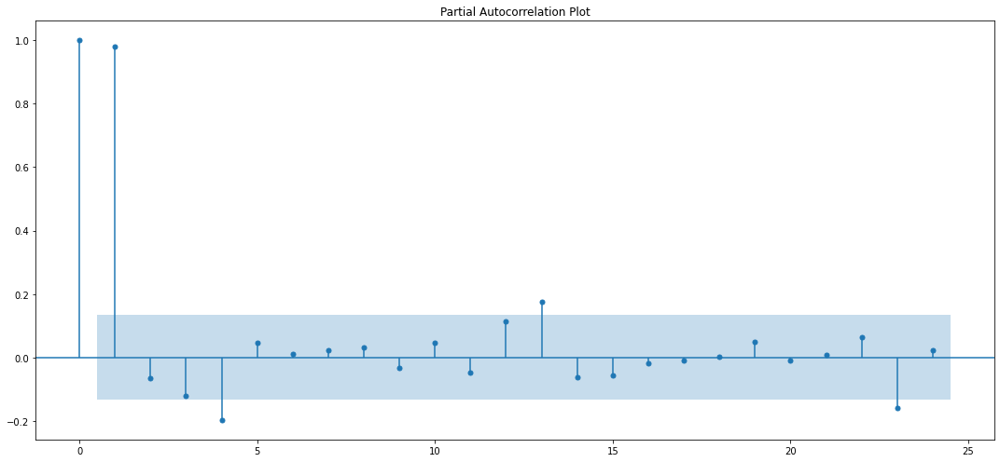

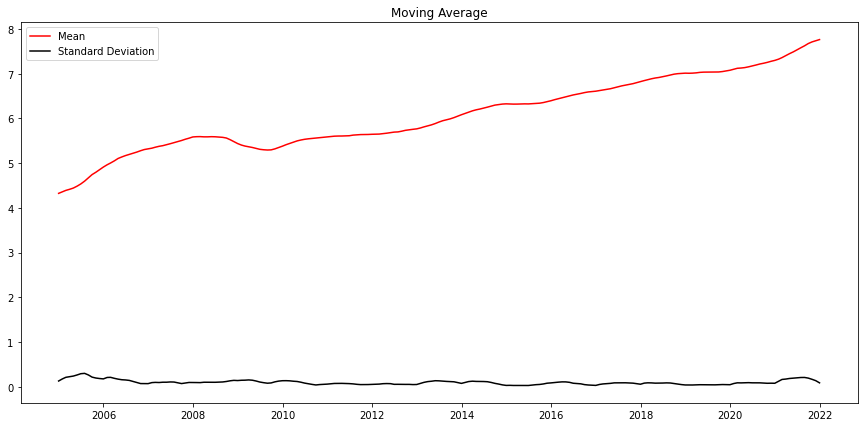

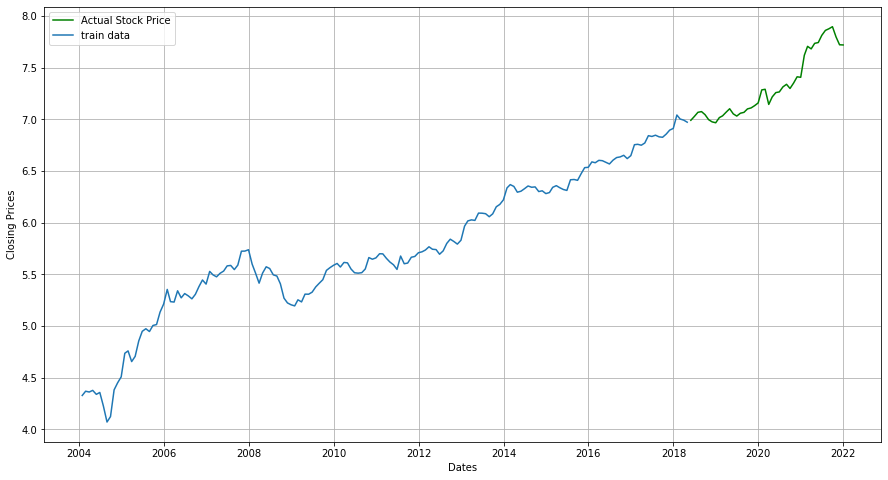

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 3517.9186602899977
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 3338.938073198374
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 2824.6018035791667
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 2611.6430486319564
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2640.046379964606
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 2625.5099838639585
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 2557.8328063532244
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 2505.7878161610815
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 3225.130913740577
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 2876.1807316336353
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 2557.8060742497423
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2367.1782666575627
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2415.381648027188
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2390.5573709705573
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 235

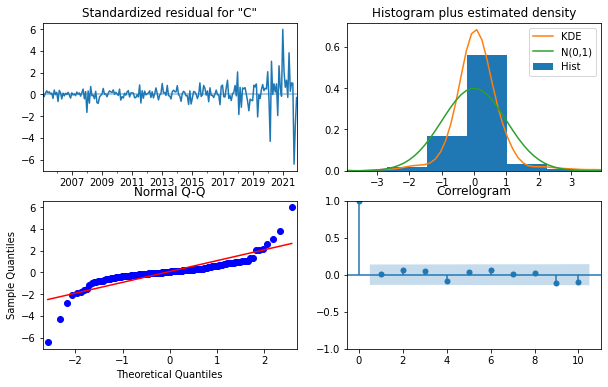

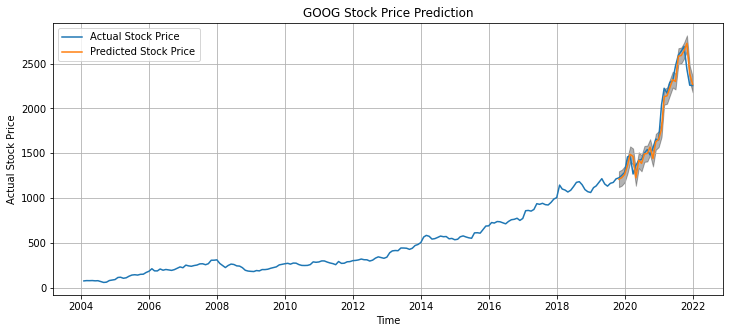

The Mean Squared Error is 11748.31
The root Mean Squared Error is 108.39


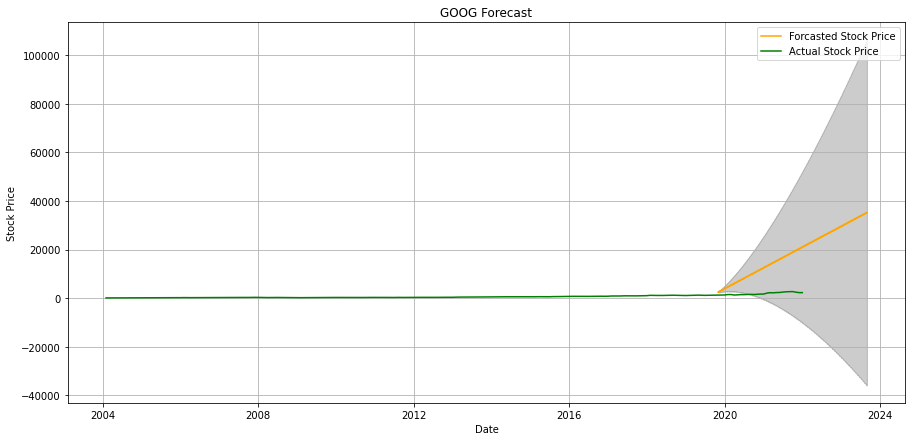

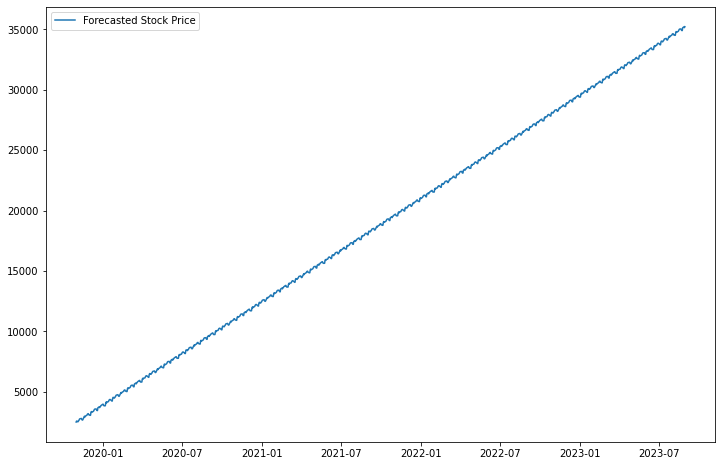

(134, 60, 1)
Epoch 1/50
5/5 [==============================] - 13s 230ms/step - loss: 0.1385
Epoch 2/50
5/5 [==============================] - 1s 210ms/step - loss: 0.0381
Epoch 3/50
5/5 [==============================] - 1s 217ms/step - loss: 0.0176
Epoch 4/50
5/5 [==============================] - 1s 238ms/step - loss: 0.0176
Epoch 5/50
5/5 [==============================] - 1s 226ms/step - loss: 0.0110
Epoch 6/50
5/5 [==============================] - 1s 239ms/step - loss: 0.0060
Epoch 7/50
5/5 [==============================] - 1s 220ms/step - loss: 0.0043
Epoch 8/50
5/5 [==============================] - 1s 226ms/step - loss: 0.0027
Epoch 9/50
5/5 [==============================] - 1s 225ms/step - loss: 0.0024
Epoch 10/50
5/5 [==============================] - 1s 235ms/step - loss: 0.0023
Epoch 11/50
5/5 [==============================] - 1s 227ms/step - loss: 0.0026
Epoch 12/50
5/5 [==============================] - 1s 209ms/step - loss: 0.0021
Epoch 13/50
5/5 [==================

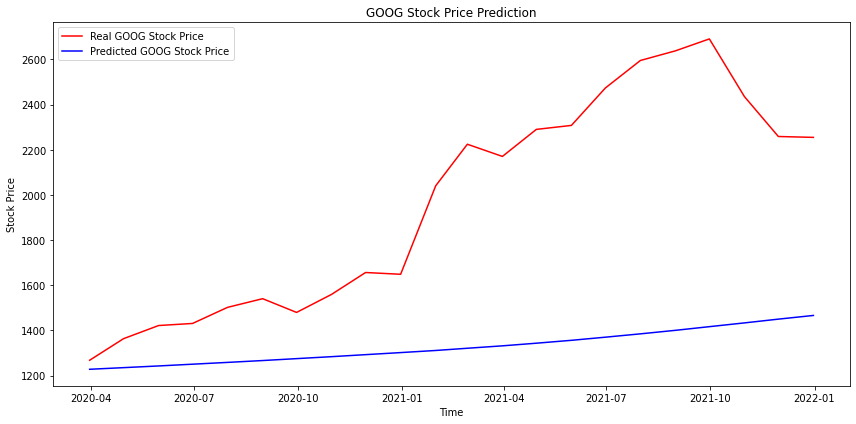

In [200]:
stock_market_prediction(faang, symbol="GOOG", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

#### NFLX

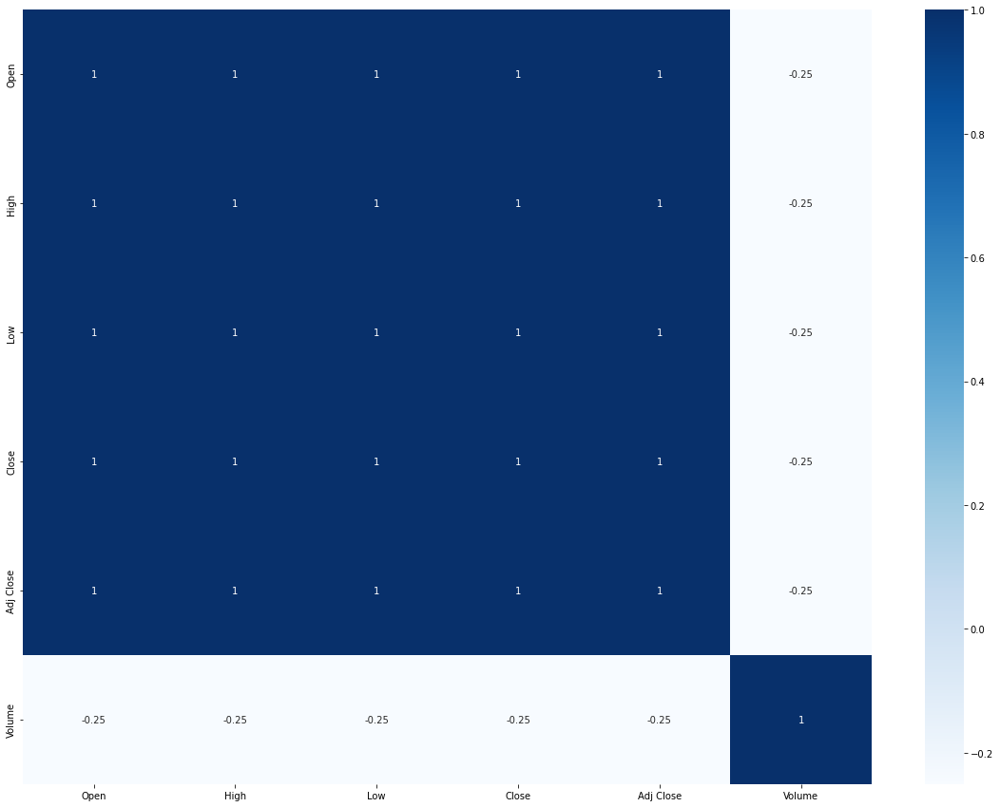

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.93709,0.998585,15,224,False,False


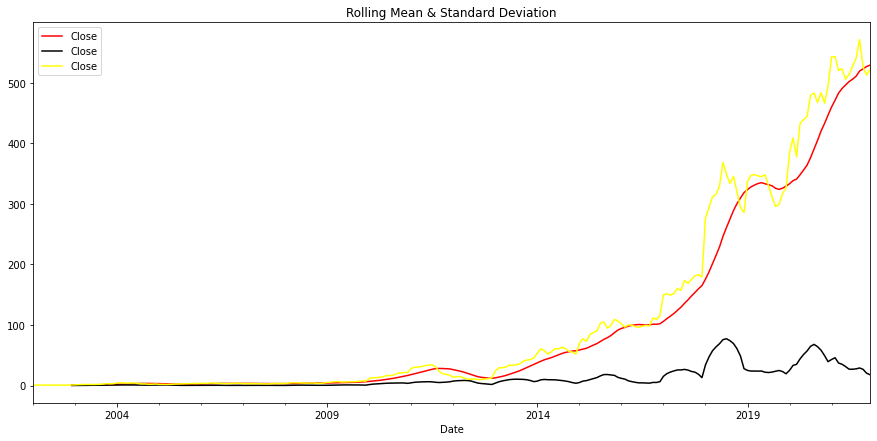

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

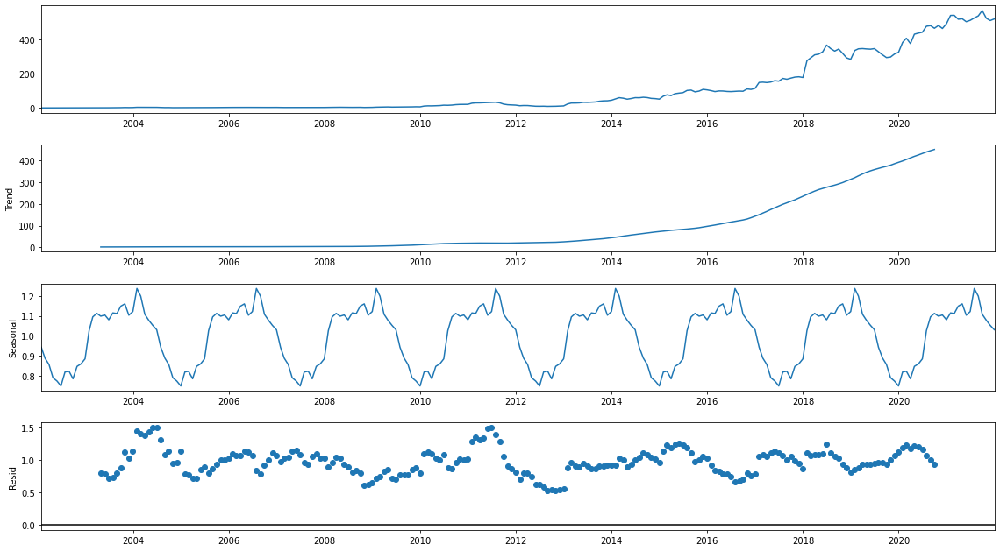

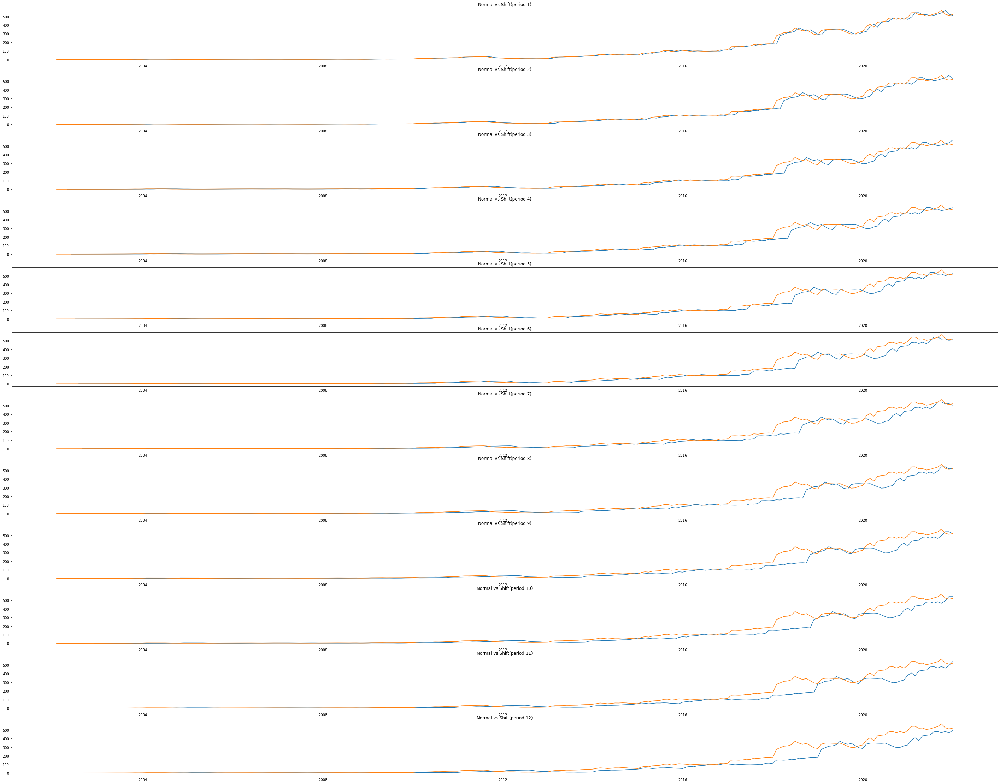

<Figure size 1080x504 with 0 Axes>

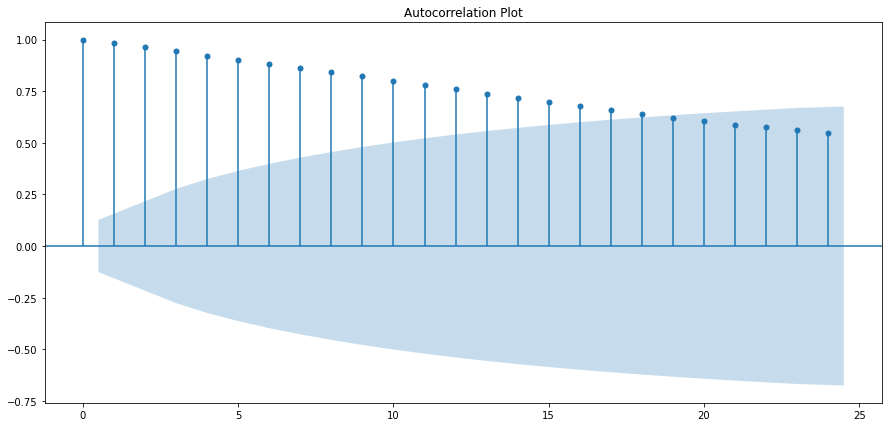

<Figure size 1080x504 with 0 Axes>

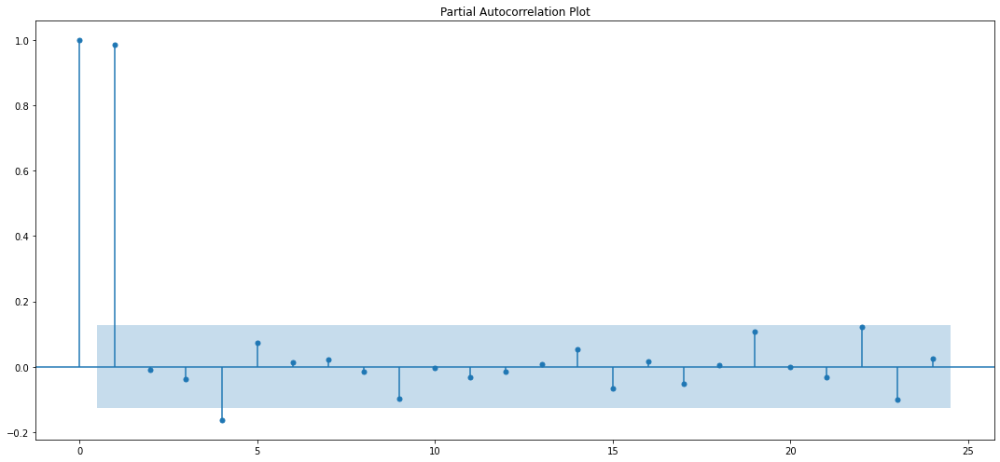

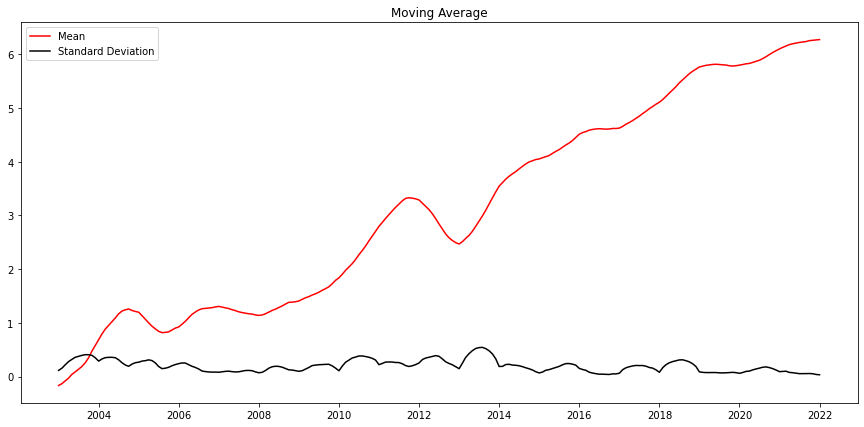

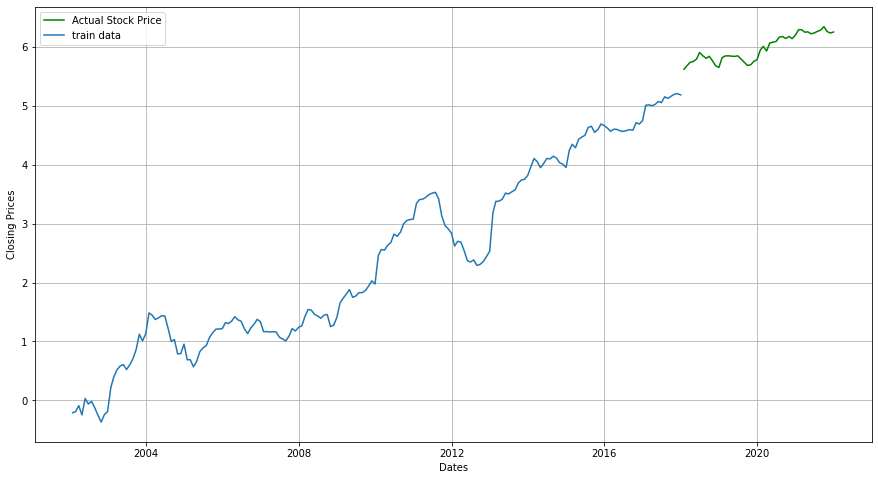

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 3196.6500042198622
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 3053.834441071179
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 2468.799553620837
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 2333.040992702983
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2341.1730081560777
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 2288.421959263541
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 2328.6428119538505
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 2246.8136956839653
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 2878.2733233427634
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 2519.851898858534
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 2210.1127397398386
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2092.9321137966886
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2131.9845844758247
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2076.9006609168355
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 2105

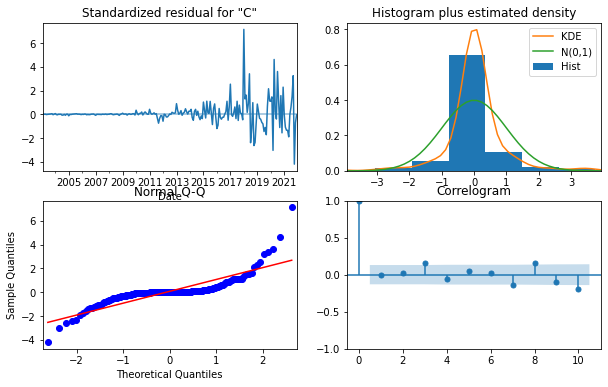

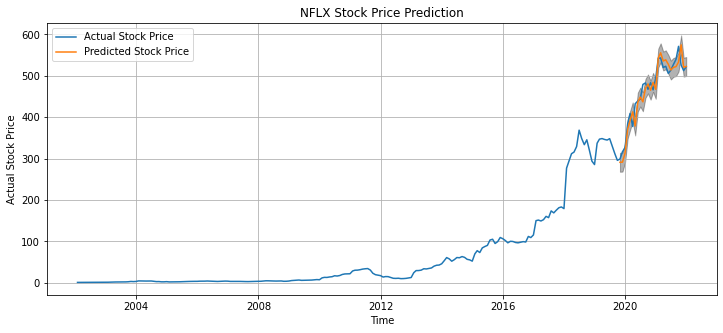

The Mean Squared Error is 532.3
The root Mean Squared Error is 23.07


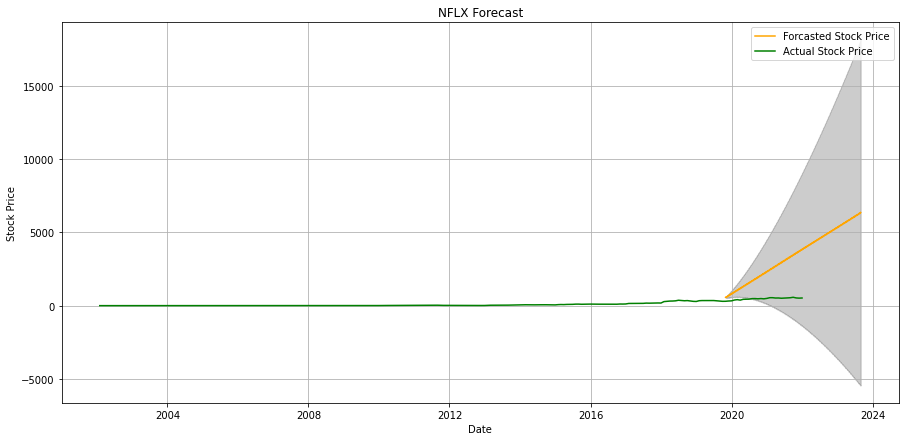

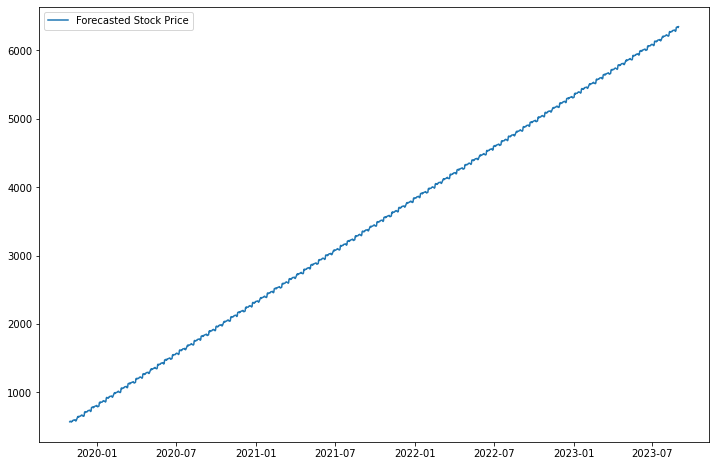

(156, 60, 1)
Epoch 1/50
5/5 [==============================] - 13s 231ms/step - loss: 0.0802
Epoch 2/50
5/5 [==============================] - 1s 215ms/step - loss: 0.0313
Epoch 3/50
5/5 [==============================] - 1s 211ms/step - loss: 0.0158
Epoch 4/50
5/5 [==============================] - 1s 209ms/step - loss: 0.0121
Epoch 5/50
5/5 [==============================] - 1s 227ms/step - loss: 0.0098
Epoch 6/50
5/5 [==============================] - 1s 235ms/step - loss: 0.0081
Epoch 7/50
5/5 [==============================] - 1s 220ms/step - loss: 0.0068
Epoch 8/50
5/5 [==============================] - 1s 225ms/step - loss: 0.0069
Epoch 9/50
5/5 [==============================] - 1s 217ms/step - loss: 0.0055
Epoch 10/50
5/5 [==============================] - 1s 214ms/step - loss: 0.0055
Epoch 11/50
5/5 [==============================] - 1s 219ms/step - loss: 0.0068
Epoch 12/50
5/5 [==============================] - 1s 226ms/step - loss: 0.0066
Epoch 13/50
5/5 [==================

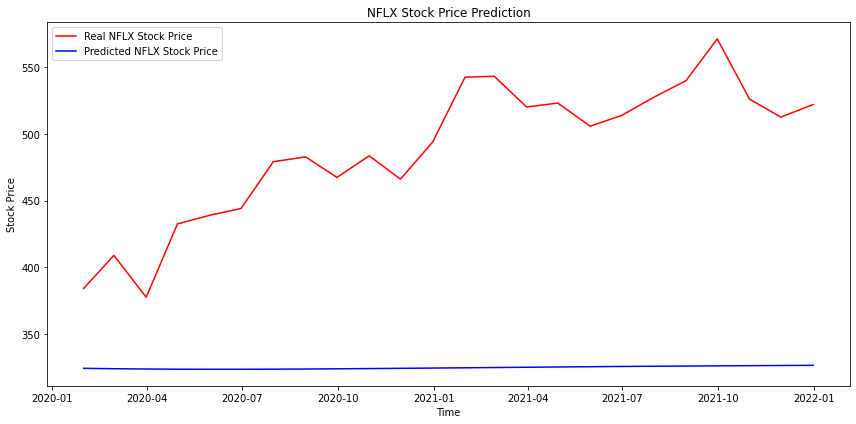

In [201]:
stock_market_prediction(faang, symbol="NFLX", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)